In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# Utils

In [7]:
def analyze_distribution(data, feature, label):
    # Vẽ Histogram và KDE
    plt.figure(figsize=(12, 6))
    sns.histplot(data[feature], kde=True, label=f'Label {label}', bins=30)
    plt.title(f'Distribution of Feature {feature} for Label {label}')
    plt.legend()
    plt.show()

    # Vẽ QQ-plot cho phân phối chuẩn
    plt.figure(figsize=(12, 6))
    stats.probplot(data[feature], dist="norm", plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Normal Distribution')
    plt.show()

    # Kiểm định phân phối chuẩn (Normal)
    mean, std = data[feature].mean(), data[feature].std()
    stat, p_value = stats.kstest(data[feature], 'norm', args=(mean, std))
    print(f'KS-test for Normal distribution (Feature {feature}, Label {label}): Statistic = {stat}, p-value = {p_value}')
    if p_value > 0.05:
        print(f"Data seems to follow a Normal distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameters: Mean = {mean}, Std = {std}')
    else:
        print(f"Data does not follow a Normal distribution (Feature {feature}, Label {label}).")

    # Vẽ QQ-plot cho phân phối t-Student
    plt.figure(figsize=(12, 6))
    stats.probplot(data[feature], dist="t", sparams=(len(data)-1,), plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with t-Student Distribution')
    plt.show()

    # Kiểm định phân phối t-Student
    shape, loc, scale = stats.t.fit(data[feature])
    stat, p_value = stats.kstest(data[feature], 't', args=(shape, loc, scale))
    print(f'KS-test for t-Student distribution (Feature {feature}, Label {label}): Statistic = {stat}, p-value = {p_value}')
    if p_value > 0.05:
        print(f"Data seems to follow a t-Student distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameters: Shape = {shape}, Location = {loc}, Scale = {scale}')
    else:
        print(f"Data does not follow a t-Student distribution (Feature {feature}, Label {label}).")

    # Vẽ QQ-plot cho phân phối Exponential
    plt.figure(figsize=(12, 6))
    stats.probplot(data[feature], dist="expon", sparams=(data[feature].min(), data[feature].mean()-data[feature].min()), plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Exponential Distribution')
    plt.show()

    # Kiểm định phân phối Exponential
    loc, scale = stats.expon.fit(data[feature])
    stat, p_value = stats.kstest(data[feature], 'expon', args=(loc, scale))
    print(f'KS-test for Exponential distribution (Feature {feature}, Label {label}): Statistic = {stat}, p-value = {p_value}')
    if p_value > 0.05:
        print(f"Data seems to follow an Exponential distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameters: Location = {loc}, Scale = {scale}')
    else:
        print(f"Data does not follow an Exponential distribution (Feature {feature}, Label {label}).")

    # Vẽ QQ-plot cho phân phối Poisson
    plt.figure(figsize=(12, 6))
    stats.probplot(data[feature], dist="poisson", sparams=(np.mean(data[feature]),), plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Poisson Distribution')
    plt.show()

    # Kiểm định phân phối Poisson
    lambda_ = np.mean(data[feature])
    poisson_stat, poisson_p_value = stats.kstest(data[feature], 'poisson', args=(lambda_,))
    print(f'KS-test for Poisson distribution (Feature {feature}, Label {label}): Statistic = {poisson_stat}, p-value = {poisson_p_value}')
    if poisson_p_value > 0.05:
        print(f"Data seems to follow a Poisson distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameter: Lambda = {lambda_}')
    else:
        print(f"Data does not follow a Poisson distribution (Feature {feature}, Label {label}).")

    # Vẽ QQ-plot cho phân phối Gamma
    plt.figure(figsize=(12, 6))
    shape, loc, scale = stats.gamma.fit(data[feature])
    stats.probplot(data[feature], dist="gamma", sparams=(shape, loc, scale), plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Gamma Distribution')
    plt.show()

    # Kiểm định phân phối Gamma
    shape, loc, scale = stats.gamma.fit(data[feature])
    gamma_stat, gamma_p_value = stats.kstest(data[feature], 'gamma', args=(shape, loc, scale))
    print(f'KS-test for Gamma distribution (Feature {feature}, Label {label}): Statistic = {gamma_stat}, p-value = {gamma_p_value}')
    if gamma_p_value > 0.05:
        print(f"Data seems to follow a Gamma distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameters: Shape = {shape}, Location = {loc}, Scale = {scale}')
    else:
        print(f"Data does not follow a Gamma distribution (Feature {feature}, Label {label}).")

    # Vẽ QQ-plot cho phân phối Beta
    plt.figure(figsize=(12, 6))
    a, b, loc, scale = stats.beta.fit(data[feature])
    stats.probplot(data[feature], dist="beta", sparams=(a, b, loc, scale), plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Beta Distribution')
    plt.show()

    # Kiểm định phân phối Beta
    a, b, loc, scale = stats.beta.fit(data[feature])
    beta_stat, beta_p_value = stats.kstest(data[feature], 'beta', args=(a, b, loc, scale))
    print(f'KS-test for Beta distribution (Feature {feature}, Label {label}): Statistic = {beta_stat}, p-value = {beta_p_value}')
    if beta_p_value > 0.05:
        print(f"Data seems to follow a Beta distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameters: a = {a}, b = {b}, Location = {loc}, Scale = {scale}')
    else:
        print(f"Data does not follow a Beta distribution (Feature {feature}, Label {label}).")

    # # Vẽ QQ-plot cho phân phối Log-Normal
    # plt.figure(figsize=(12, 6))
    # shape, loc, scale = stats.lognorm.fit(data[feature], floc=0)
    # stats.probplot(data[feature], dist="lognorm", sparams=(shape, loc, scale), plot=plt)
    # plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Log-Normal Distribution')
    # plt.show()

    # # Kiểm định phân phối Log-Normal
    # shape, loc, scale = stats.lognorm.fit(data[feature], floc=0)
    # lognorm_stat, lognorm_p_value = stats.kstest(data[feature], 'lognorm', args=(shape, loc, scale))
    # print(f'KS-test for Log-Normal distribution (Feature {feature}, Label {label}): Statistic = {lognorm_stat}, p-value = {lognorm_p_value}')
    # if lognorm_p_value > 0.05:
    #     print(f"Data seems to follow a Log-Normal distribution (Feature {feature}, Label {label}).")
    #     print(f'Estimated parameters: Shape = {shape}, Location = {loc}, Scale = {scale}')
    # else:
    #     print(f"Data does not follow a Log-Normal distribution (Feature {feature}, Label {label}).")

    # Vẽ QQ-plot cho phân phối Weibull
    plt.figure(figsize=(12, 6))
    shape, loc, scale = stats.weibull_min.fit(data[feature])
    stats.probplot(data[feature], dist="weibull_min", sparams=(shape, loc, scale), plot=plt)
    plt.title(f'QQ-Plot of Feature {feature} for Label {label} with Weibull Distribution')
    plt.show()

    # Kiểm định phân phối Weibull
    shape, loc, scale = stats.weibull_min.fit(data[feature])
    weibull_stat, weibull_p_value = stats.kstest(data[feature], 'weibull_min', args=(shape, loc, scale))
    print(f'KS-test for Weibull distribution (Feature {feature}, Label {label}): Statistic = {weibull_stat}, p-value = {weibull_p_value}')
    if weibull_p_value > 0.05:
        print(f"Data seems to follow a Weibull distribution (Feature {feature}, Label {label}).")
        print(f'Estimated parameters: Shape = {shape}, Location = {loc}, Scale = {scale}')
    else:
        print(f"Data does not follow a Weibull distribution (Feature {feature}, Label {label}).")

# Data

In [3]:
import os

os.chdir('/home/haipn/Clone/Research_ThyroidFNA_ClassAI/phase2_280824/data/processed')

In [4]:
!pwd

/home/haipn/Clone/Research_ThyroidFNA_ClassAI/phase2_280824/data/processed


In [5]:
# Đọc dữ liệu từ các file CSV
train_df = pd.read_csv('train_features.csv')
valid_df = pd.read_csv('valid_features.csv')
test_df = pd.read_csv('test_features.csv')

# Danh sách các đặc trưng và nhãn
features = ['dim_0', 'dim_1', 'dim_2']
labels = [0, 1, 2]

# Main

Analyzing dataset: Train


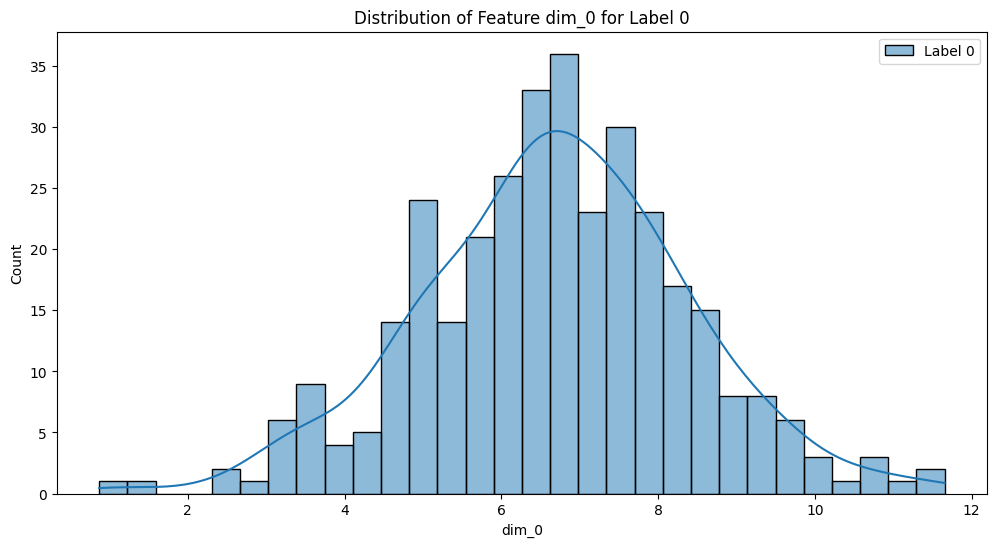

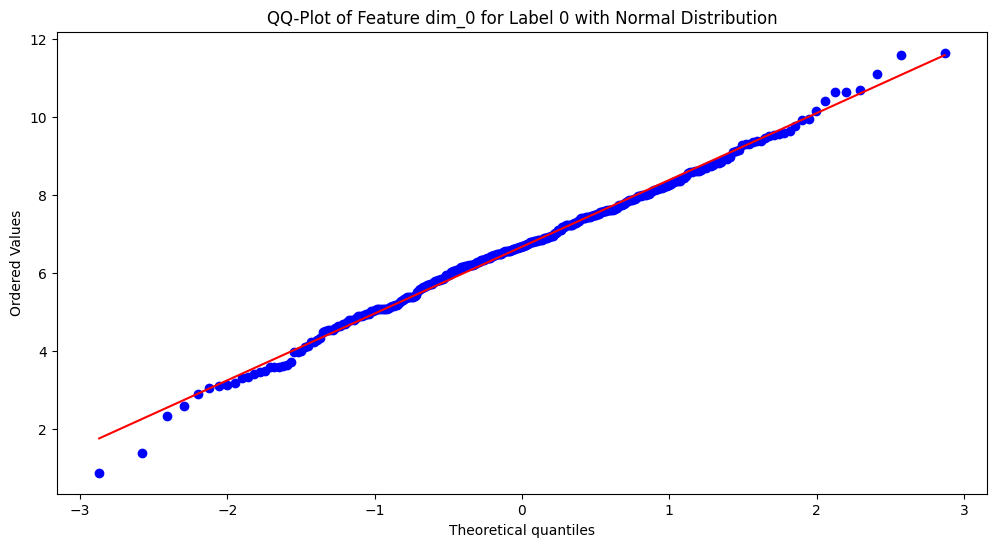

KS-test for Normal distribution (Feature dim_0, Label 0): Statistic = 0.040042477669672616, p-value = 0.6373726490918339
Data seems to follow a Normal distribution (Feature dim_0, Label 0).
Estimated parameters: Mean = 6.6730952667907015, Std = 1.7099229776136318


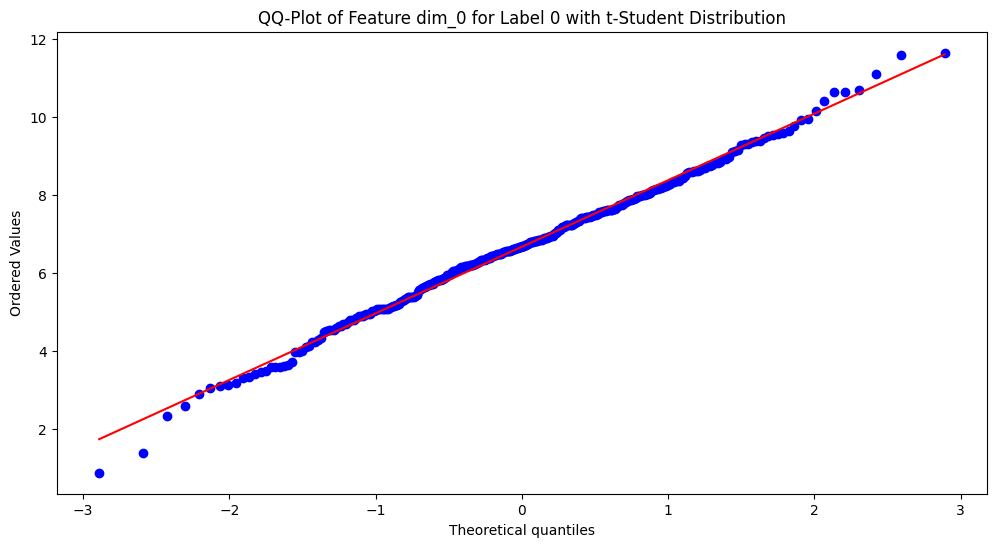

KS-test for t-Student distribution (Feature dim_0, Label 0): Statistic = 0.030657664203170176, p-value = 0.8995688032414052
Data seems to follow a t-Student distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 14.09546348144989, Location = 6.682333440864278, Scale = 1.583714636860711


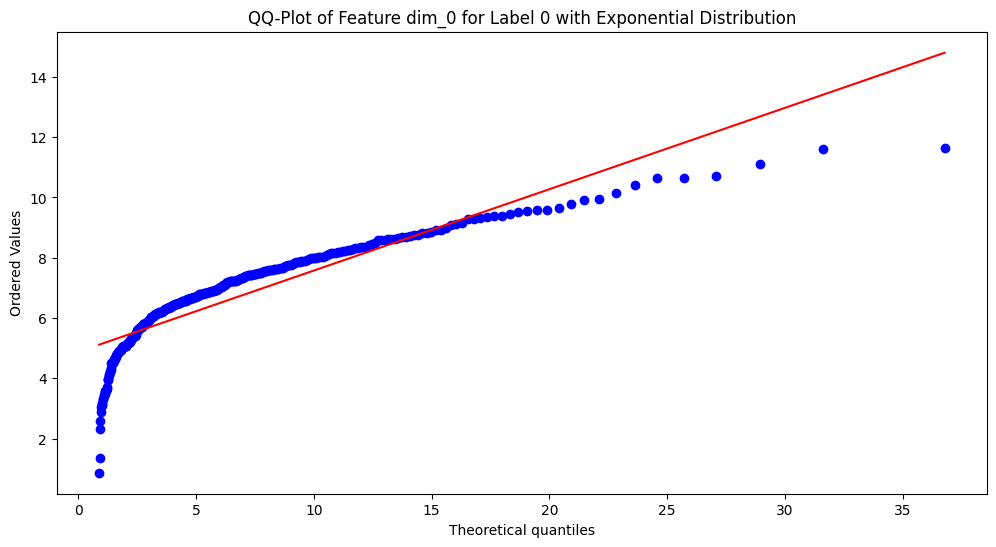

KS-test for Exponential distribution (Feature dim_0, Label 0): Statistic = 0.37839070996575896, p-value = 7.228679629715277e-44
Data does not follow an Exponential distribution (Feature dim_0, Label 0).


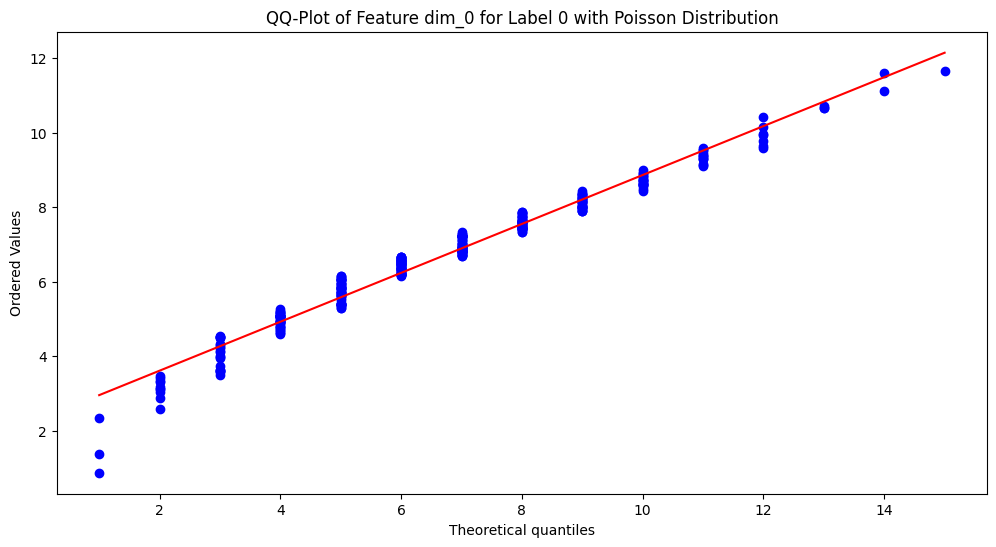

KS-test for Poisson distribution (Feature dim_0, Label 0): Statistic = 0.1930528815588527, p-value = 1.7797316533932598e-11
Data does not follow a Poisson distribution (Feature dim_0, Label 0).


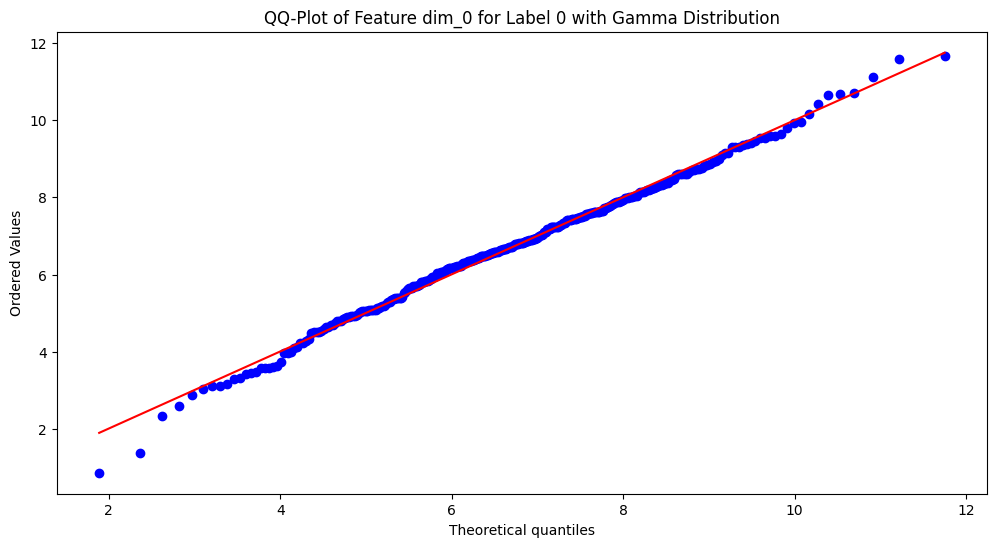

KS-test for Gamma distribution (Feature dim_0, Label 0): Statistic = 0.04516105207128657, p-value = 0.4837833819173125
Data seems to follow a Gamma distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 779.1498046041779, Location = -41.27498577209647, Scale = 0.061535159717182986


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


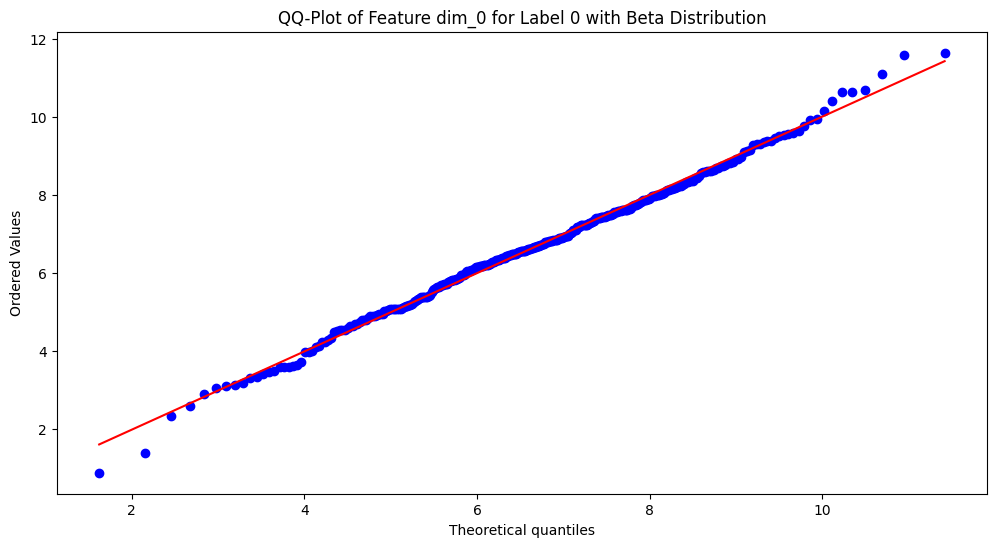

KS-test for Beta distribution (Feature dim_0, Label 0): Statistic = 0.03562166255589283, p-value = 0.772027267738908
Data seems to follow a Beta distribution (Feature dim_0, Label 0).
Estimated parameters: a = 3871.6955524291116, b = 485.45985830190307, Location = -311.50158332552326, Scale = 358.0706154492857


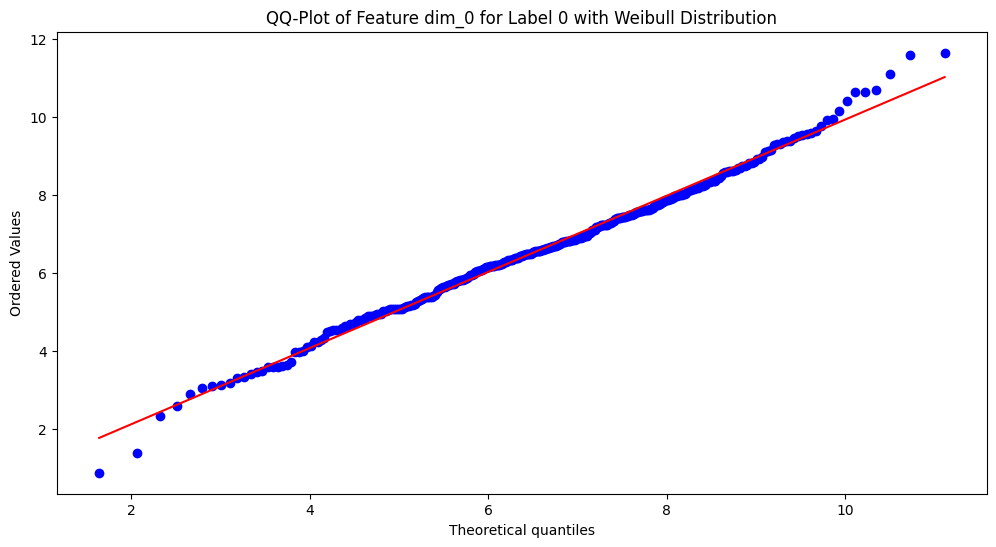

KS-test for Weibull distribution (Feature dim_0, Label 0): Statistic = 0.03926363049197612, p-value = 0.6615008831534592
Data seems to follow a Weibull distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 4.513522033685631, Location = -0.29547851909083717, Scale = 7.619142367473623


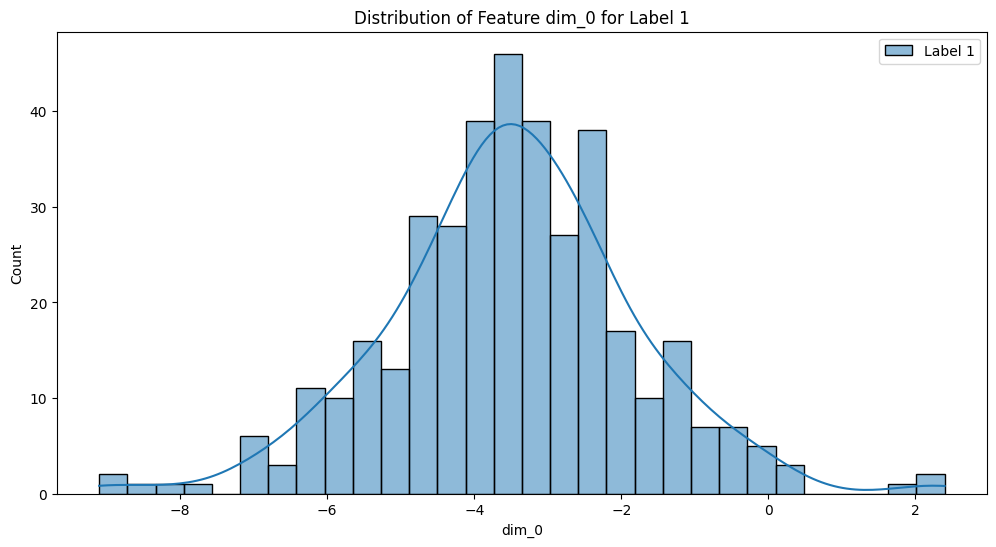

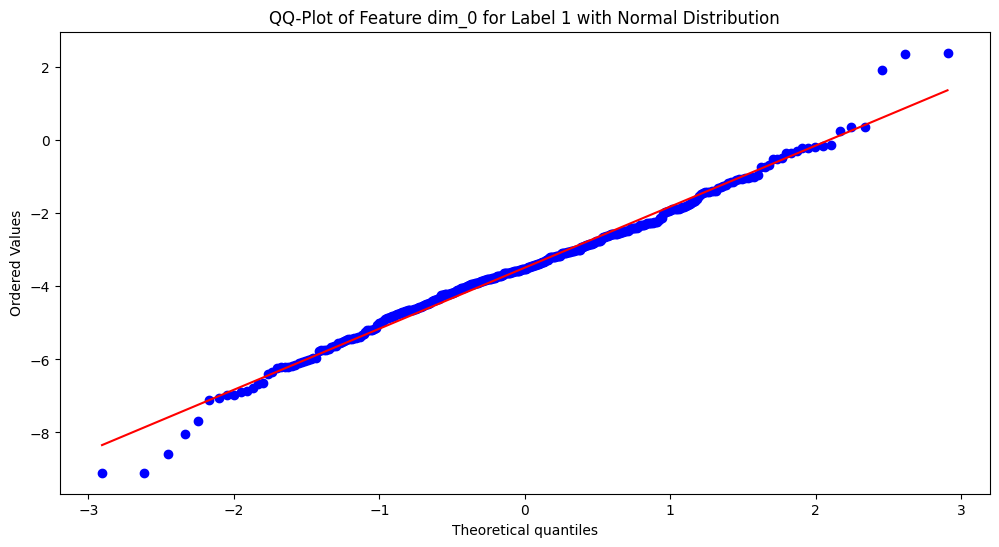

KS-test for Normal distribution (Feature dim_0, Label 1): Statistic = 0.047096066333404685, p-value = 0.3602864755533288
Data seems to follow a Normal distribution (Feature dim_0, Label 1).
Estimated parameters: Mean = -3.4882447721150815, Std = 1.6740043543332306


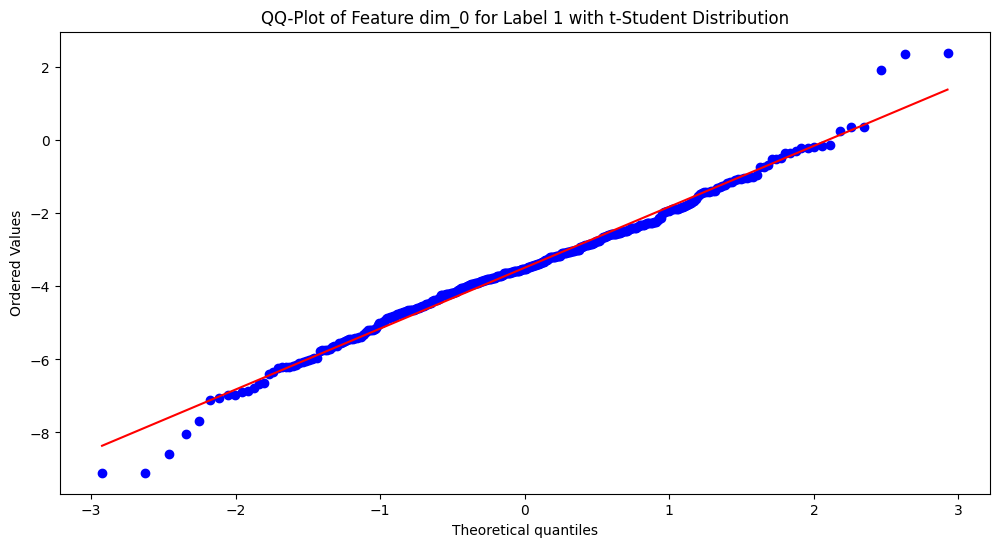

KS-test for t-Student distribution (Feature dim_0, Label 1): Statistic = 0.024246225821293765, p-value = 0.9755120735841096
Data seems to follow a t-Student distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 6.887969994494039, Location = -3.4826628121412195, Scale = 1.4173412983965794


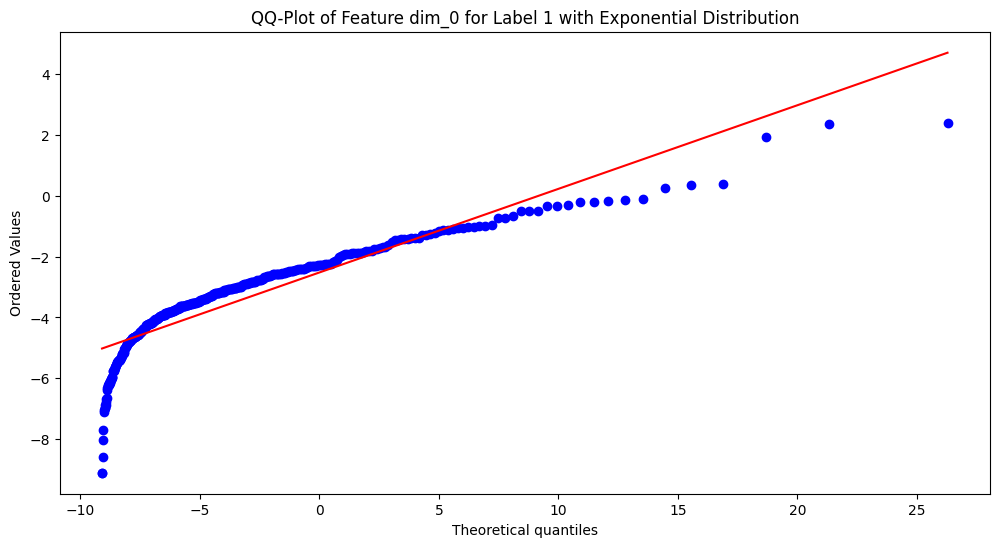

KS-test for Exponential distribution (Feature dim_0, Label 1): Statistic = 0.37125948284940835, p-value = 2.912313350879187e-47
Data does not follow an Exponential distribution (Feature dim_0, Label 1).


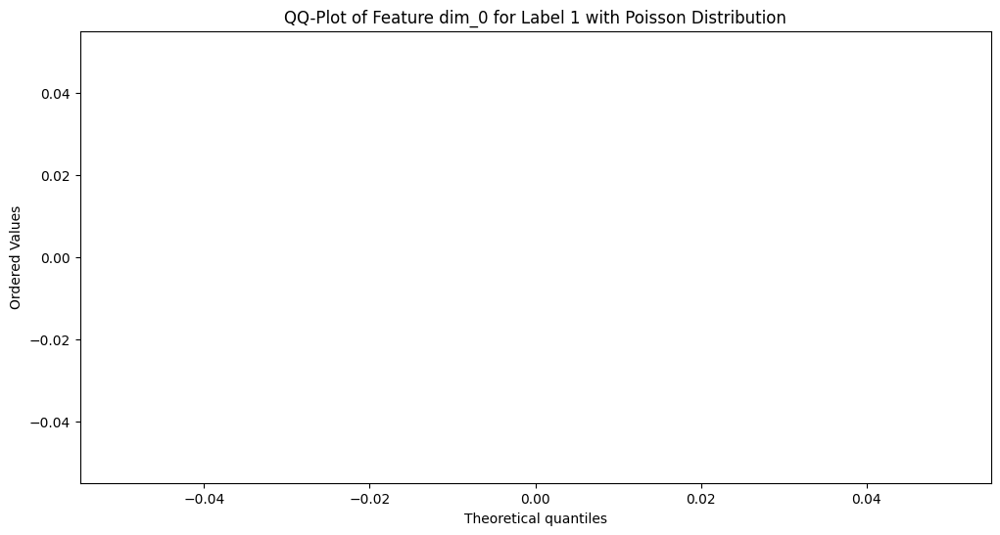

KS-test for Poisson distribution (Feature dim_0, Label 1): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_0, Label 1).


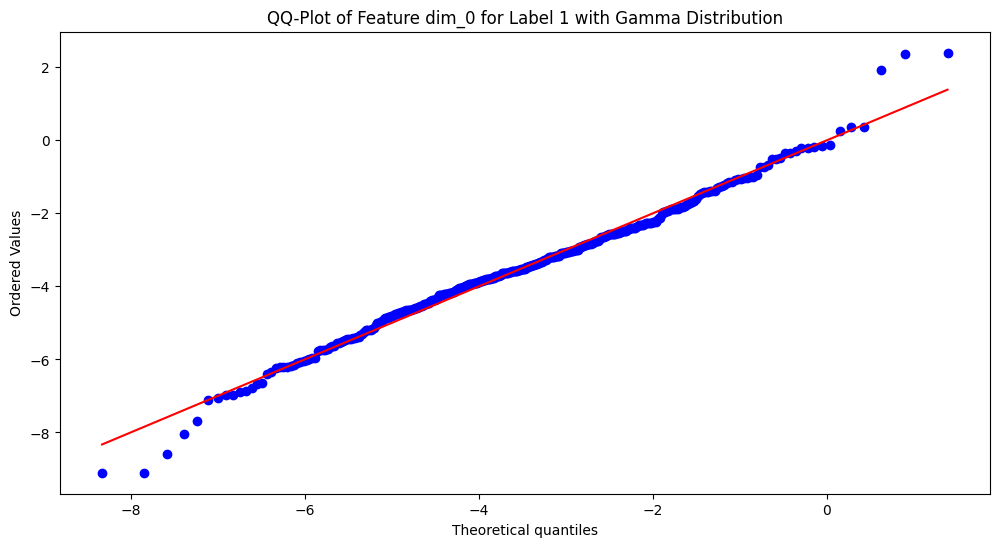

KS-test for Gamma distribution (Feature dim_0, Label 1): Statistic = 0.046594266738736456, p-value = 0.3731997755023644
Data seems to follow a Gamma distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 60316.4228784999, Location = -414.07954832755036, Scale = 0.006807286023494306


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


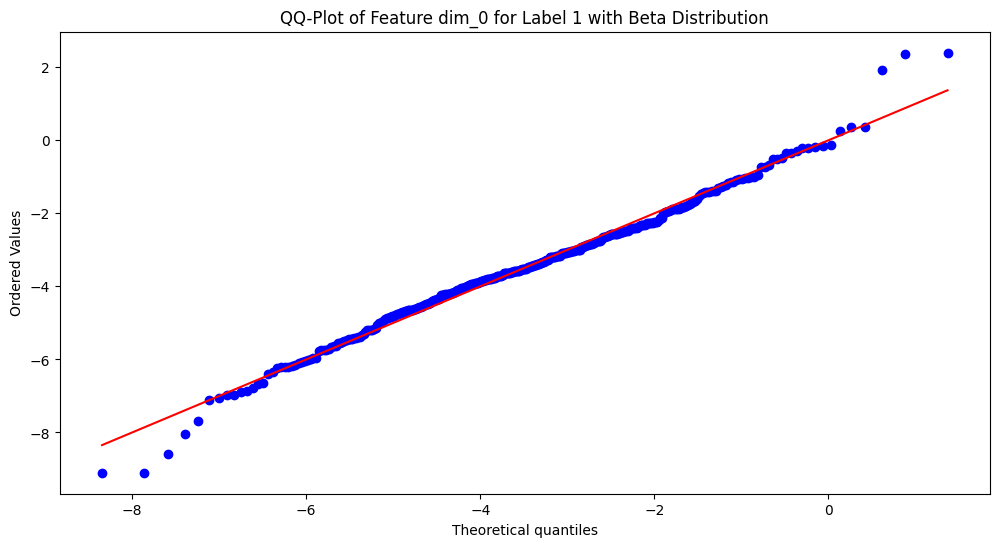

KS-test for Beta distribution (Feature dim_0, Label 1): Statistic = 0.04680123362428279, p-value = 0.36783850974941956
Data seems to follow a Beta distribution (Feature dim_0, Label 1).
Estimated parameters: a = 1613563.577112064, b = 1316845.9599522152, Location = -3171.384901551907, Scale = 5753.249943575685


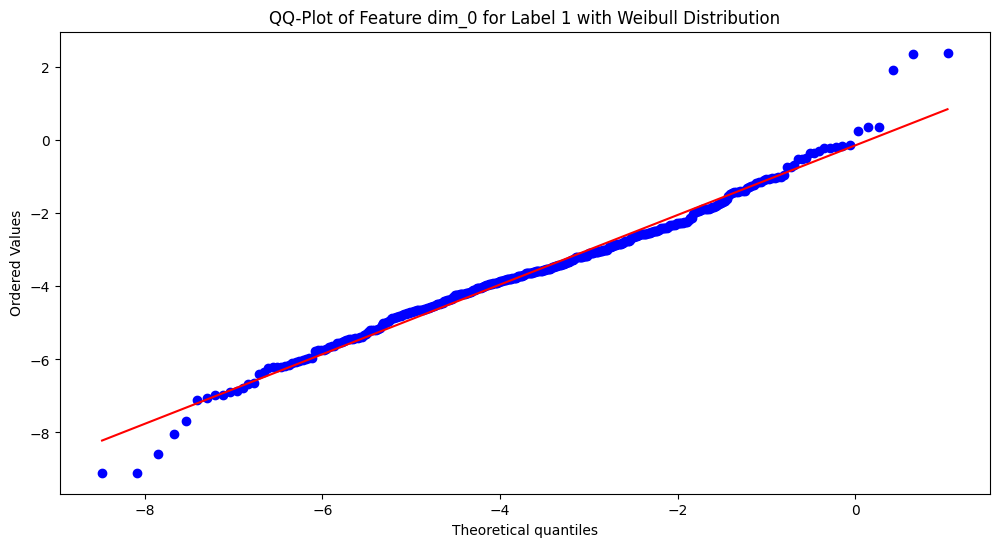

KS-test for Weibull distribution (Feature dim_0, Label 1): Statistic = 0.06112556230225463, p-value = 0.1138159205979673
Data seems to follow a Weibull distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 4.315217875985437, Location = -10.1824649770539, Scale = 7.323980739994836


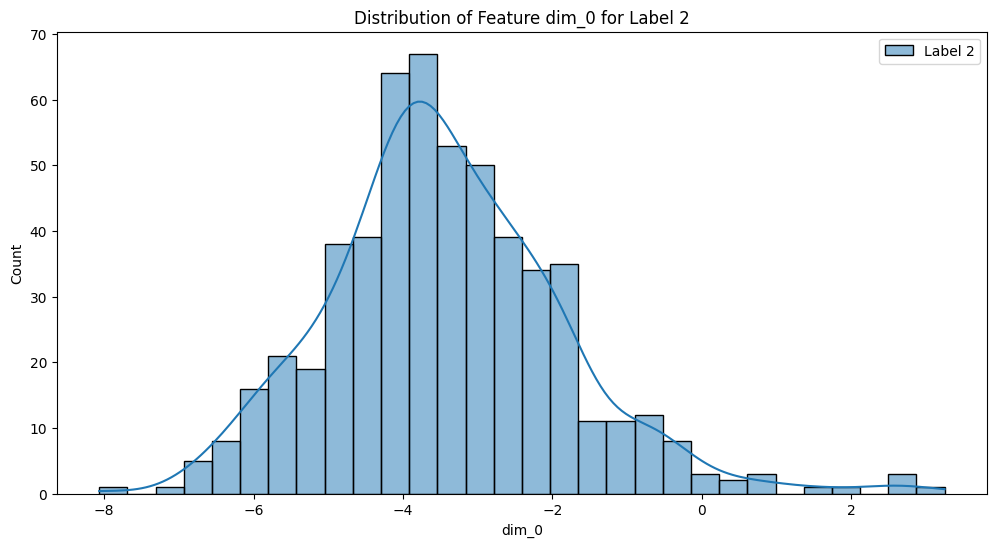

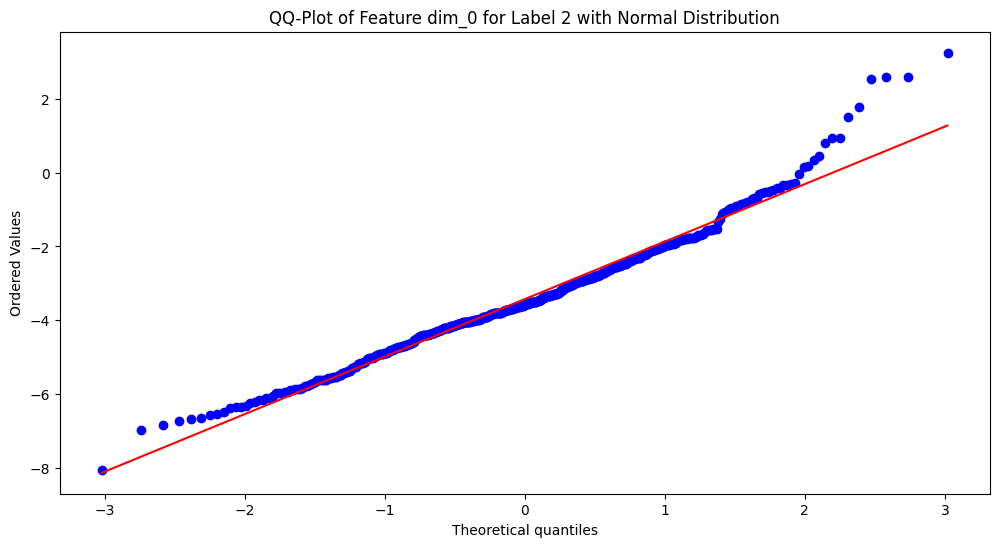

KS-test for Normal distribution (Feature dim_0, Label 2): Statistic = 0.05564988238010782, p-value = 0.06542883258181875
Data seems to follow a Normal distribution (Feature dim_0, Label 2).
Estimated parameters: Mean = -3.4285463575587602, Std = 1.5730853500789983


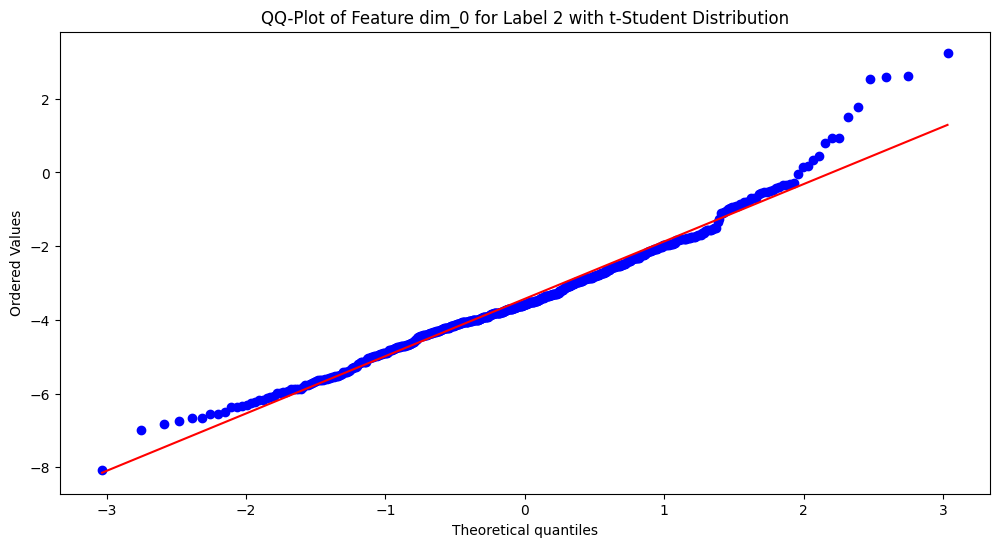

KS-test for t-Student distribution (Feature dim_0, Label 2): Statistic = 0.03221903723820441, p-value = 0.6106052178867643
Data seems to follow a t-Student distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 6.741591270675432, Location = -3.49702852240671, Scale = 1.3222121093801271


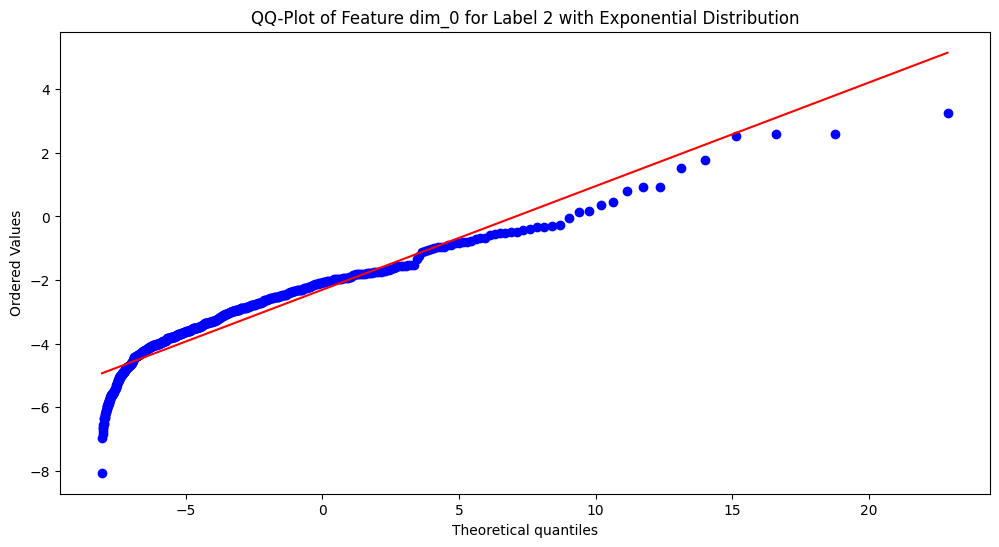

KS-test for Exponential distribution (Feature dim_0, Label 2): Statistic = 0.34915858613270756, p-value = 5.332863187959442e-60
Data does not follow an Exponential distribution (Feature dim_0, Label 2).


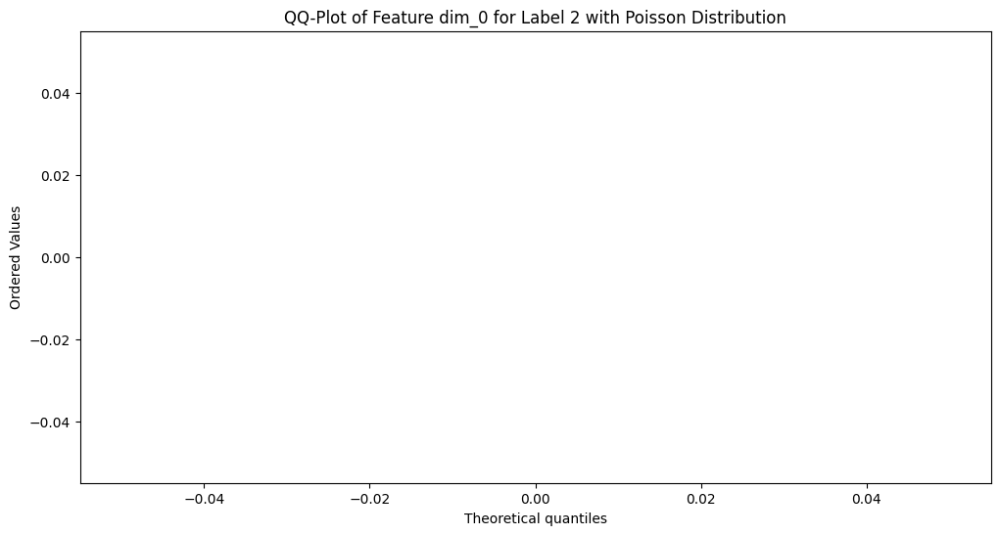

KS-test for Poisson distribution (Feature dim_0, Label 2): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_0, Label 2).


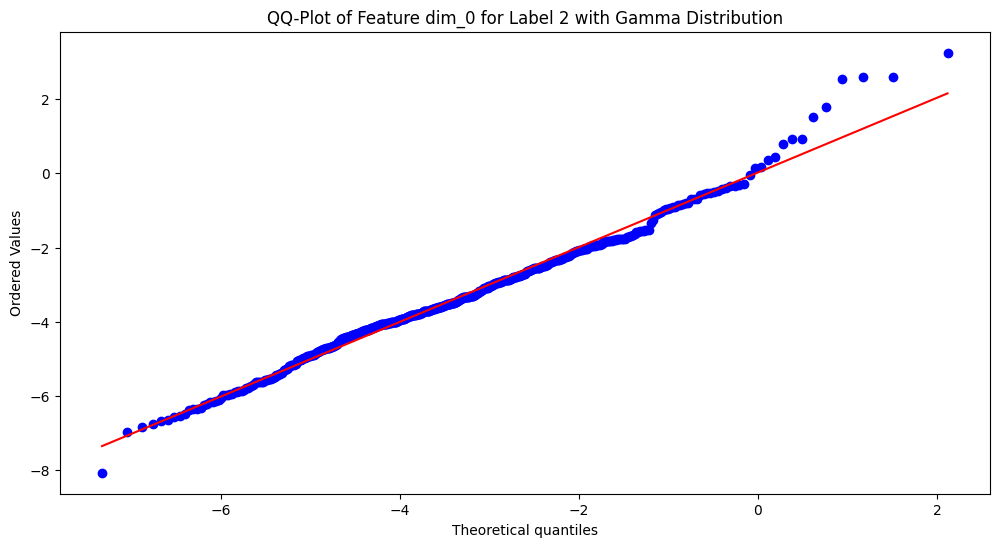

KS-test for Gamma distribution (Feature dim_0, Label 2): Statistic = 0.04551657225331632, p-value = 0.20175318589681013
Data seems to follow a Gamma distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 25.896682047721583, Location = -11.36843138701298, Scale = 0.3065985392143624


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


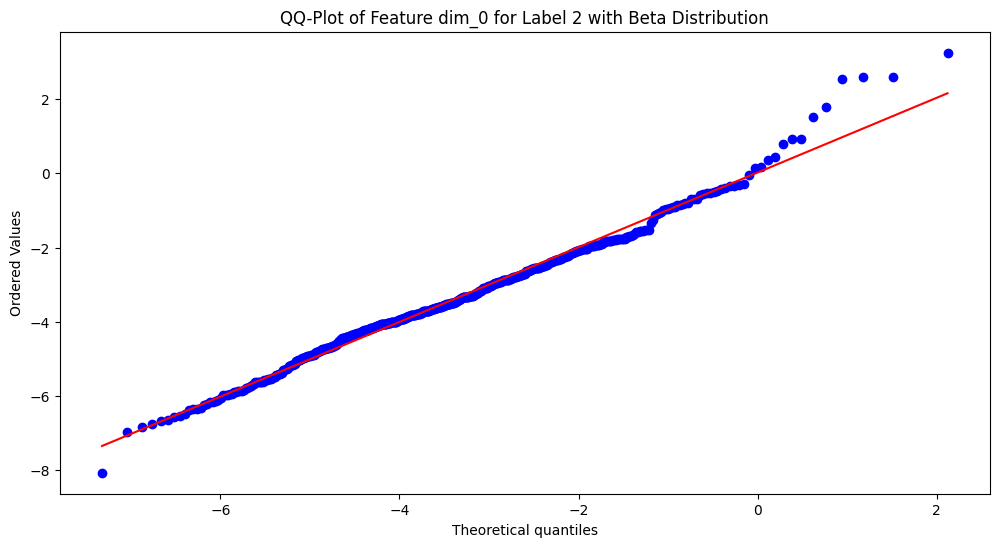

KS-test for Beta distribution (Feature dim_0, Label 2): Statistic = 0.045472022190525346, p-value = 0.20265191977369412
Data seems to follow a Beta distribution (Feature dim_0, Label 2).
Estimated parameters: a = 25.644424067641424, b = 40519.847776150506, Location = -11.331983019506154, Scale = 12496.513132548862


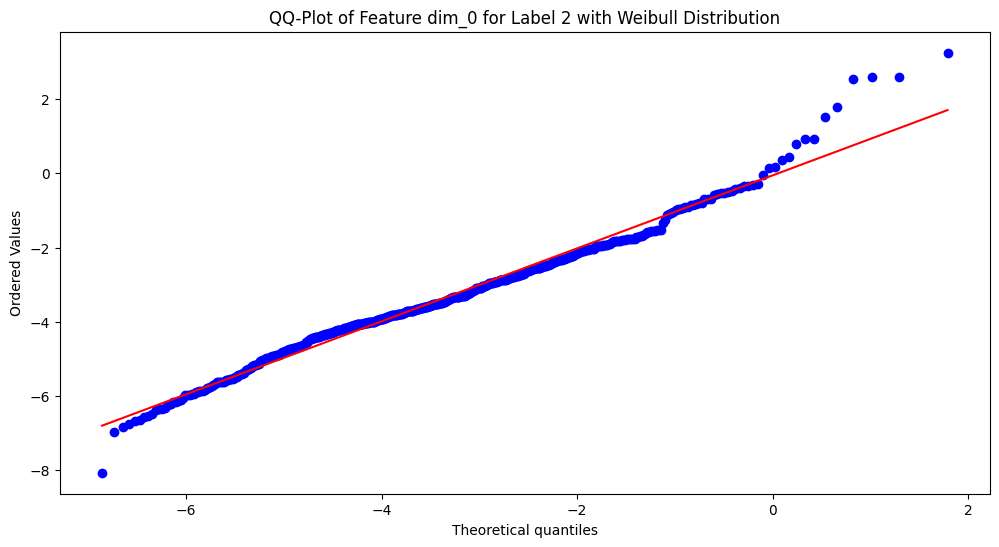

KS-test for Weibull distribution (Feature dim_0, Label 2): Statistic = 0.05972136474542547, p-value = 0.03904710461385086
Data does not follow a Weibull distribution (Feature dim_0, Label 2).


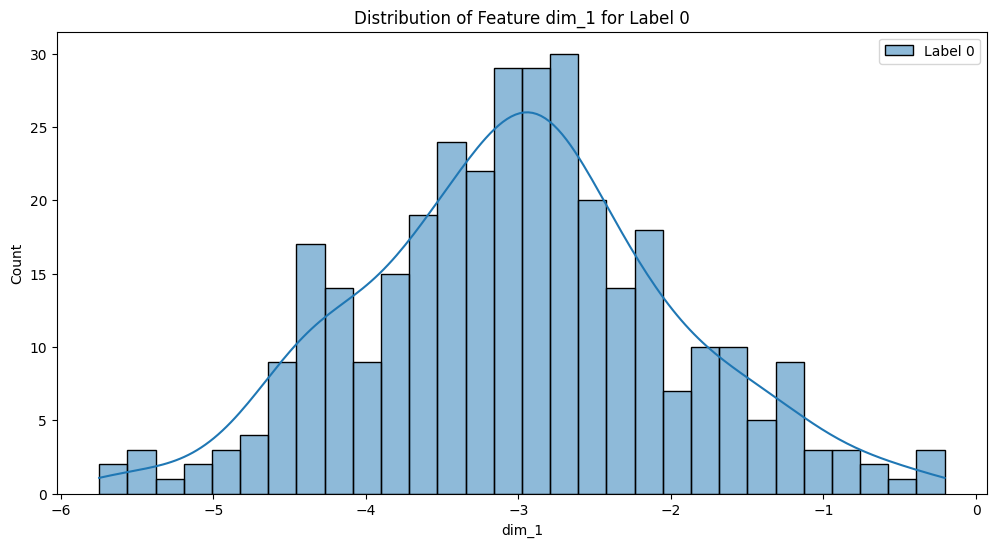

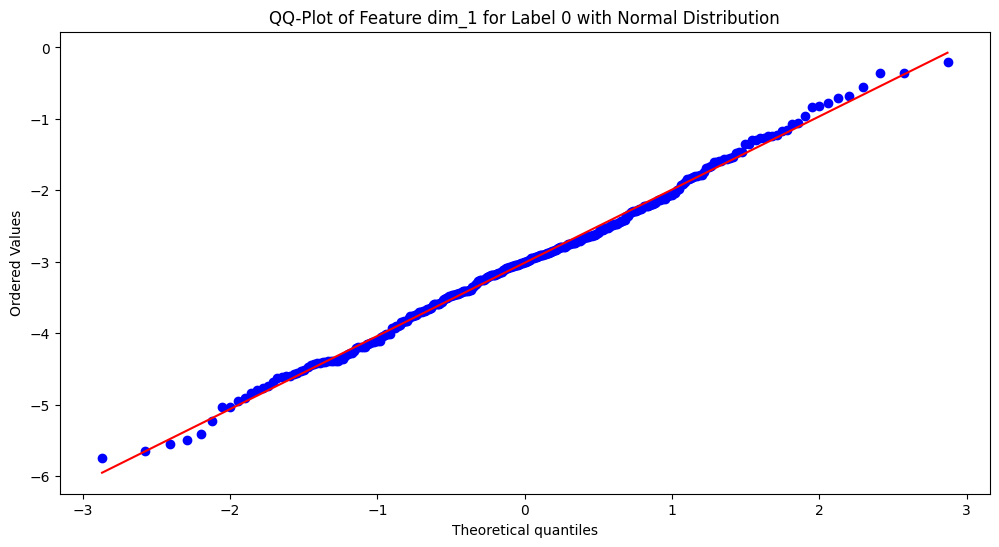

KS-test for Normal distribution (Feature dim_1, Label 0): Statistic = 0.03727908406410496, p-value = 0.7225536360879004
Data seems to follow a Normal distribution (Feature dim_1, Label 0).
Estimated parameters: Mean = -3.0121014564787245, Std = 1.0196592716038102


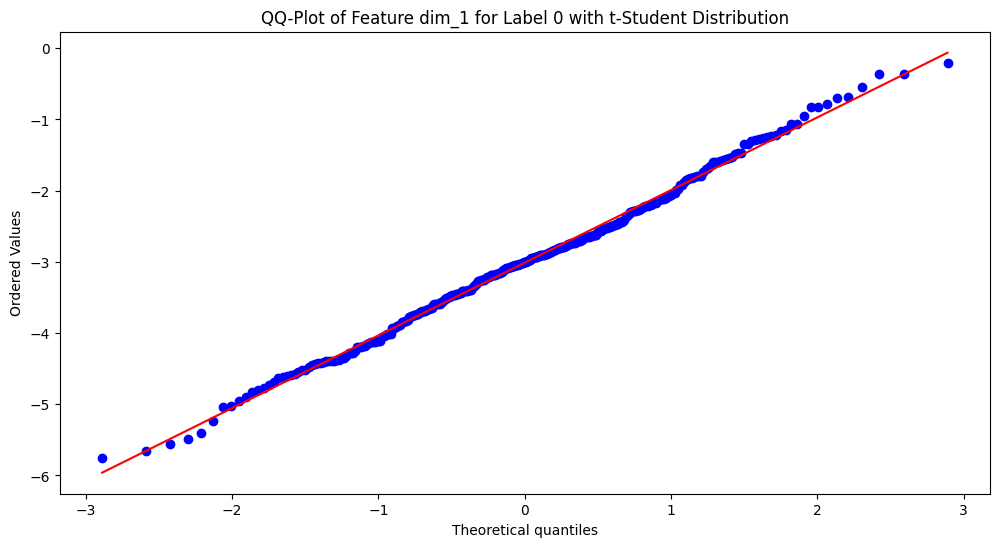

KS-test for t-Student distribution (Feature dim_1, Label 0): Statistic = 0.037043221460074216, p-value = 0.7297091081381815
Data seems to follow a t-Student distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 5950.827878483189, Location = -3.012115508088379, Scale = 1.0179750456734245


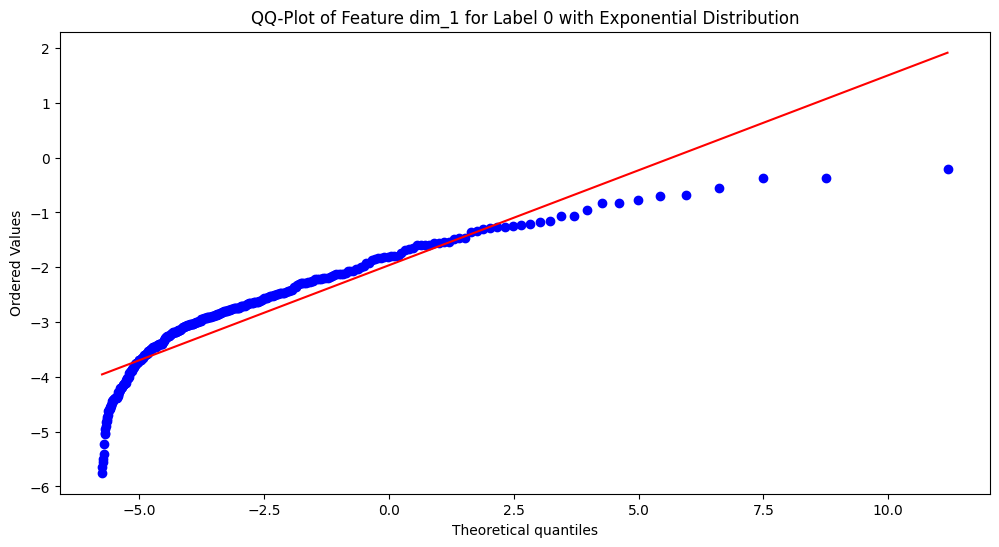

KS-test for Exponential distribution (Feature dim_1, Label 0): Statistic = 0.30815468809951213, p-value = 6.519193984038843e-29
Data does not follow an Exponential distribution (Feature dim_1, Label 0).


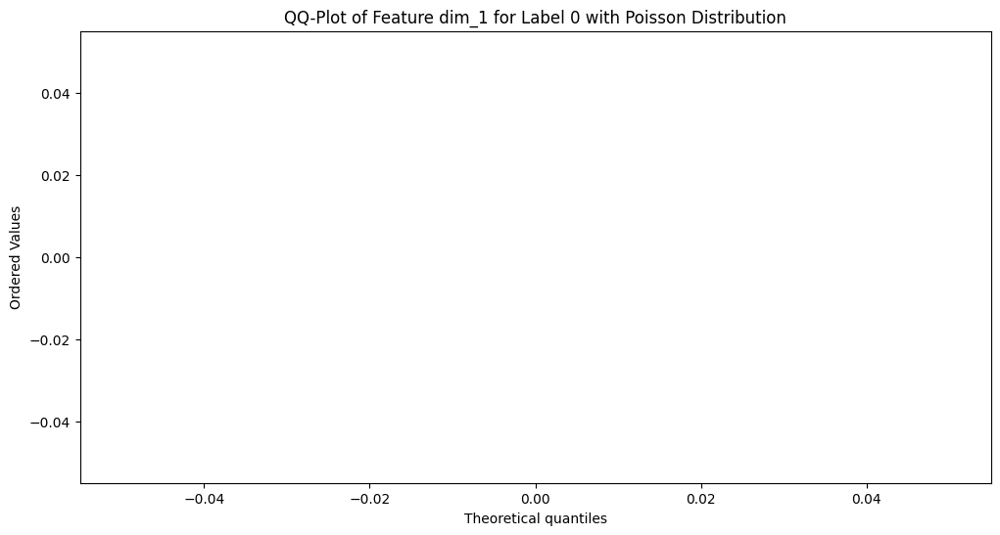

KS-test for Poisson distribution (Feature dim_1, Label 0): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_1, Label 0).


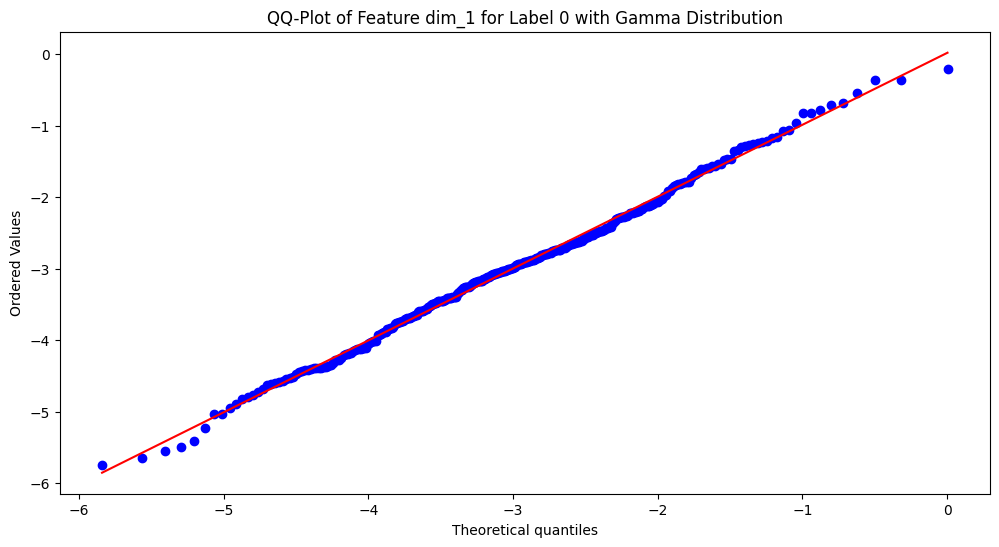

KS-test for Gamma distribution (Feature dim_1, Label 0): Statistic = 0.033093726595326944, p-value = 0.8419926963239271
Data seems to follow a Gamma distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 691.2008036865407, Location = -29.779913352120417, Scale = 0.038726534438674465


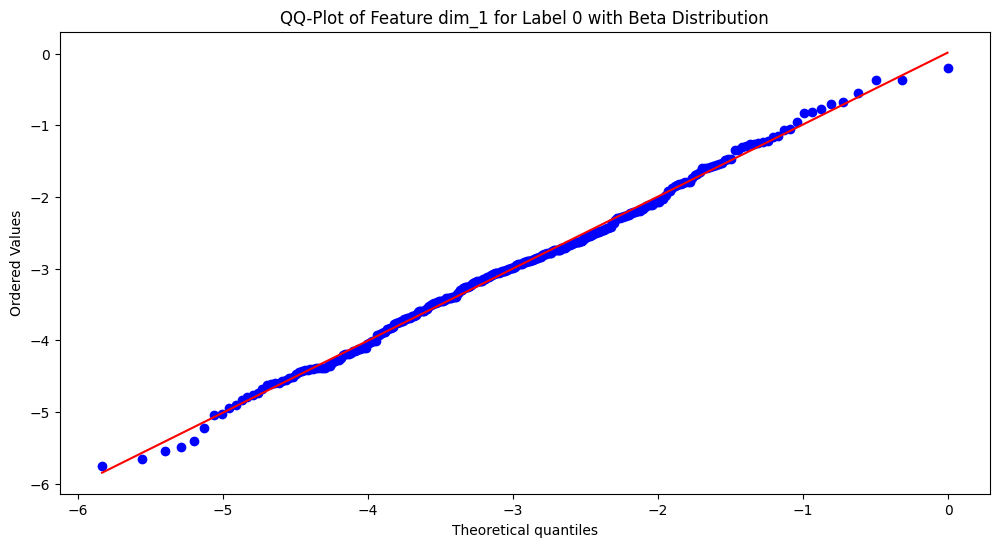

KS-test for Beta distribution (Feature dim_1, Label 0): Statistic = 0.033339431254557295, p-value = 0.8355835960036999
Data seems to follow a Beta distribution (Feature dim_1, Label 0).
Estimated parameters: a = 147.61309117437918, b = 329.37210489121117, Location = -17.91376234170754, Scale = 48.152086920438066


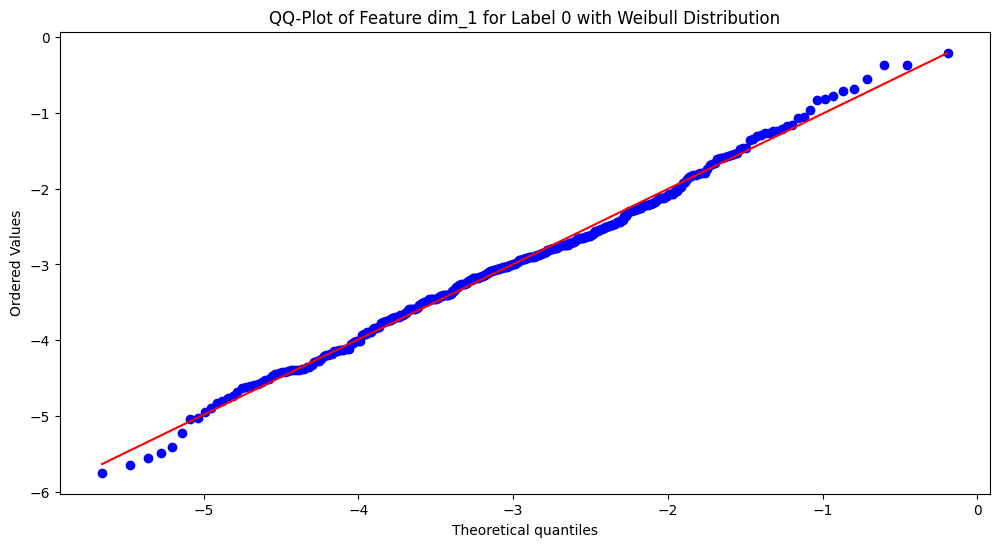

KS-test for Weibull distribution (Feature dim_1, Label 0): Statistic = 0.04338525169874896, p-value = 0.5354717645167355
Data seems to follow a Weibull distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 3.525242271459514, Location = -6.285599658017457, Scale = 3.6331684522832486


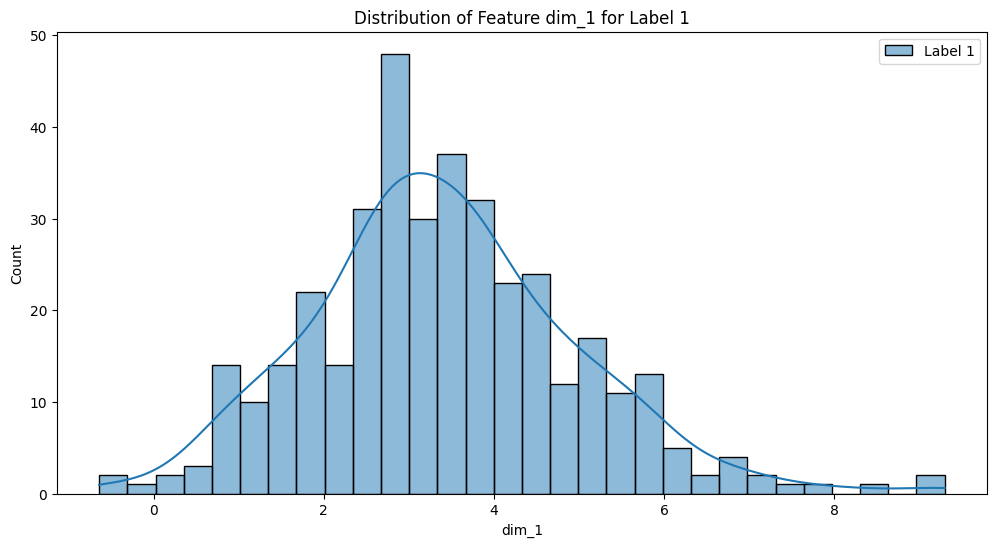

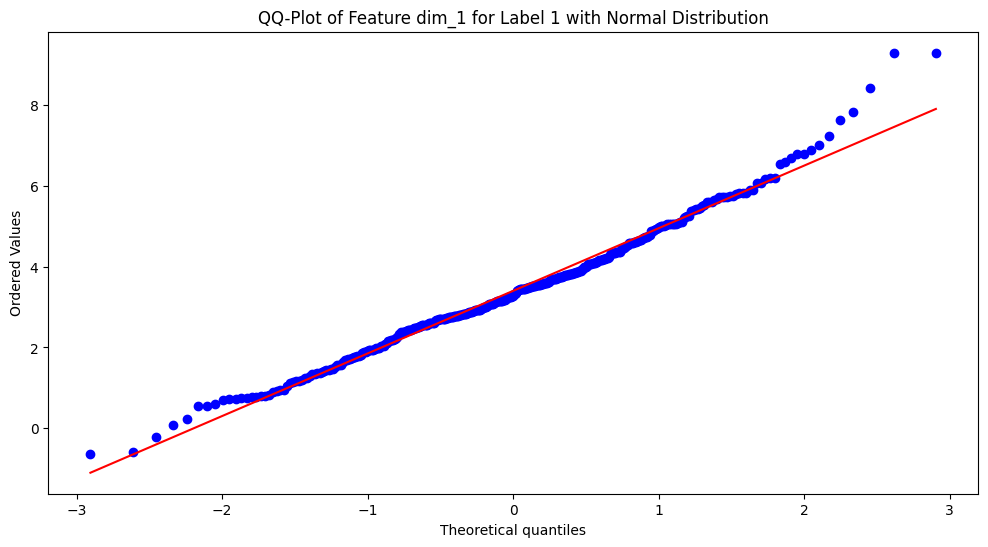

KS-test for Normal distribution (Feature dim_1, Label 1): Statistic = 0.056442767687892914, p-value = 0.1730994174592072
Data seems to follow a Normal distribution (Feature dim_1, Label 1).
Estimated parameters: Mean = 3.400910885285133, Std = 1.554637383396044


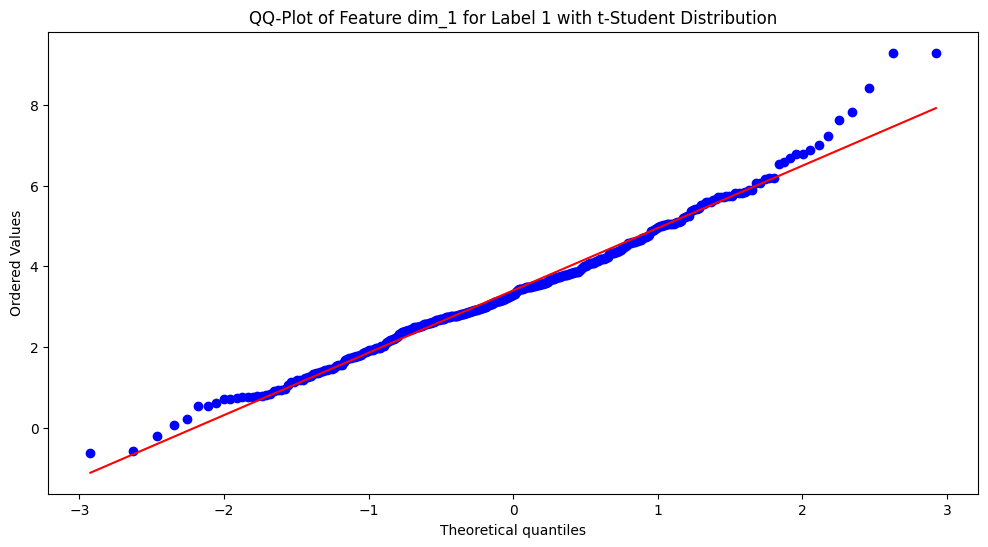

KS-test for t-Student distribution (Feature dim_1, Label 1): Statistic = 0.034463030108380366, p-value = 0.7468607042291524
Data seems to follow a t-Student distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 9.750214897481058, Location = 3.3563756179056035, Scale = 1.3858427392089983


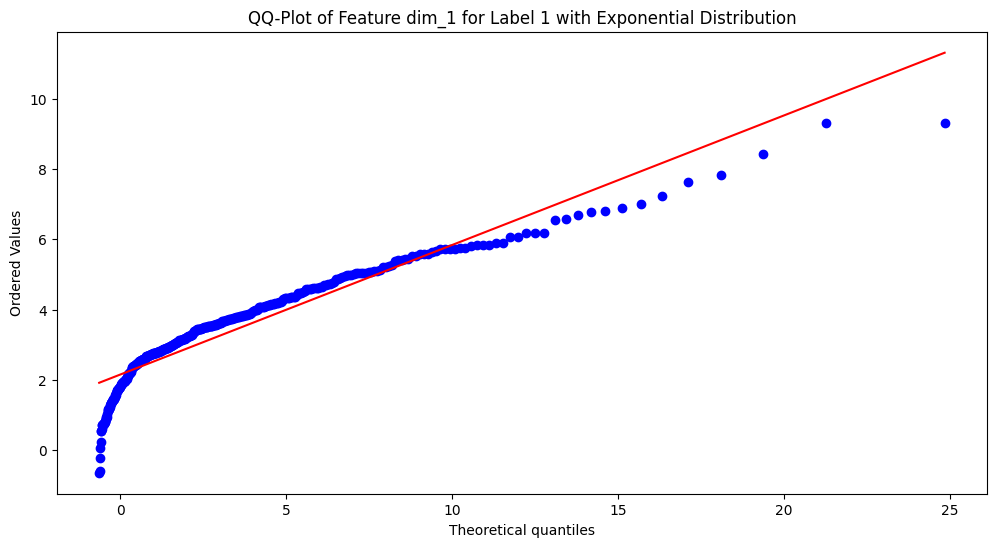

KS-test for Exponential distribution (Feature dim_1, Label 1): Statistic = 0.314916500732171, p-value = 8.090582309065859e-34
Data does not follow an Exponential distribution (Feature dim_1, Label 1).


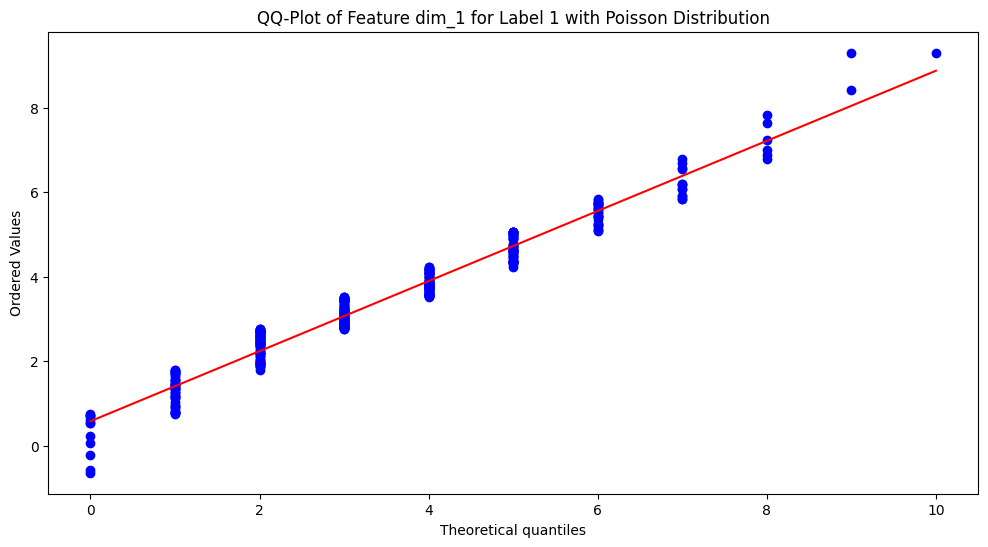

KS-test for Poisson distribution (Feature dim_1, Label 1): Statistic = 0.15967003375873706, p-value = 6.931497194796984e-09
Data does not follow a Poisson distribution (Feature dim_1, Label 1).


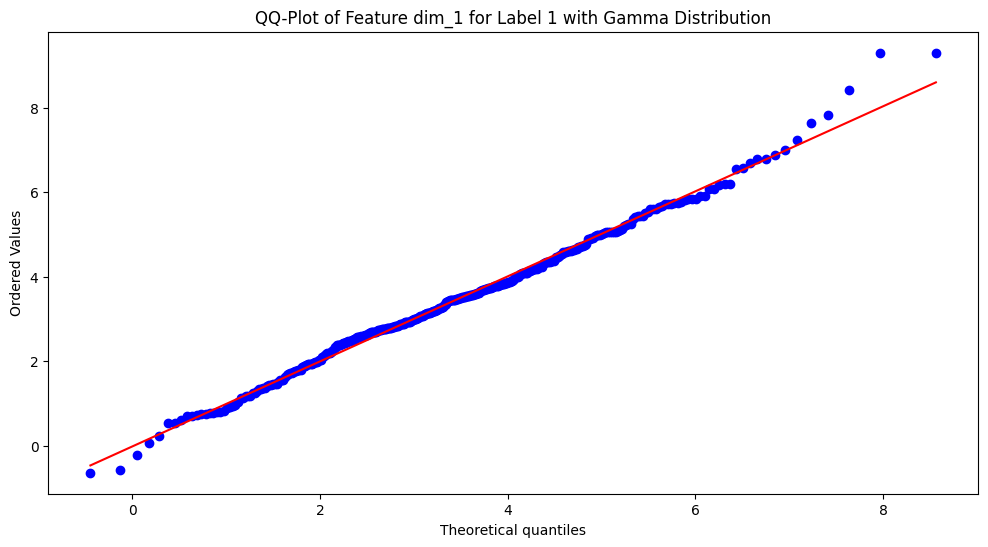

KS-test for Gamma distribution (Feature dim_1, Label 1): Statistic = 0.04465174374333006, p-value = 0.4258666122478868
Data seems to follow a Gamma distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 33.85089677990756, Location = -5.603690003281153, Scale = 0.2660077469497708


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


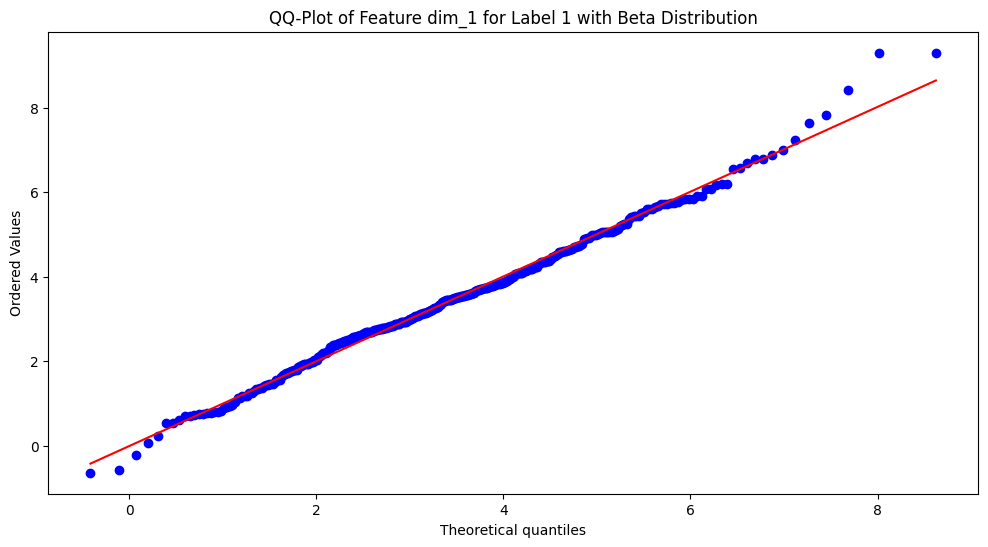

KS-test for Beta distribution (Feature dim_1, Label 1): Statistic = 0.045950382171605714, p-value = 0.3901916701183539
Data seems to follow a Beta distribution (Feature dim_1, Label 1).
Estimated parameters: a = 29.758872999822735, b = 860342.1970386351, Location = -5.069598666107444, Scale = 244910.896646292


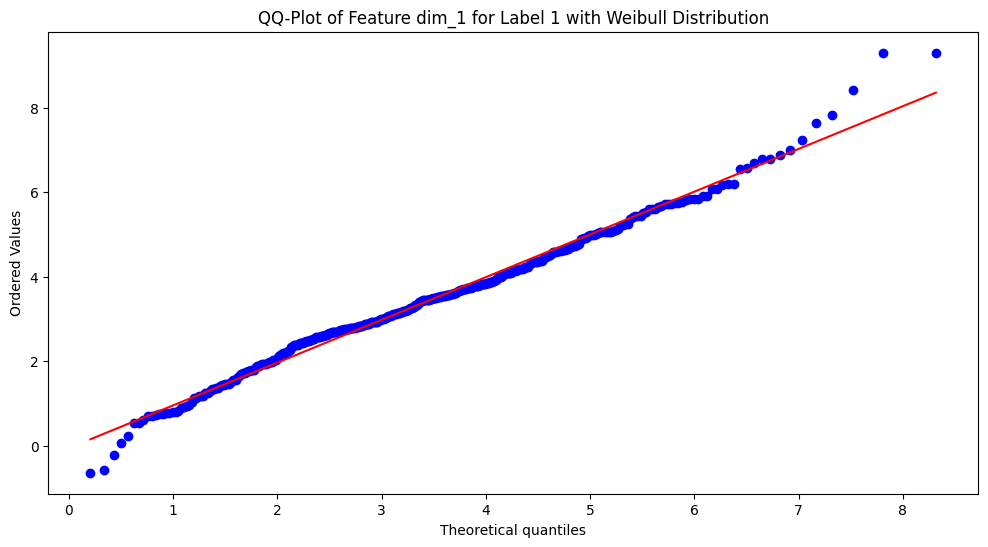

KS-test for Weibull distribution (Feature dim_1, Label 1): Statistic = 0.050332097799841796, p-value = 0.2841002992977575
Data seems to follow a Weibull distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 2.448853465779996, Location = -0.0965613881923841, Scale = 3.9671177910839237


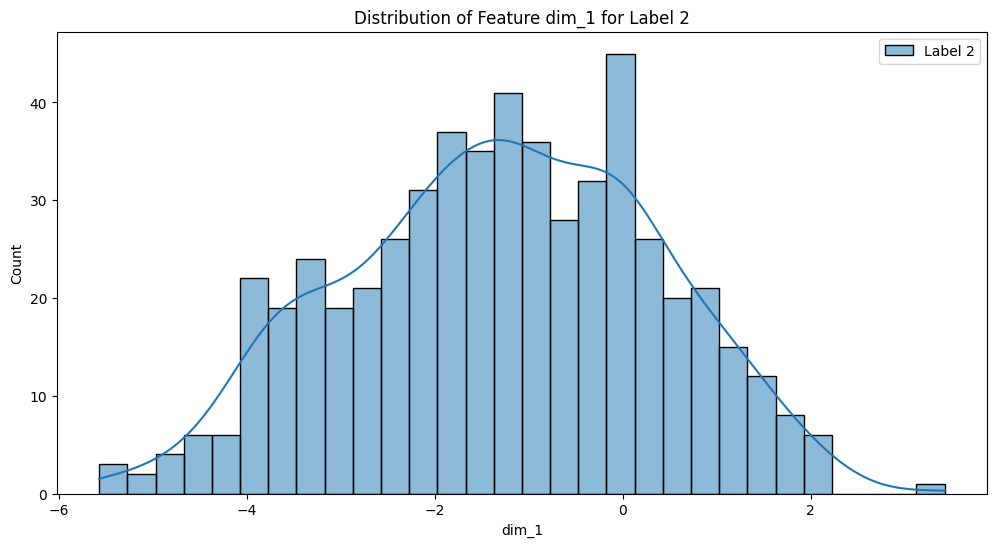

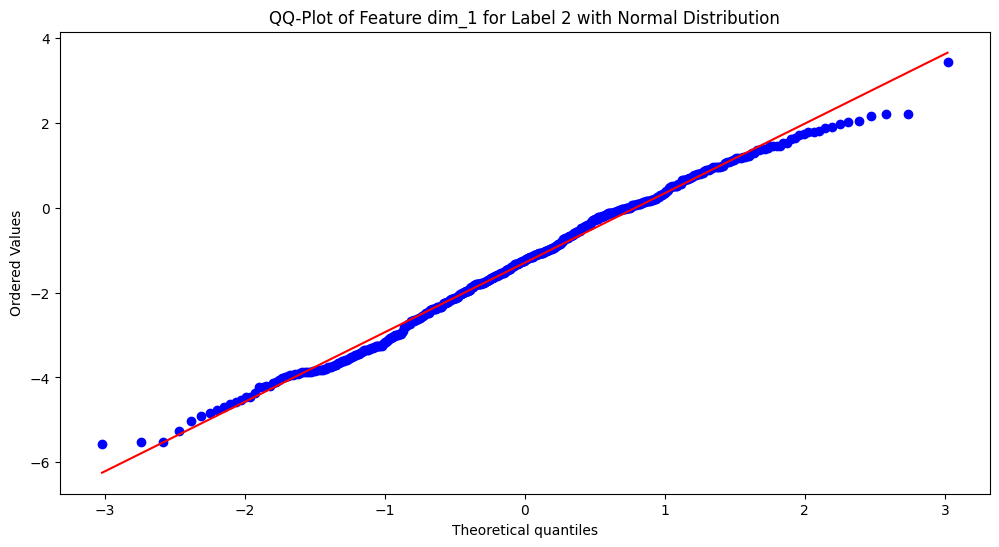

KS-test for Normal distribution (Feature dim_1, Label 2): Statistic = 0.04520581150144809, p-value = 0.20808679195563928
Data seems to follow a Normal distribution (Feature dim_1, Label 2).
Estimated parameters: Mean = -1.2972524945910733, Std = 1.638770436031492


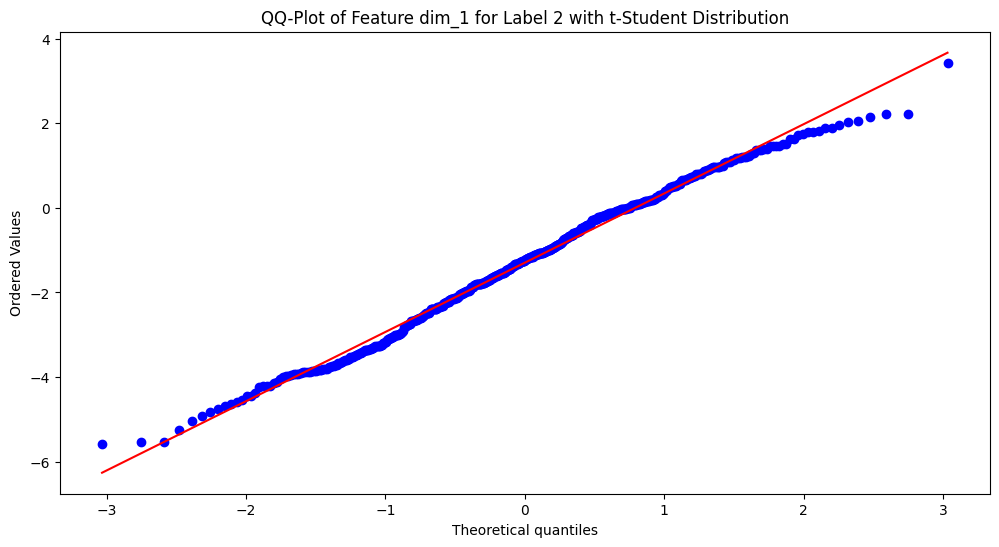

KS-test for t-Student distribution (Feature dim_1, Label 2): Statistic = 0.045391540428530774, p-value = 0.20428334602700504
Data seems to follow a t-Student distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 205760715754.7307, Location = -1.2972519730476502, Scale = 1.637269440760408


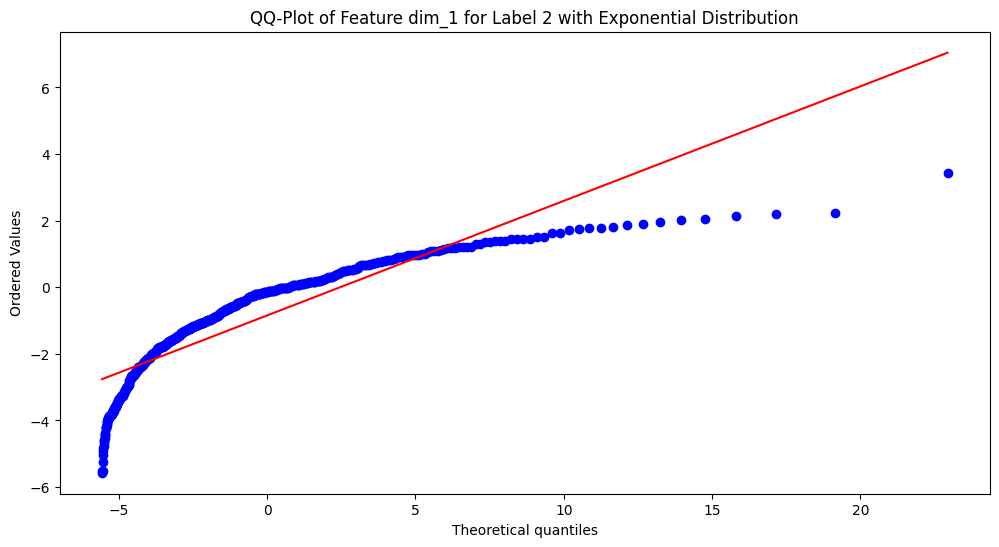

KS-test for Exponential distribution (Feature dim_1, Label 2): Statistic = 0.285314531955472, p-value = 7.875251096014134e-40
Data does not follow an Exponential distribution (Feature dim_1, Label 2).


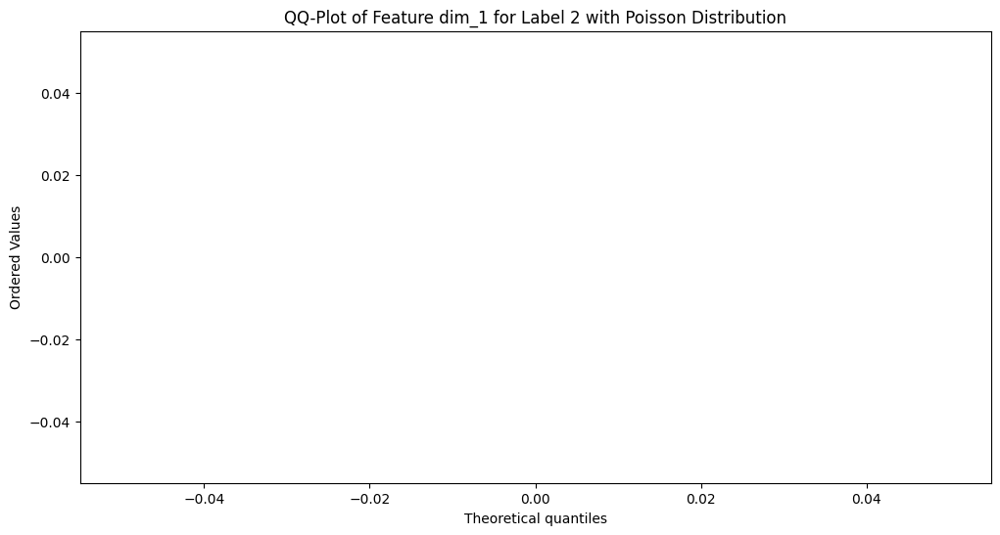

KS-test for Poisson distribution (Feature dim_1, Label 2): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_1, Label 2).


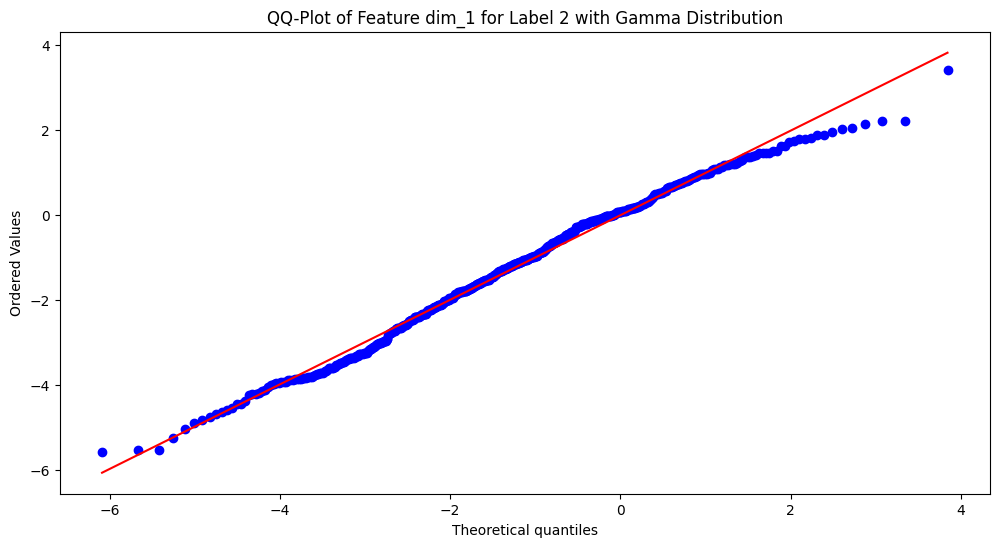

KS-test for Gamma distribution (Feature dim_1, Label 2): Statistic = 0.047030303682762065, p-value = 0.17300999273430695
Data seems to follow a Gamma distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 652.8658025840118, Location = -43.336139373258504, Scale = 0.0643919699685965


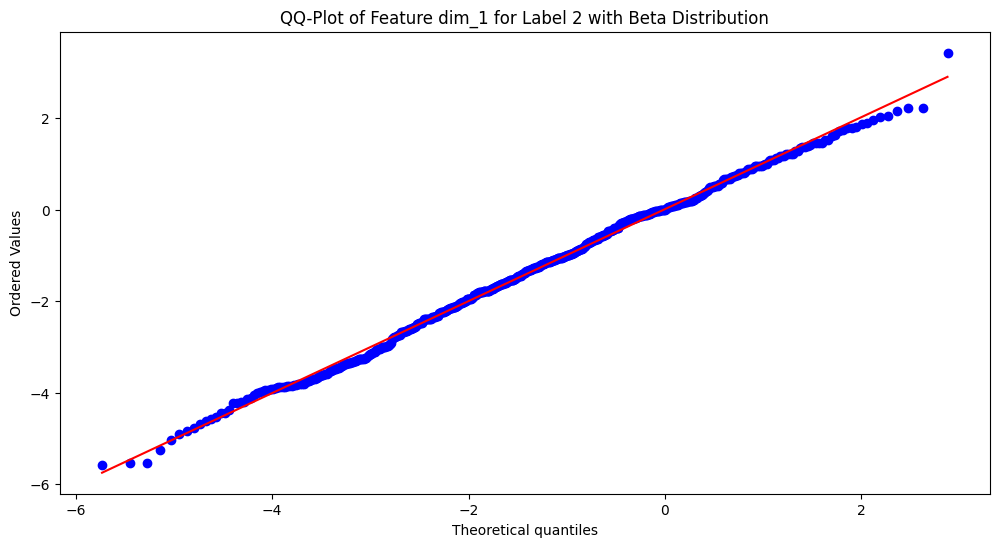

KS-test for Beta distribution (Feature dim_1, Label 2): Statistic = 0.032551248481147654, p-value = 0.597602967630559
Data seems to follow a Beta distribution (Feature dim_1, Label 2).
Estimated parameters: a = 5.832881235002581, b = 5.235135160240564, Location = -7.285764913366872, Scale = 11.358639297688413


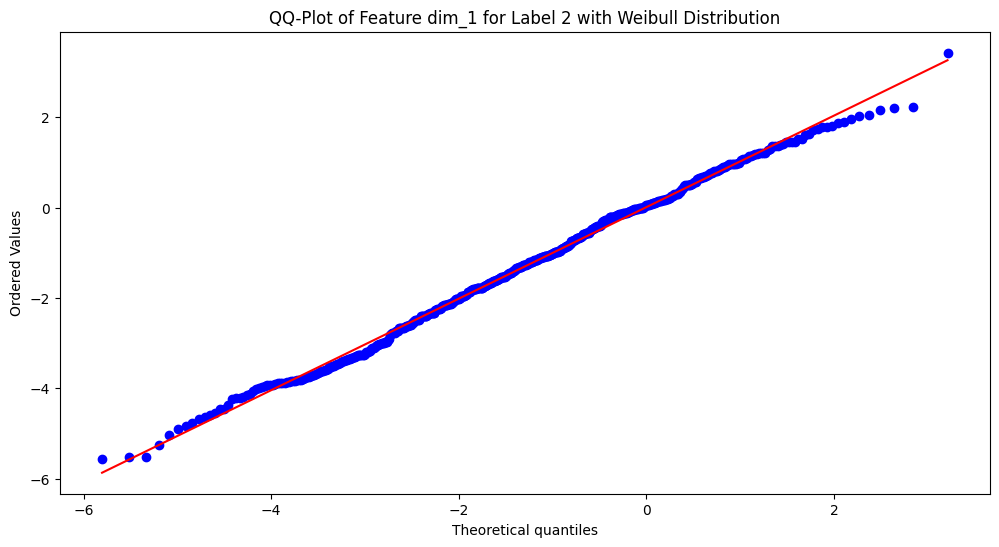

KS-test for Weibull distribution (Feature dim_1, Label 2): Statistic = 0.0375126297012367, p-value = 0.41577527157960203
Data seems to follow a Weibull distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 3.8950393452648893, Location = -6.926378348892884, Scale = 6.22631305642864


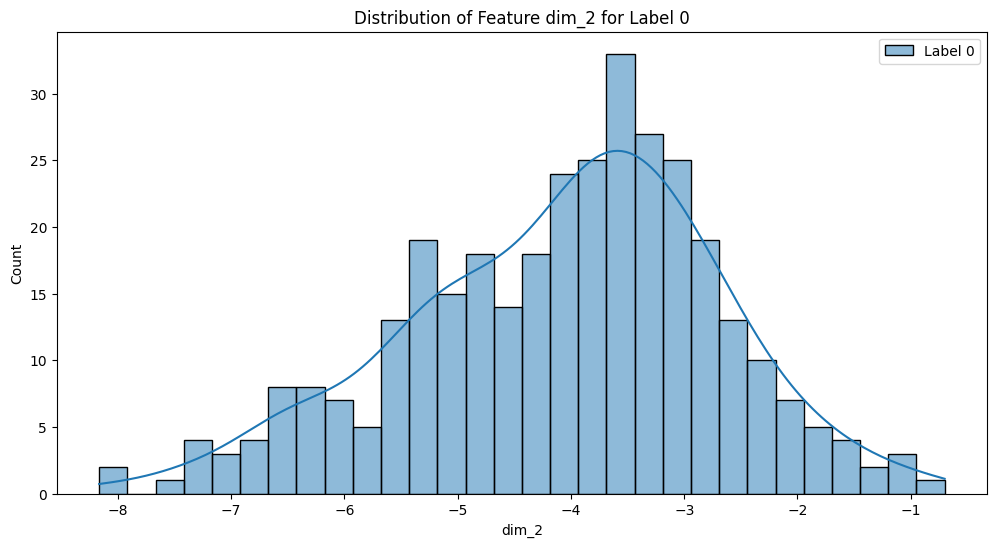

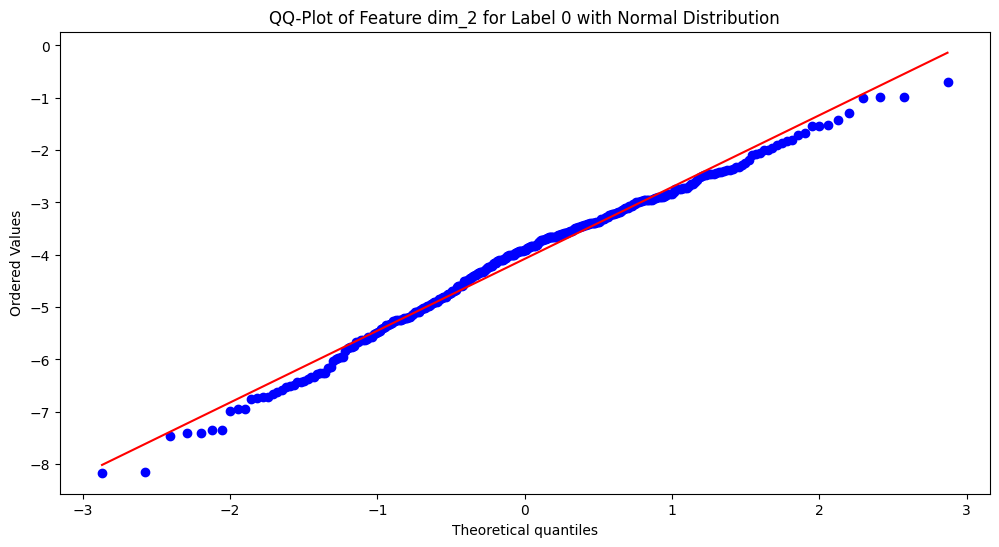

KS-test for Normal distribution (Feature dim_2, Label 0): Statistic = 0.0648440762667804, p-value = 0.1124684731629576
Data seems to follow a Normal distribution (Feature dim_2, Label 0).
Estimated parameters: Mean = -4.077170213004602, Std = 1.3730336842490314


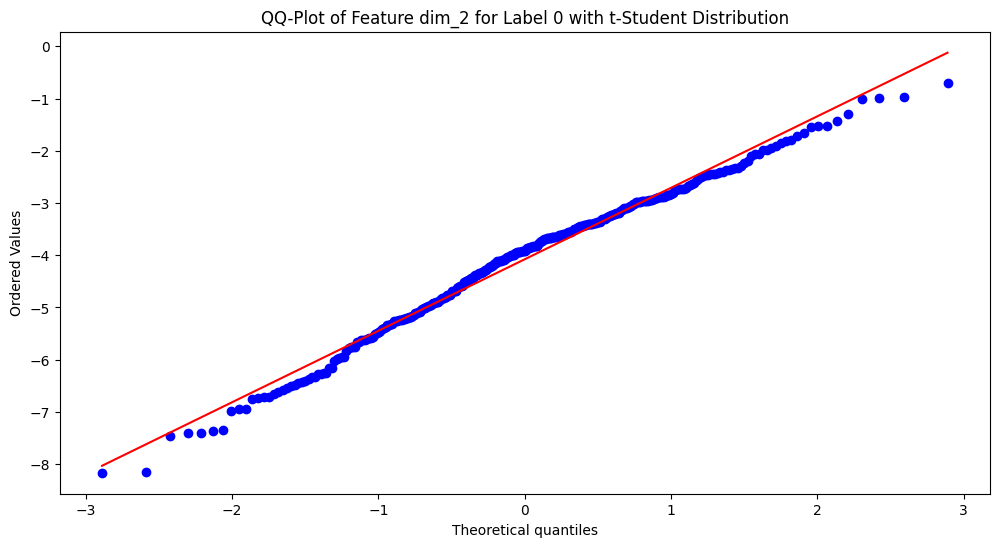

KS-test for t-Student distribution (Feature dim_2, Label 0): Statistic = 0.064802765531351, p-value = 0.11287859428160196
Data seems to follow a t-Student distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 6031.925947111136, Location = -4.077088001028676, Scale = 1.3707732893436253


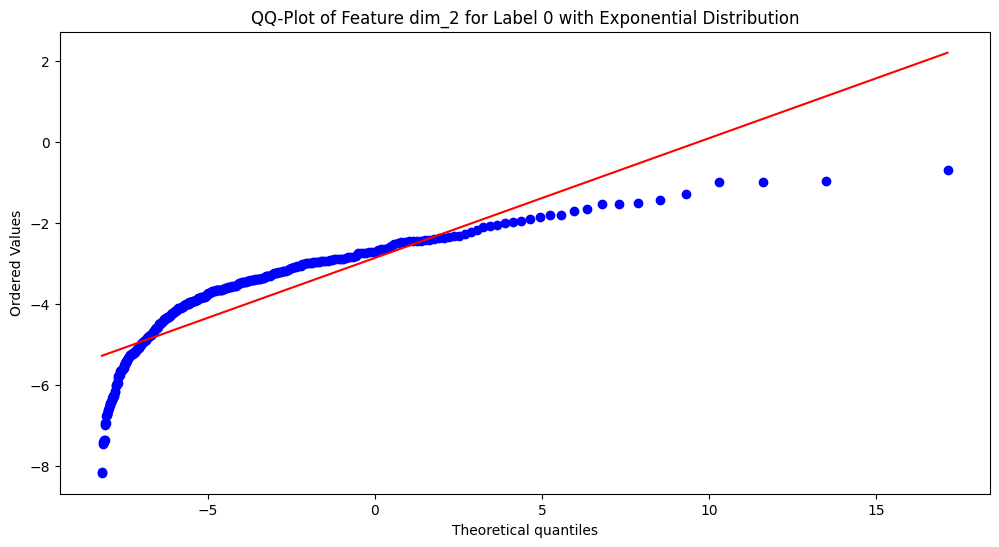

KS-test for Exponential distribution (Feature dim_2, Label 0): Statistic = 0.3330805005698172, p-value = 7.899006773361312e-34
Data does not follow an Exponential distribution (Feature dim_2, Label 0).


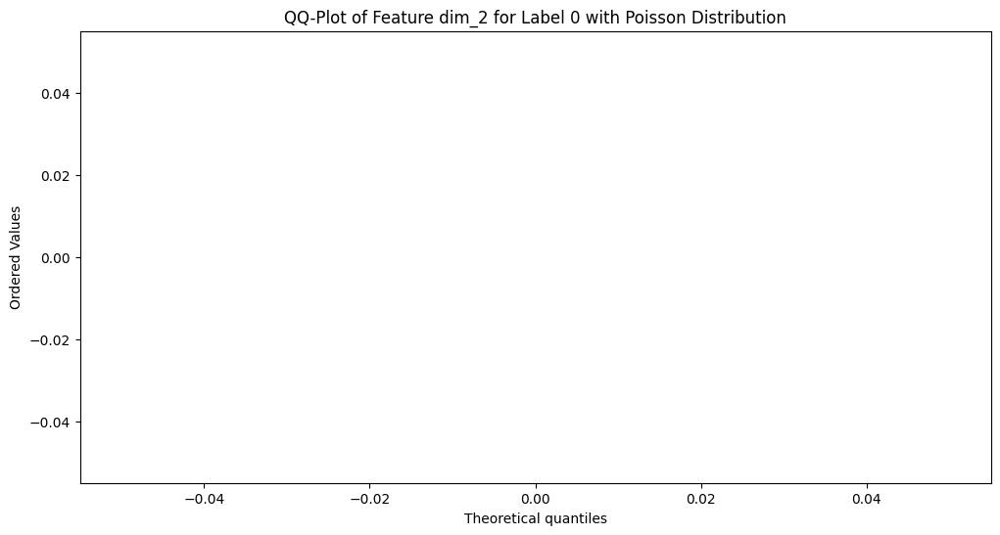

KS-test for Poisson distribution (Feature dim_2, Label 0): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_2, Label 0).


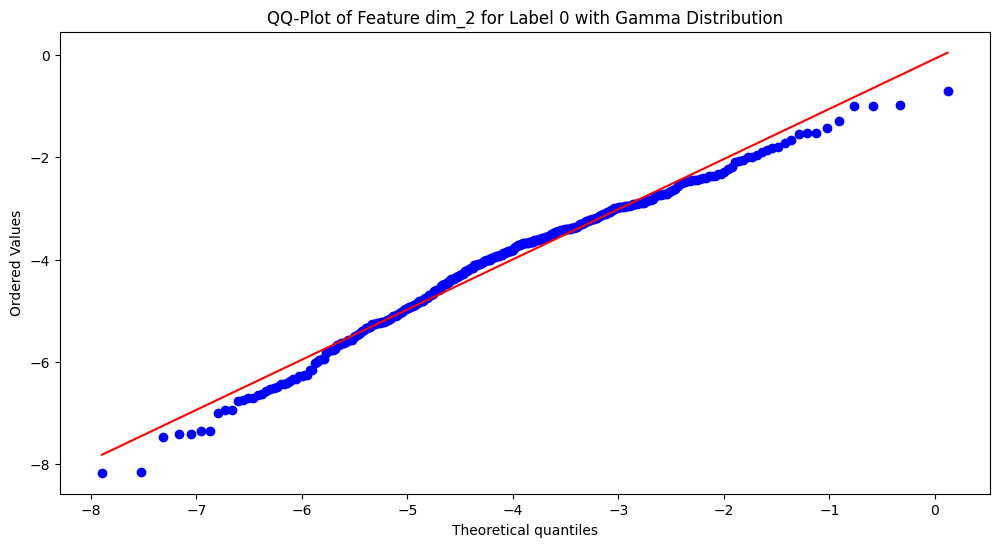

KS-test for Gamma distribution (Feature dim_2, Label 0): Statistic = 0.07439870724641023, p-value = 0.04553070451412233
Data does not follow a Gamma distribution (Feature dim_2, Label 0).


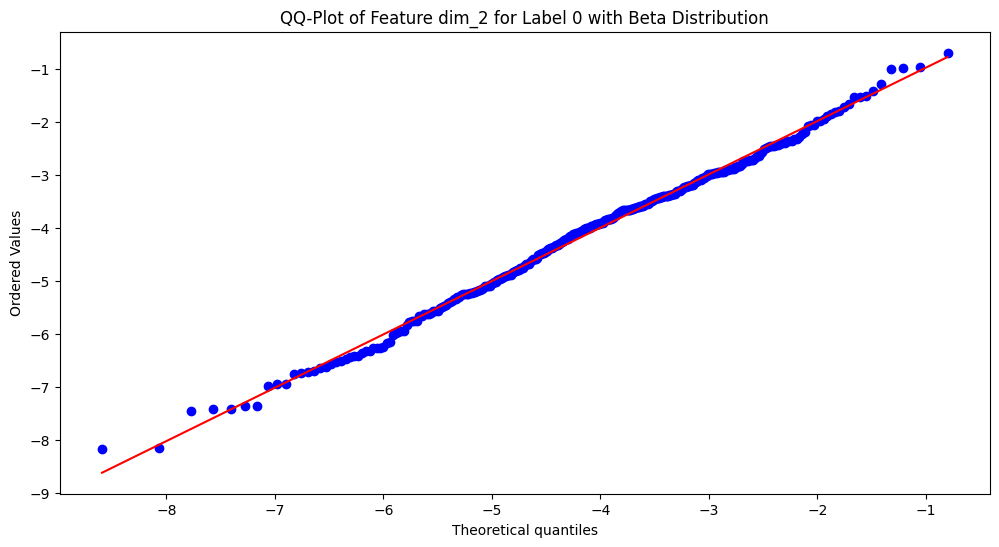

KS-test for Beta distribution (Feature dim_2, Label 0): Statistic = 0.03970370317974564, p-value = 0.6478663576767593
Data seems to follow a Beta distribution (Feature dim_2, Label 0).
Estimated parameters: a = 104.23087590080516, b = 16.834783213461478, Location = -41.75216605473955, Scale = 43.76003272681686


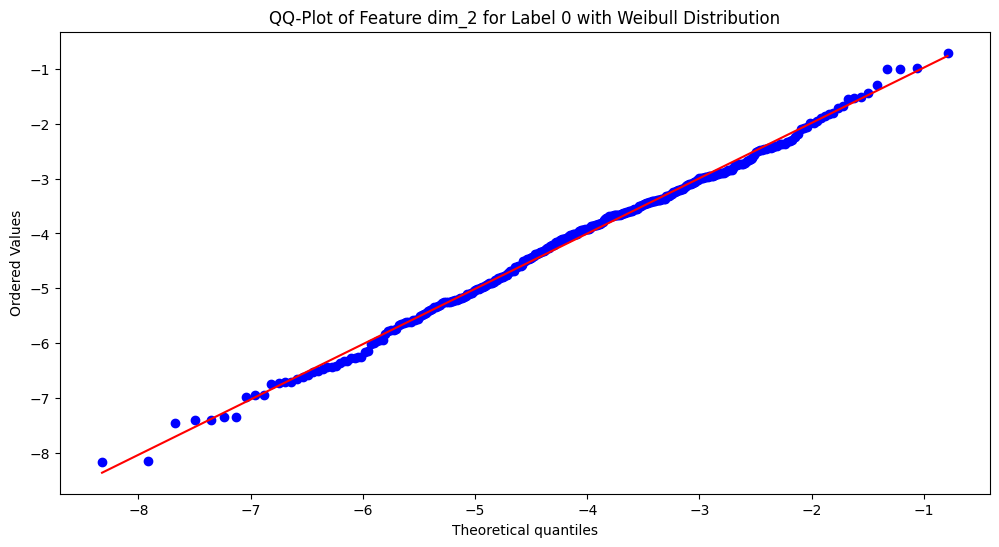

KS-test for Weibull distribution (Feature dim_2, Label 0): Statistic = 0.03864422913930343, p-value = 0.6806655341700821
Data seems to follow a Weibull distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 5.641097144730205, Location = -10.726059856275617, Scale = 7.1928188950588385


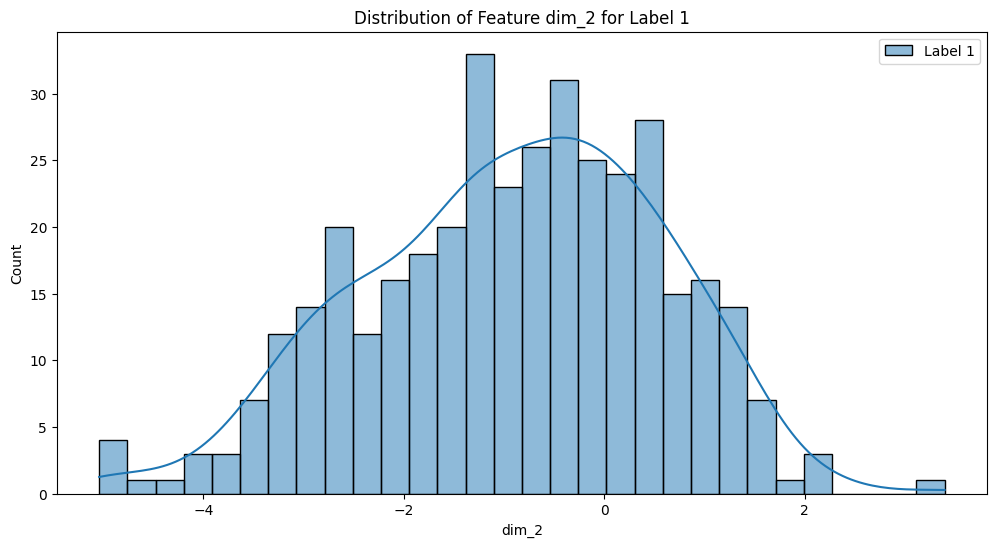

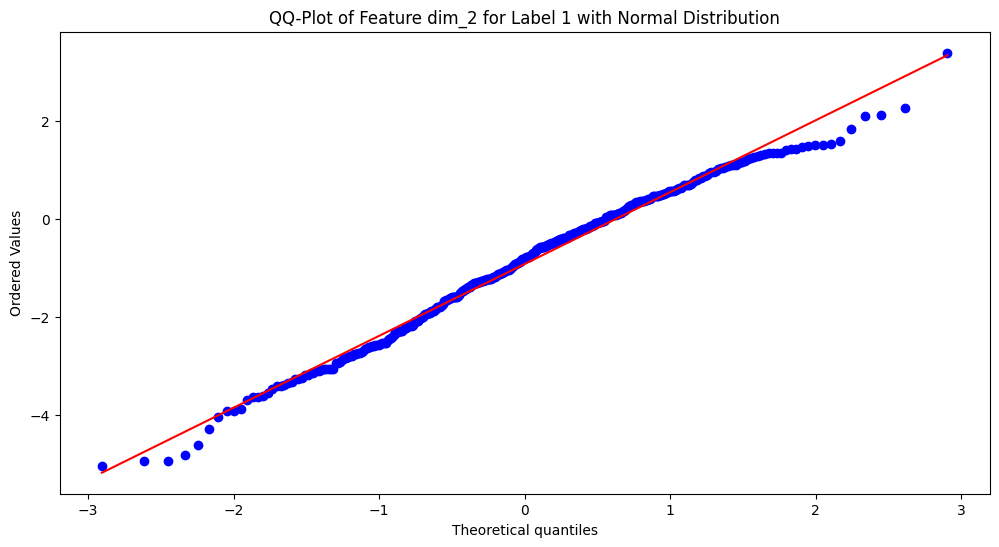

KS-test for Normal distribution (Feature dim_2, Label 1): Statistic = 0.05373941101930846, p-value = 0.21710920823556878
Data seems to follow a Normal distribution (Feature dim_2, Label 1).
Estimated parameters: Mean = -0.9183746229206758, Std = 1.4671256563338897


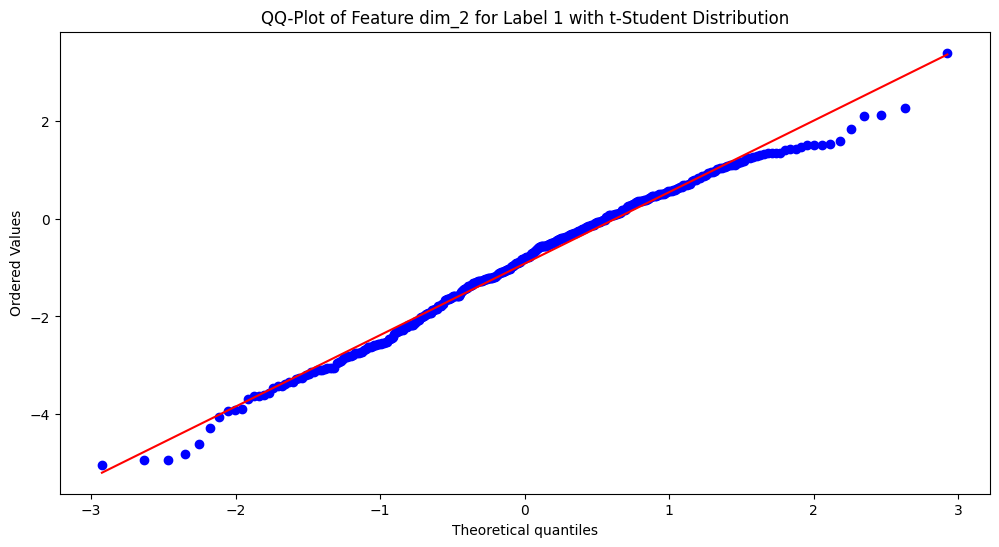

KS-test for t-Student distribution (Feature dim_2, Label 1): Statistic = 0.05386117651121236, p-value = 0.21495842173363422
Data seems to follow a t-Student distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 32496280275.072308, Location = -0.918375499267911, Scale = 1.4651836200780632


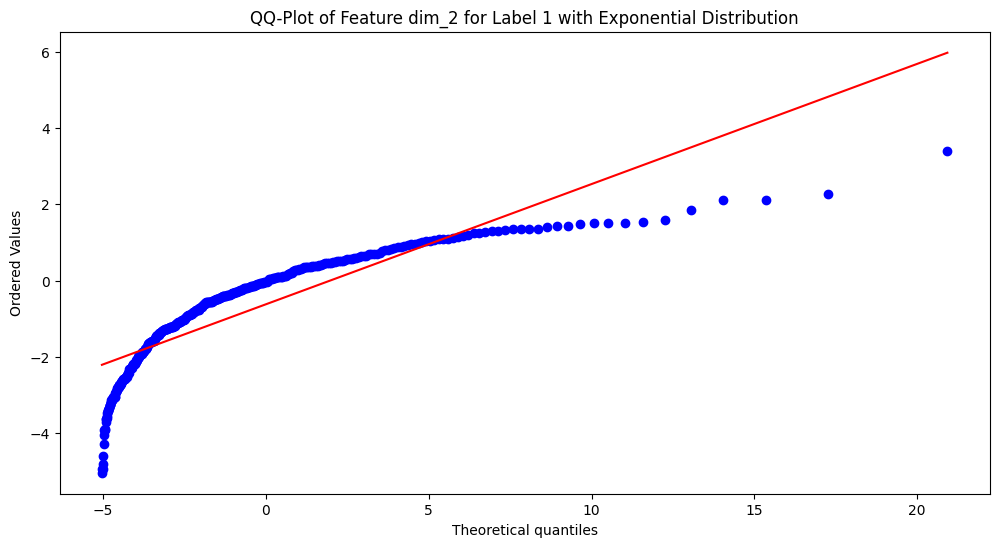

KS-test for Exponential distribution (Feature dim_2, Label 1): Statistic = 0.3088300575420727, p-value = 1.6369868290320306e-32
Data does not follow an Exponential distribution (Feature dim_2, Label 1).


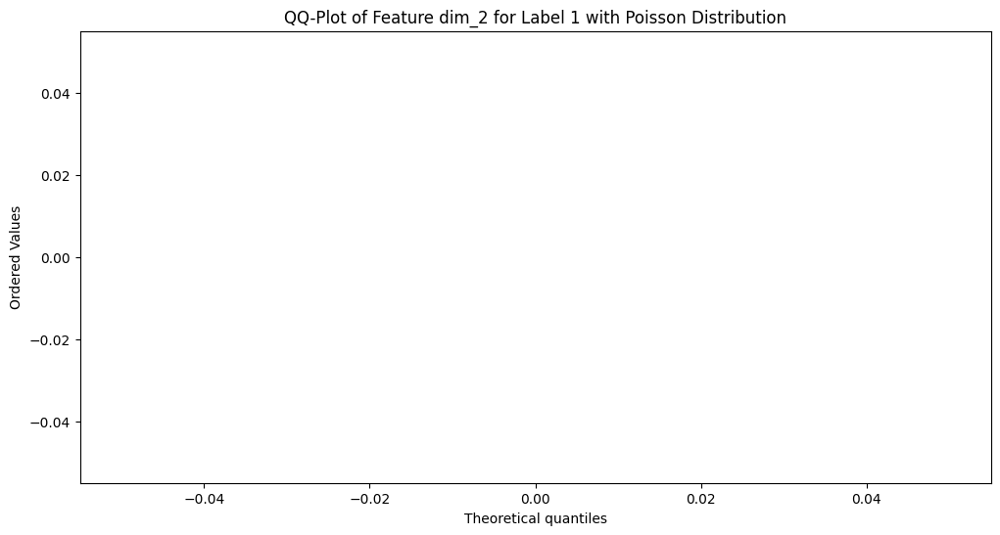

KS-test for Poisson distribution (Feature dim_2, Label 1): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_2, Label 1).


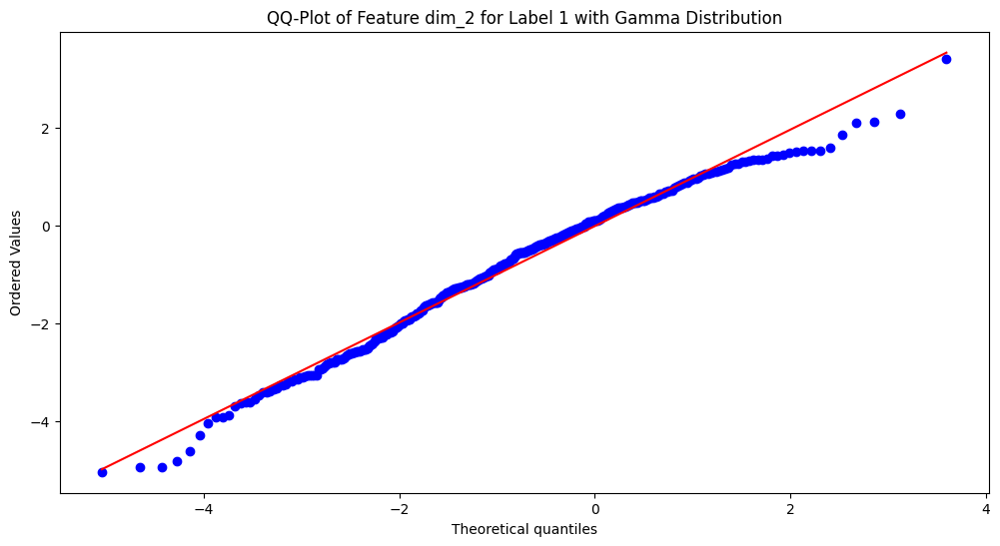

KS-test for Gamma distribution (Feature dim_2, Label 1): Statistic = 0.05793808468353734, p-value = 0.15196630756213458
Data seems to follow a Gamma distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 372.3964479622889, Location = -29.600061772330086, Scale = 0.07702892953702545


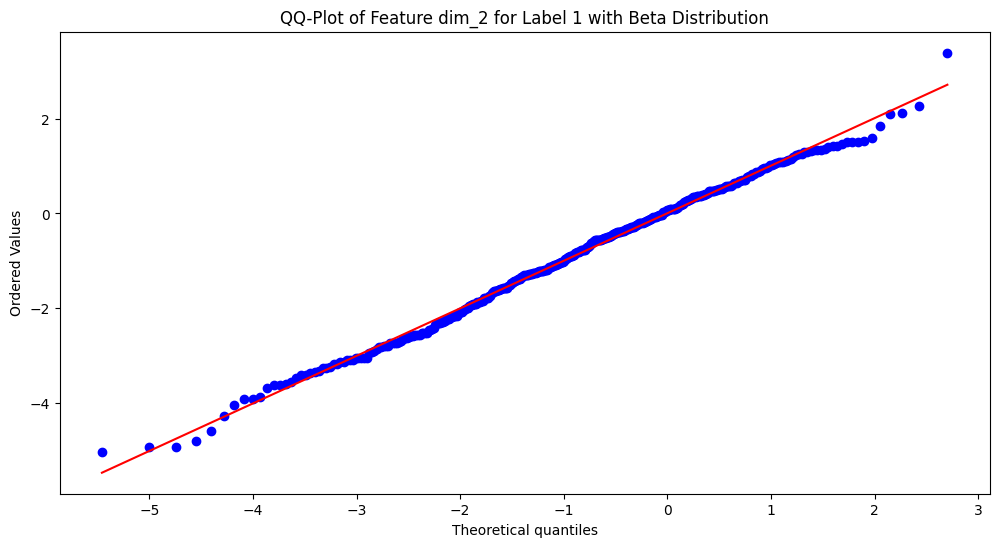

KS-test for Beta distribution (Feature dim_2, Label 1): Statistic = 0.035891008584115314, p-value = 0.7009618191883458
Data seems to follow a Beta distribution (Feature dim_2, Label 1).
Estimated parameters: a = 21.890865273603566, b = 10.552068798007223, Location = -13.09630290660474, Scale = 18.0475677457404


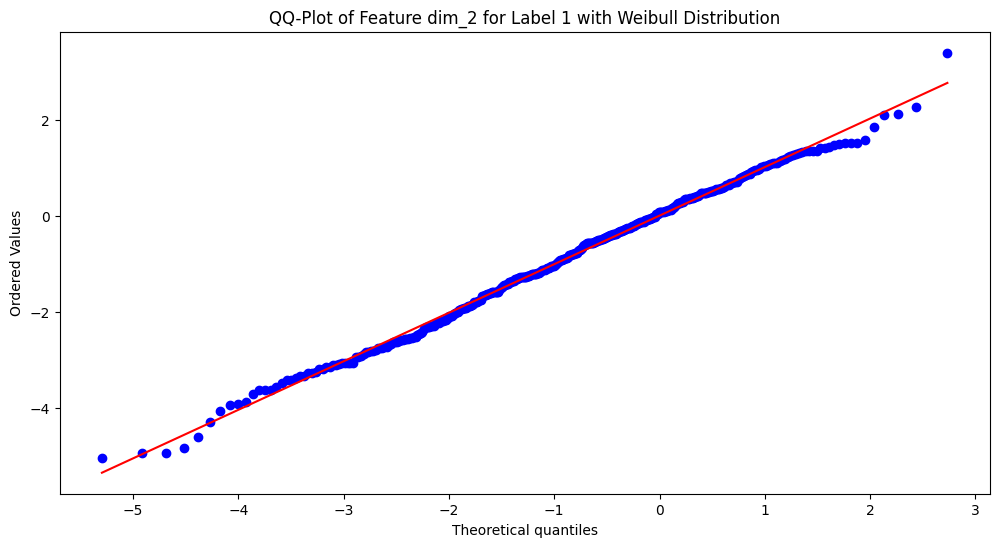

KS-test for Weibull distribution (Feature dim_2, Label 1): Statistic = 0.032633217654903235, p-value = 0.8030983615079508
Data seems to follow a Weibull distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 4.976051745728556, Location = -7.2349186114073305, Scale = 6.885552255345514


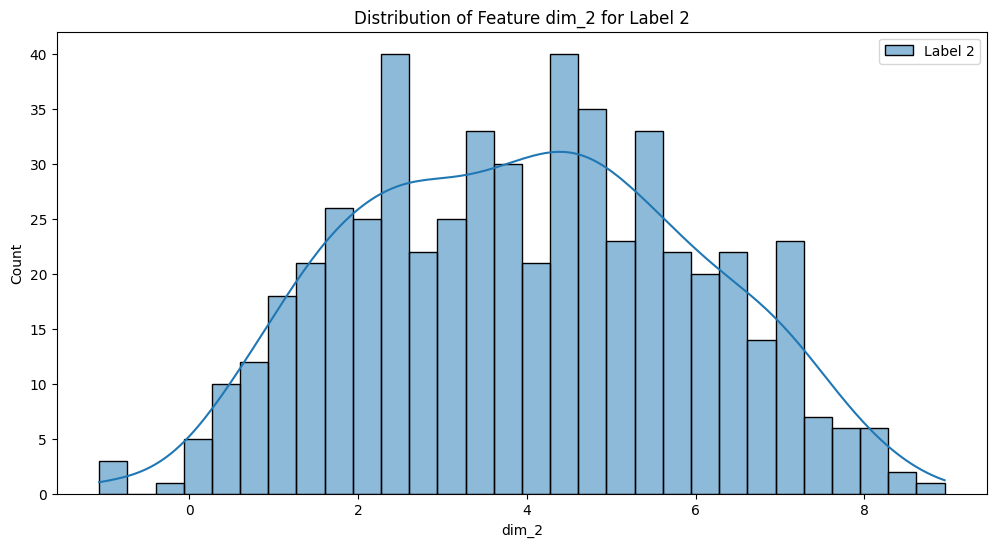

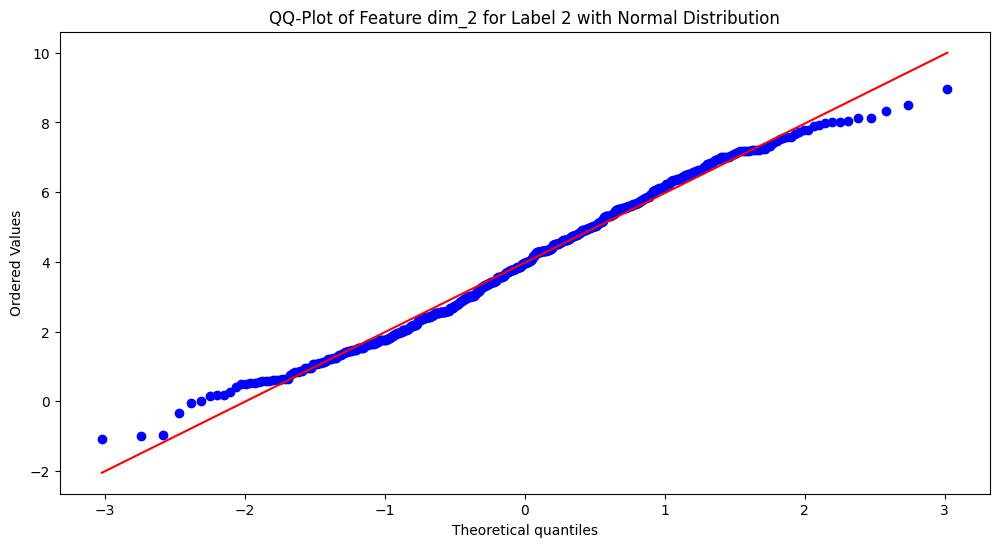

KS-test for Normal distribution (Feature dim_2, Label 2): Statistic = 0.0499777040624142, p-value = 0.1263867167291649
Data seems to follow a Normal distribution (Feature dim_2, Label 2).
Estimated parameters: Mean = 3.9749454849198353, Std = 1.9974776048174143


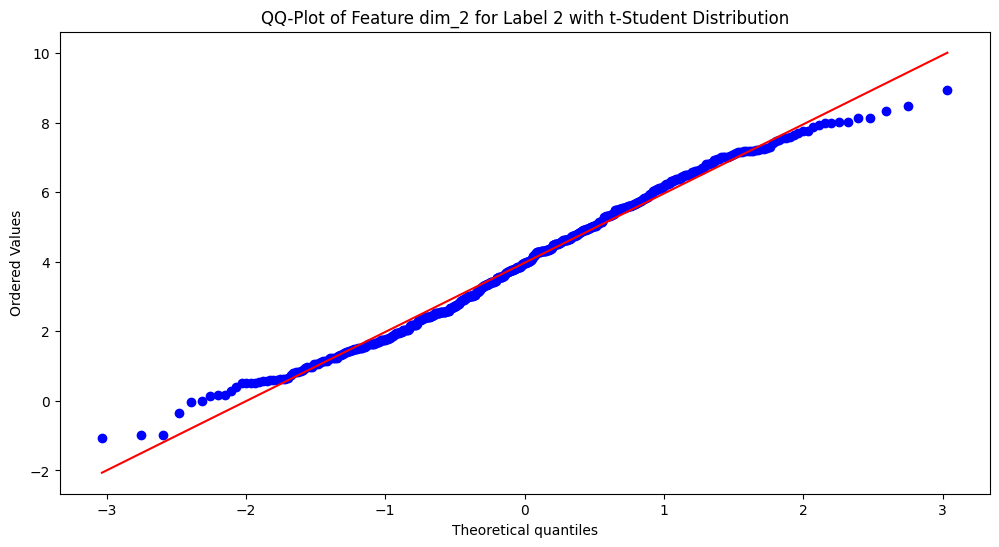

KS-test for t-Student distribution (Feature dim_2, Label 2): Statistic = 0.05017935126148748, p-value = 0.12361324019964848
Data seems to follow a t-Student distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 777723636.4044157, Location = 3.974960695156831, Scale = 1.995645310828559


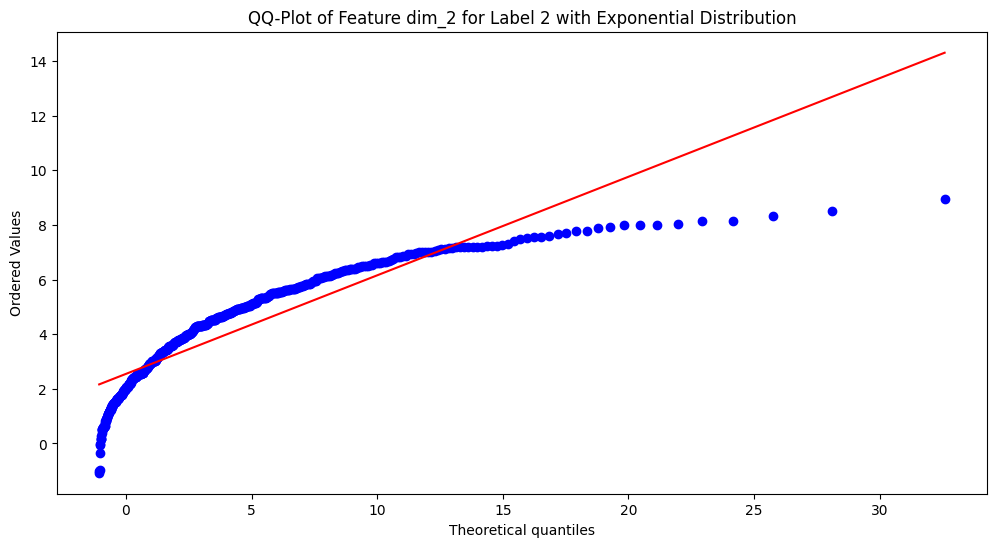

KS-test for Exponential distribution (Feature dim_2, Label 2): Statistic = 0.28875003661757137, p-value = 8.386865723343396e-41
Data does not follow an Exponential distribution (Feature dim_2, Label 2).


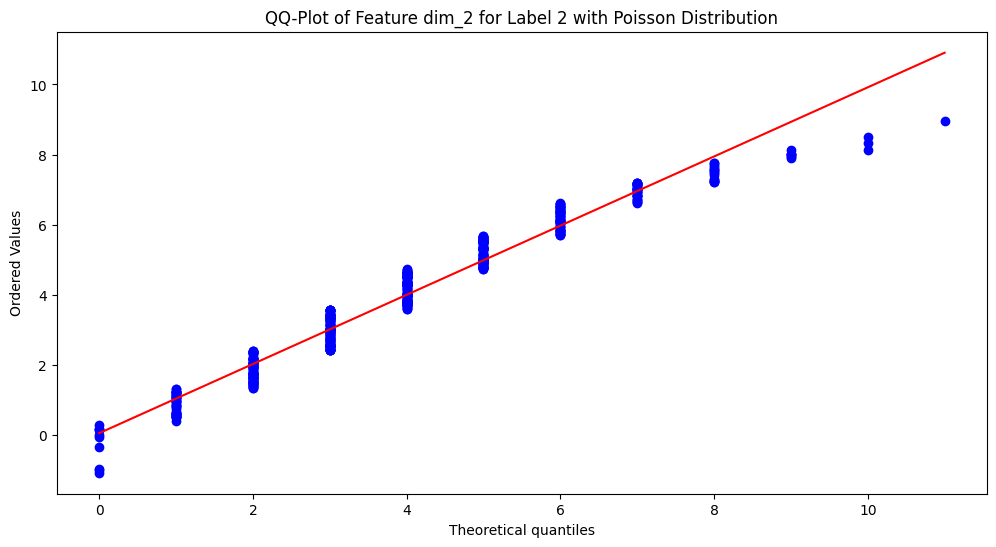

KS-test for Poisson distribution (Feature dim_2, Label 2): Statistic = 0.12823712206801896, p-value = 2.749456113723211e-08
Data does not follow a Poisson distribution (Feature dim_2, Label 2).


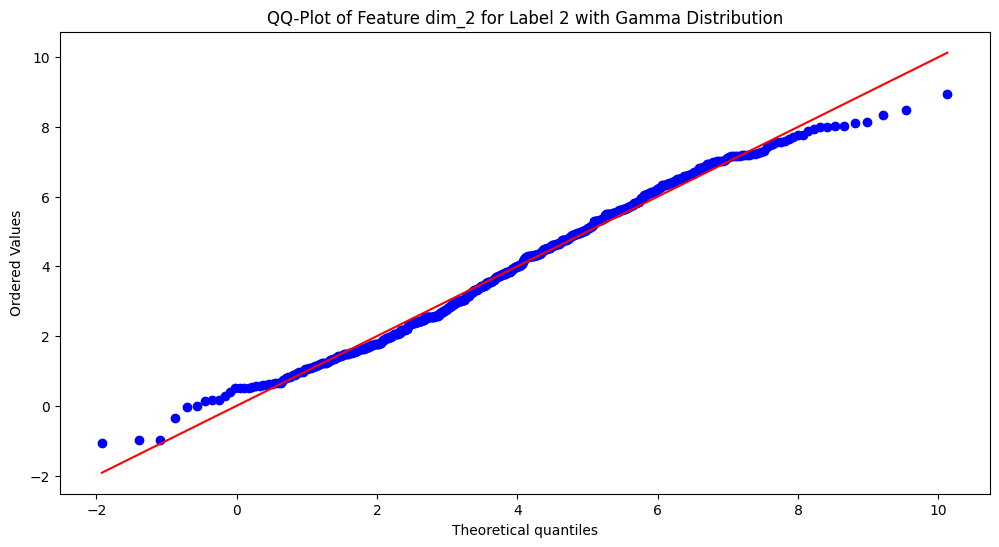

KS-test for Gamma distribution (Feature dim_2, Label 2): Statistic = 0.04901685806249509, p-value = 0.14030752799475044
Data seems to follow a Gamma distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 1752.240442858224, Location = -79.54056044803171, Scale = 0.04766242631521447


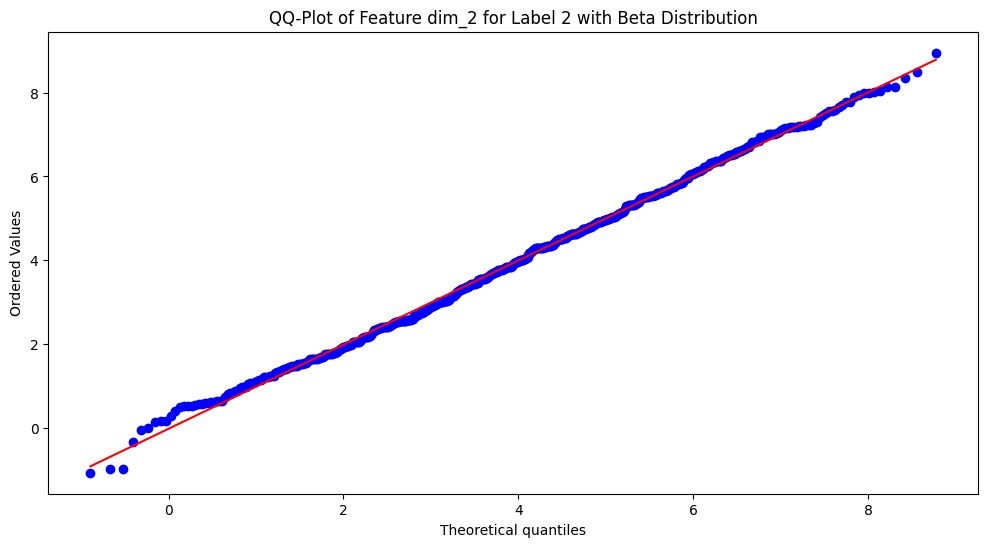

KS-test for Beta distribution (Feature dim_2, Label 2): Statistic = 0.03302416393445695, p-value = 0.5791962629661054
Data seems to follow a Beta distribution (Feature dim_2, Label 2).
Estimated parameters: a = 3.3944299893384153, b = 3.3136954838485577, Location = -1.610930095420362, Scale = 11.049004438654737


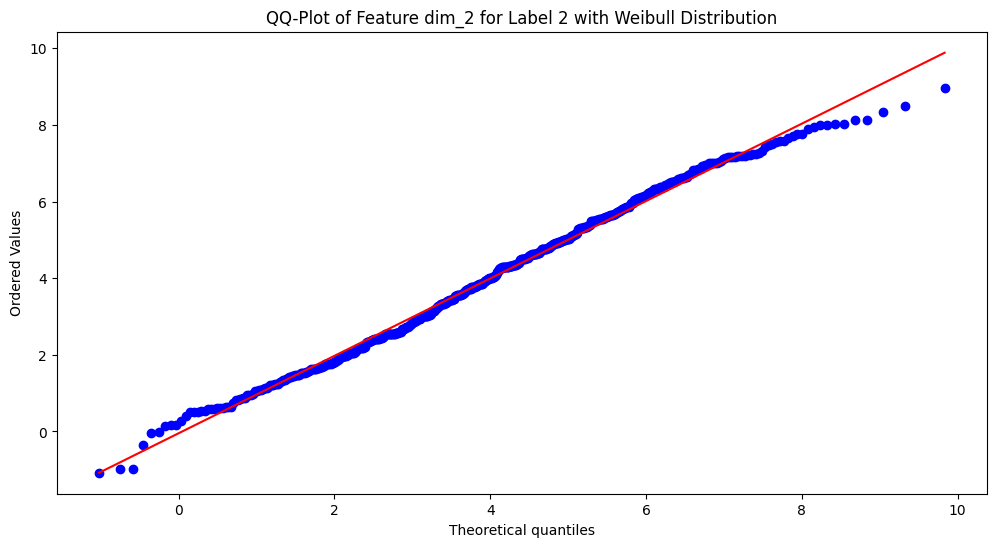

KS-test for Weibull distribution (Feature dim_2, Label 2): Statistic = 0.04269247386707559, p-value = 0.2650128506248849
Data seems to follow a Weibull distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 3.244288090602855, Location = -1.8526911769391141, Scale = 6.510397541917557
Analyzing dataset: Valid


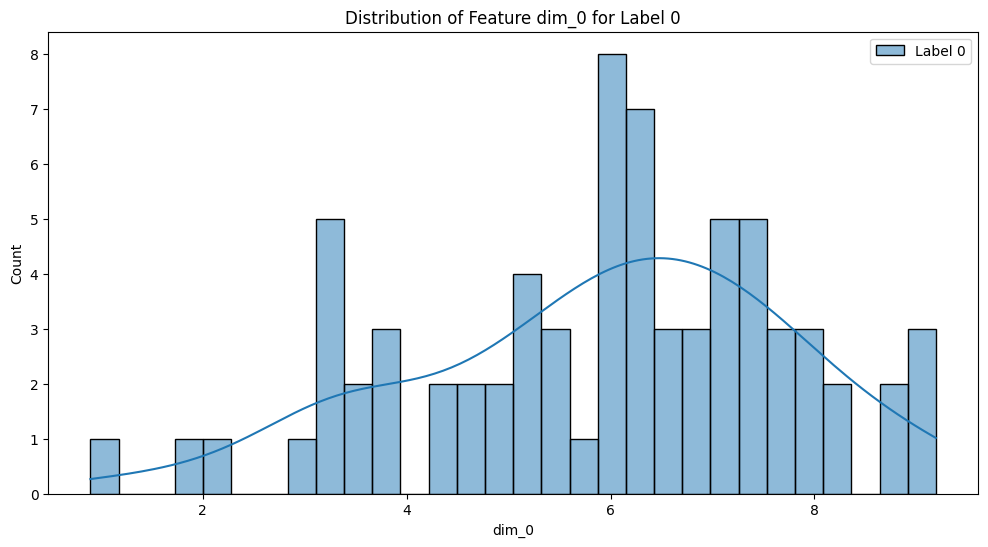

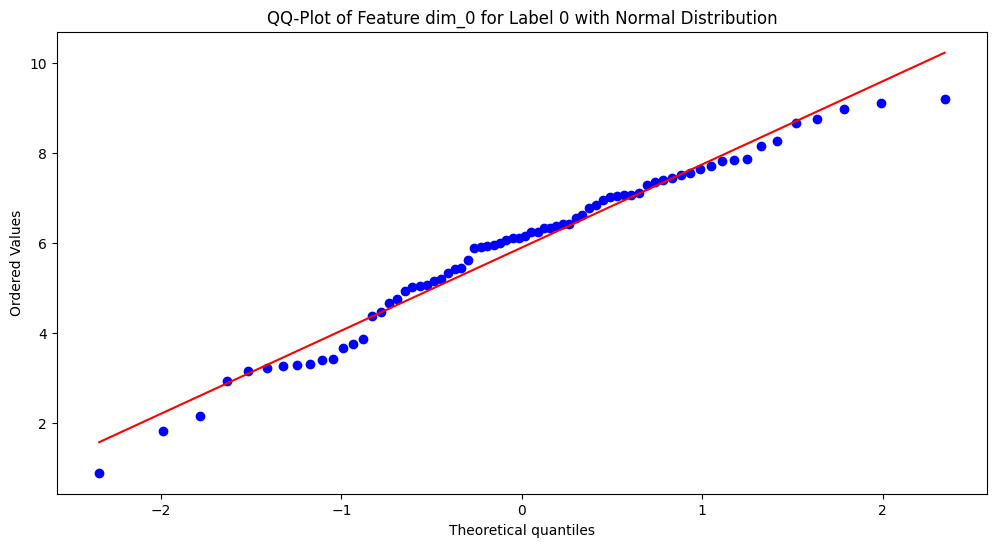

KS-test for Normal distribution (Feature dim_0, Label 0): Statistic = 0.1082386296713711, p-value = 0.34291775907057015
Data seems to follow a Normal distribution (Feature dim_0, Label 0).
Estimated parameters: Mean = 5.901460106174151, Std = 1.8331534638824876


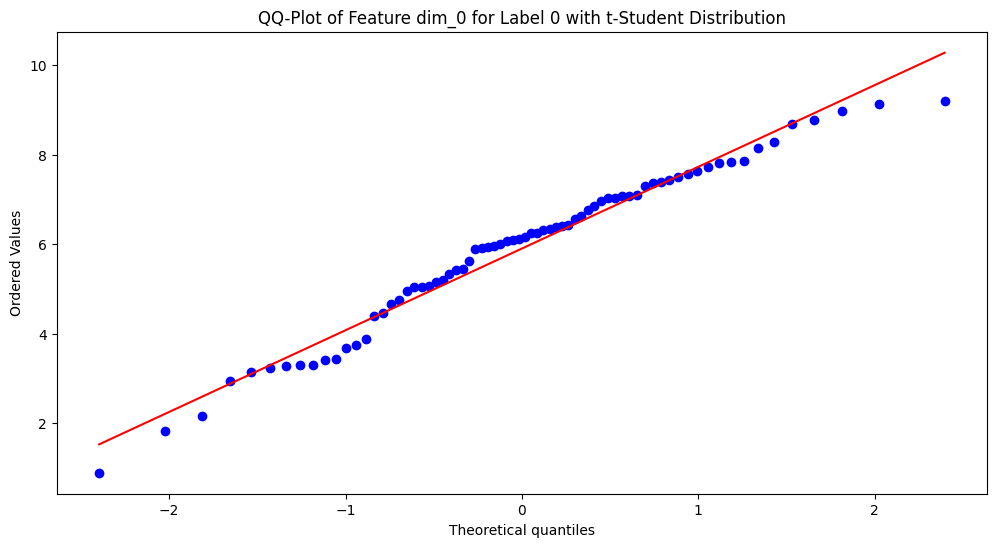

KS-test for t-Student distribution (Feature dim_0, Label 0): Statistic = 0.10821789129821696, p-value = 0.3431413556923713
Data seems to follow a t-Student distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 1849360219.1876264, Location = 5.9014627376083215, Scale = 1.8203761770184674


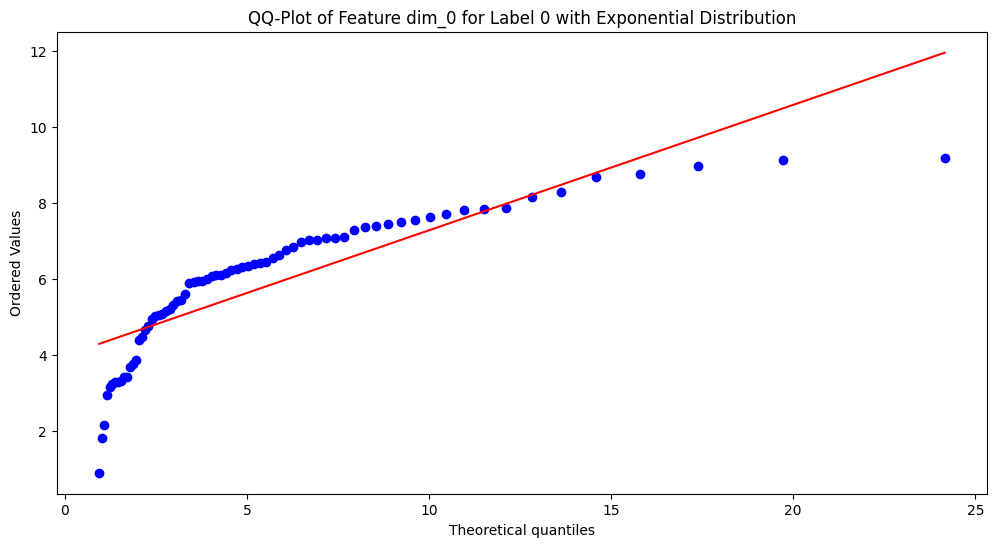

KS-test for Exponential distribution (Feature dim_0, Label 0): Statistic = 0.30764110407295275, p-value = 1.5090736197882652e-06
Data does not follow an Exponential distribution (Feature dim_0, Label 0).


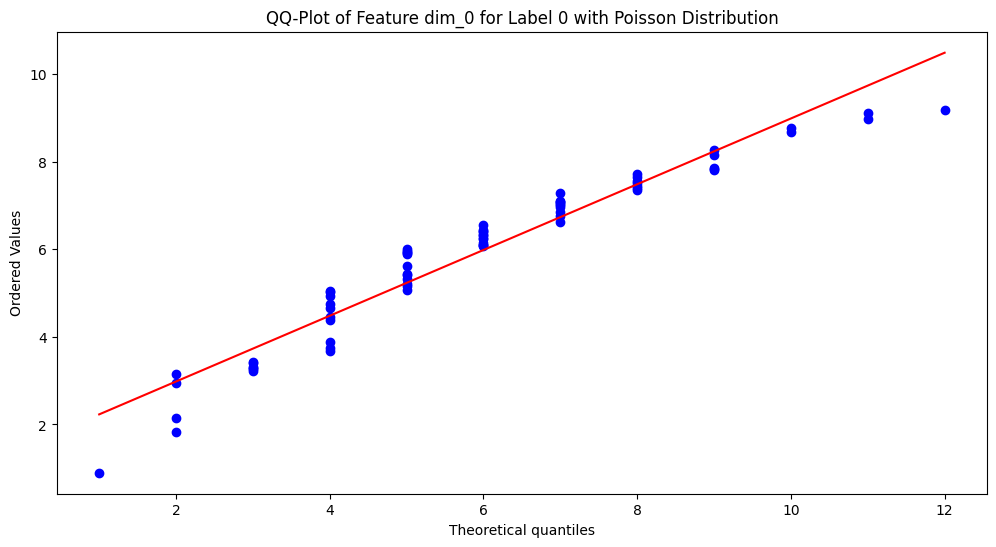

KS-test for Poisson distribution (Feature dim_0, Label 0): Statistic = 0.19774559567875488, p-value = 0.006077368623973704
Data does not follow a Poisson distribution (Feature dim_0, Label 0).


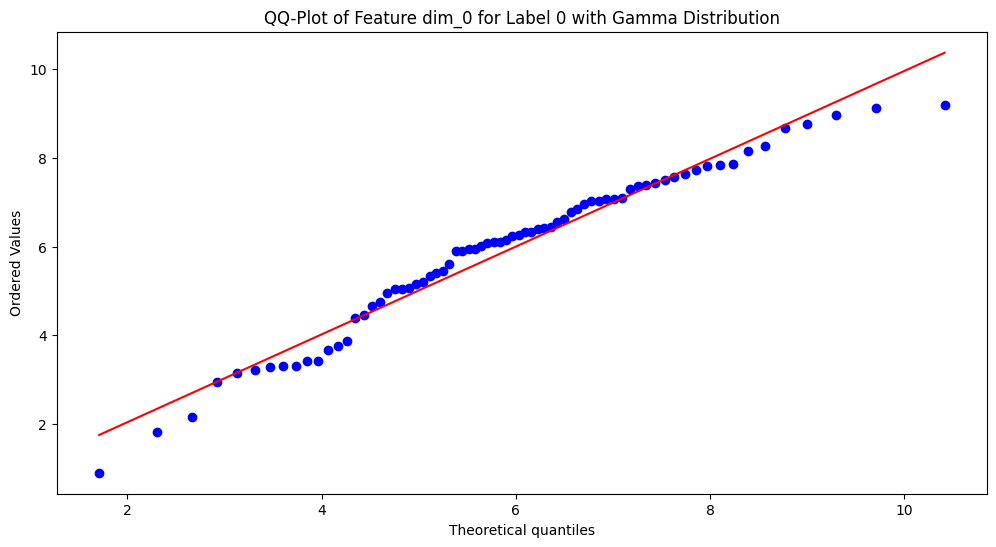

KS-test for Gamma distribution (Feature dim_0, Label 0): Statistic = 0.11537566077867373, p-value = 0.27172906046310624
Data seems to follow a Gamma distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 304.7623846443472, Location = -26.53929726934848, Scale = 0.1064540112651052


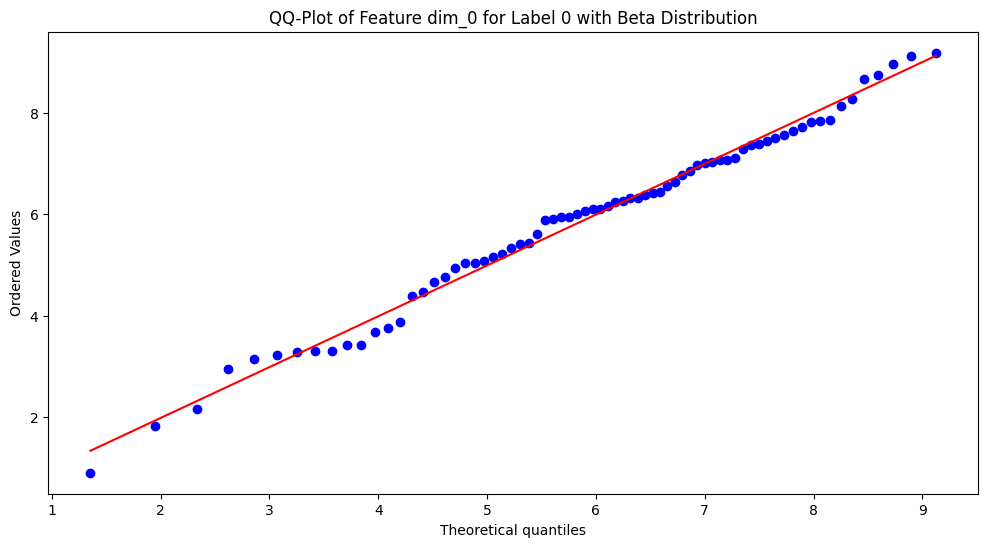

KS-test for Beta distribution (Feature dim_0, Label 0): Statistic = 0.07432808600203789, p-value = 0.7934820594203353
Data seems to follow a Beta distribution (Feature dim_0, Label 0).
Estimated parameters: a = 4.294885478324388, b = 2.272945905042708, Location = -1.0286045896729863, Scale = 10.598024959467072


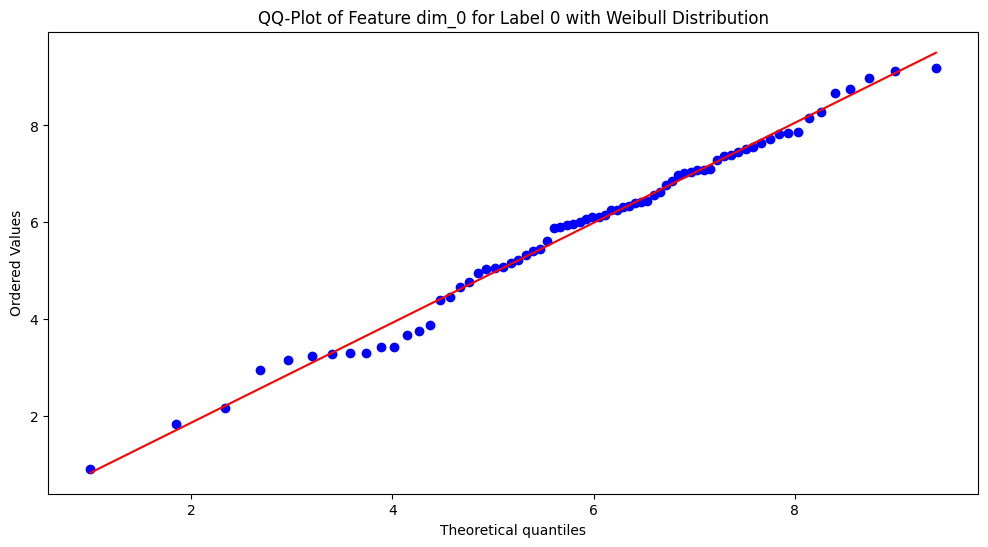

KS-test for Weibull distribution (Feature dim_0, Label 0): Statistic = 0.06811150147715267, p-value = 0.8693512456234621
Data seems to follow a Weibull distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 7.840383937189839, Location = -6.015201759581233, Scale = 12.67636331859764


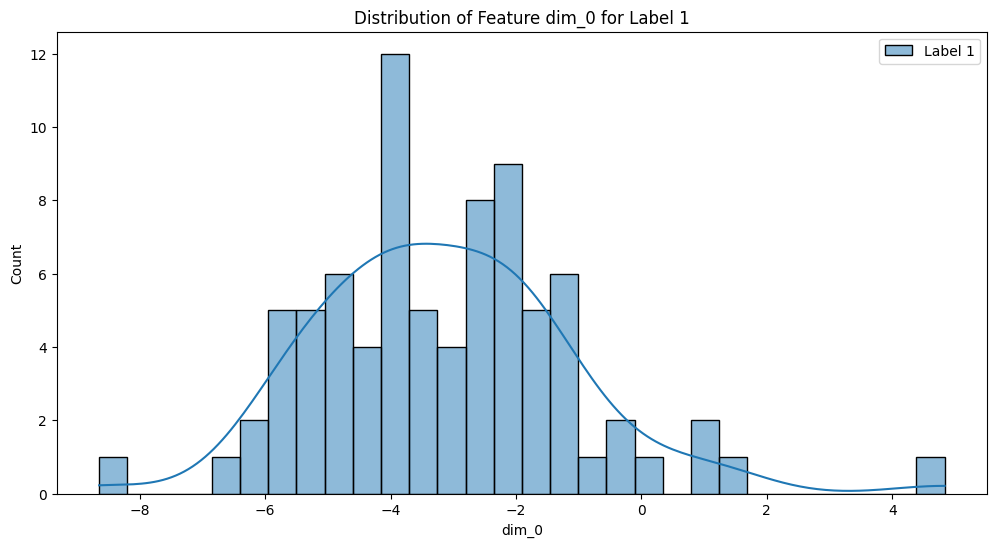

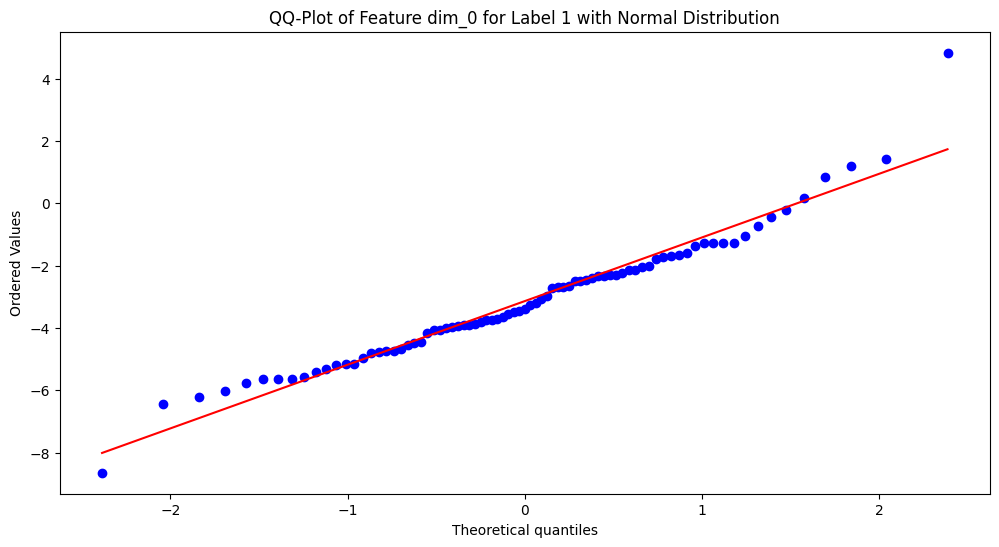

KS-test for Normal distribution (Feature dim_0, Label 1): Statistic = 0.07073411599309065, p-value = 0.7858012448424398
Data seems to follow a Normal distribution (Feature dim_0, Label 1).
Estimated parameters: Mean = -3.1368570243134912, Std = 2.053941346776682


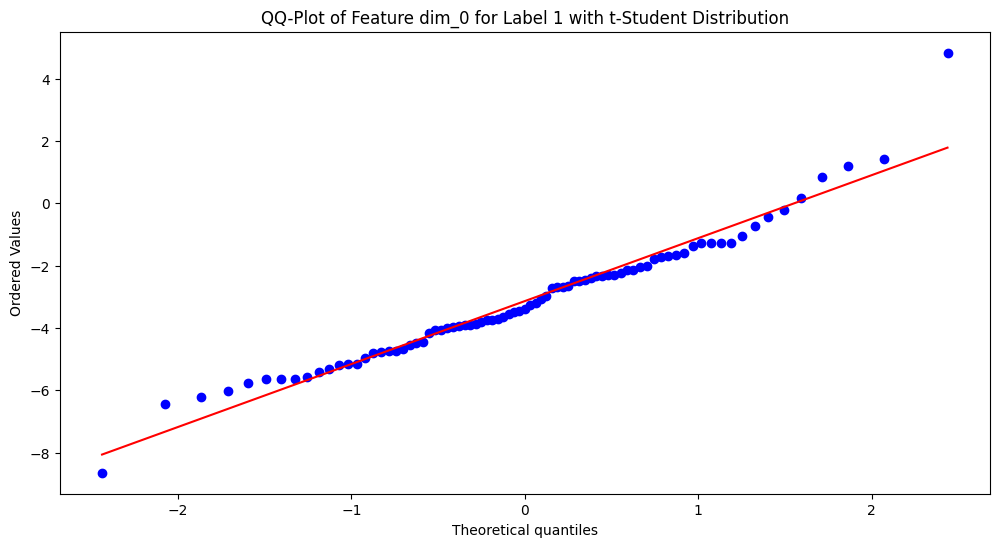

KS-test for t-Student distribution (Feature dim_0, Label 1): Statistic = 0.0577306260747692, p-value = 0.9356047314311468
Data seems to follow a t-Student distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 6.485429842685162, Location = -3.2332248006121977, Scale = 1.6914875734252144


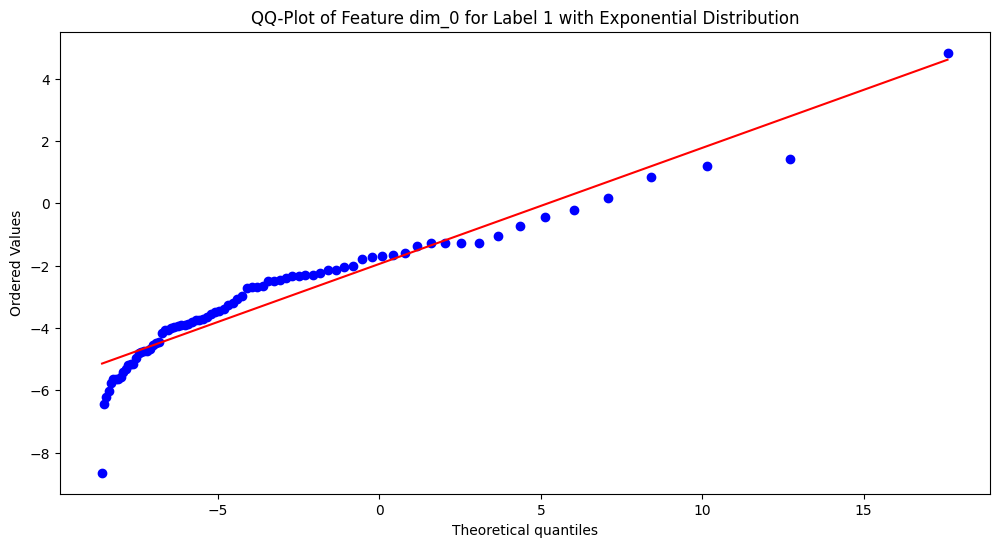

KS-test for Exponential distribution (Feature dim_0, Label 1): Statistic = 0.35870687286860625, p-value = 7.741072116932888e-10
Data does not follow an Exponential distribution (Feature dim_0, Label 1).


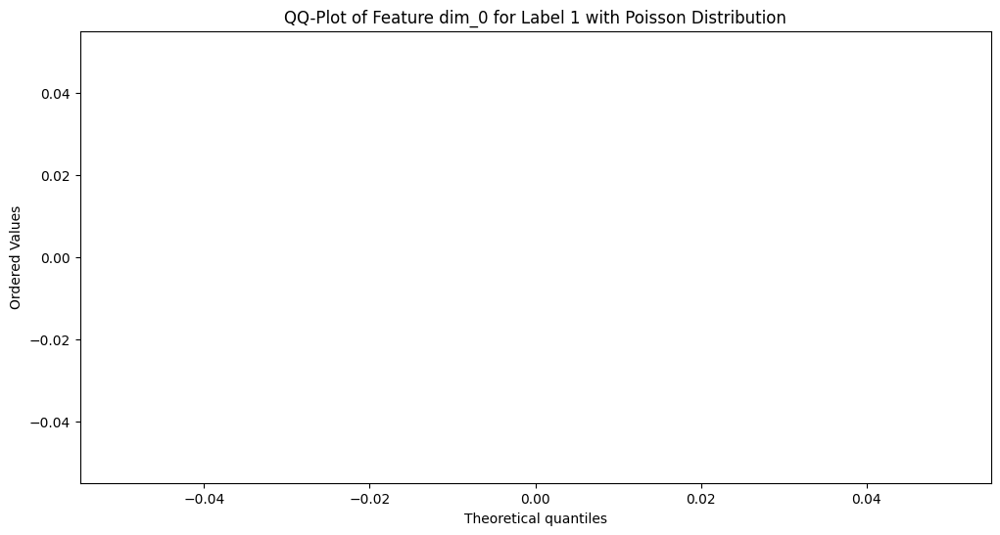

KS-test for Poisson distribution (Feature dim_0, Label 1): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_0, Label 1).


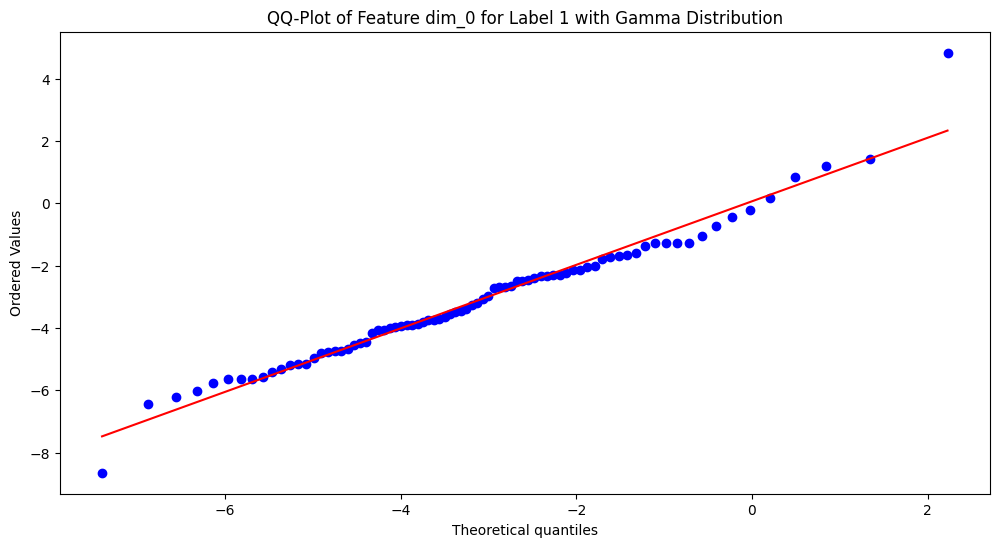

KS-test for Gamma distribution (Feature dim_0, Label 1): Statistic = 0.06364256344873798, p-value = 0.8772436924926338
Data seems to follow a Gamma distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 32.883543943954535, Location = -14.721878431964365, Scale = 0.3523045297539454


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


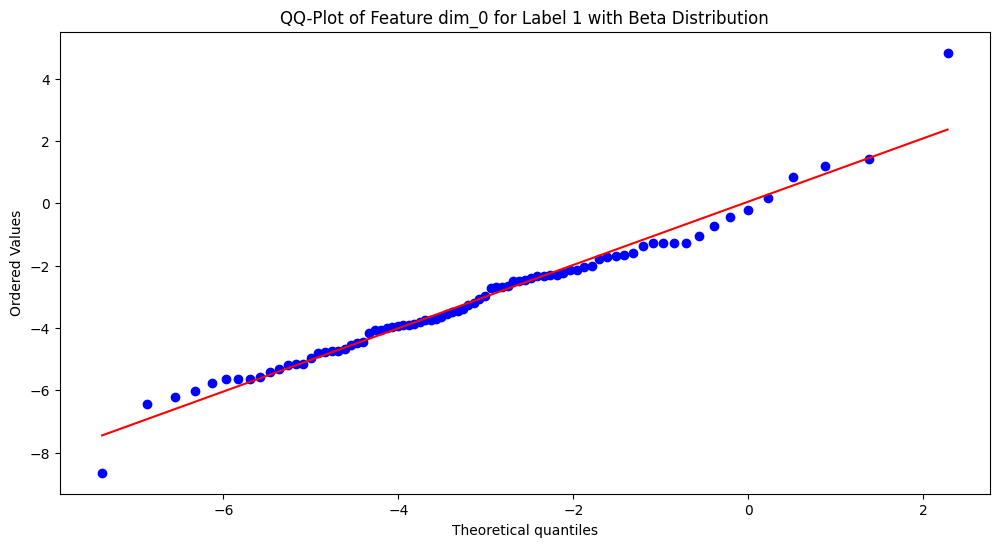

KS-test for Beta distribution (Feature dim_0, Label 1): Statistic = 0.0643549385615596, p-value = 0.8689783506492016
Data seems to follow a Beta distribution (Feature dim_0, Label 1).
Estimated parameters: a = 29.500358653922618, b = 4909209.816416808, Location = -14.151576933170563, Scale = 1833139.7743646863


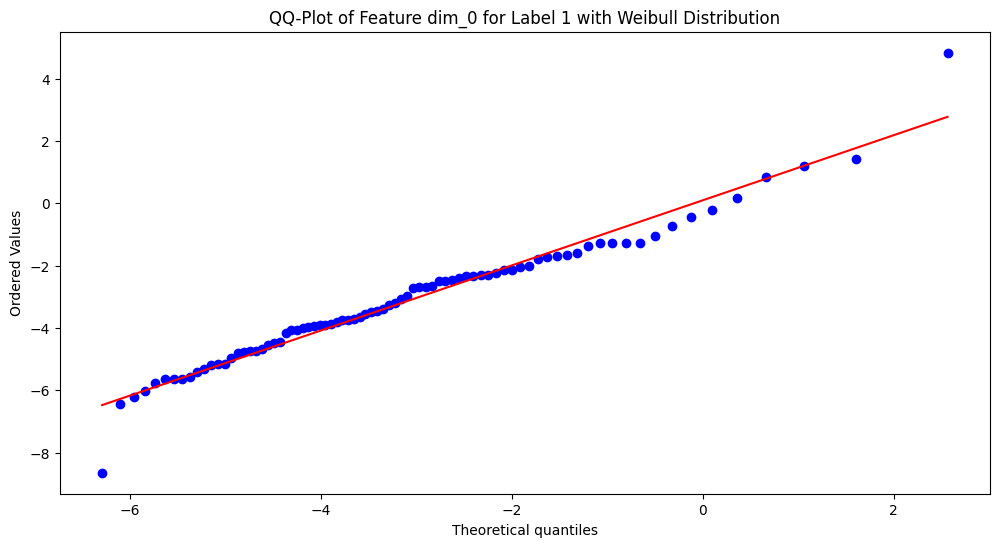

KS-test for Weibull distribution (Feature dim_0, Label 1): Statistic = 0.06440984857682475, p-value = 0.8683313871822609
Data seems to follow a Weibull distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 1.8588517759455614, Location = -6.600150475972996, Scale = 3.955841604864373


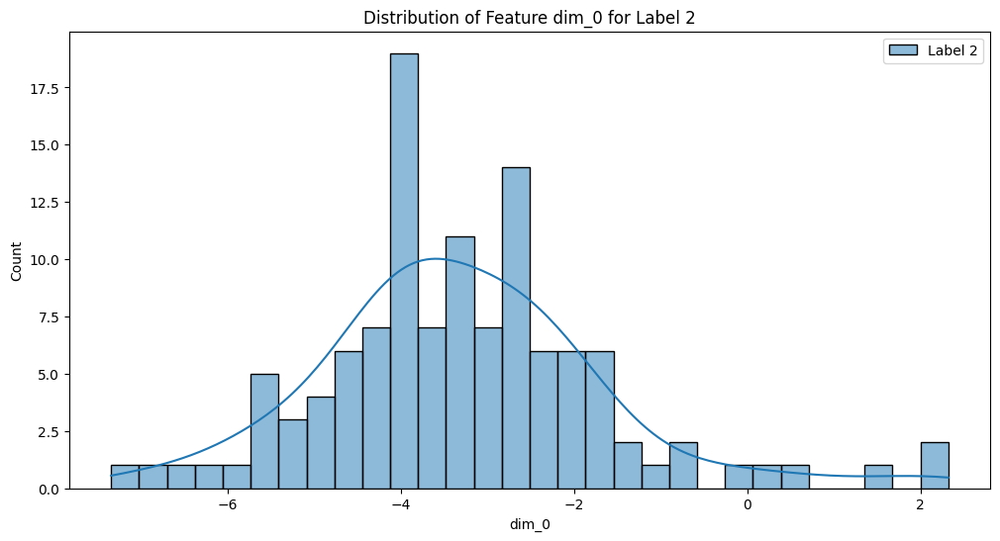

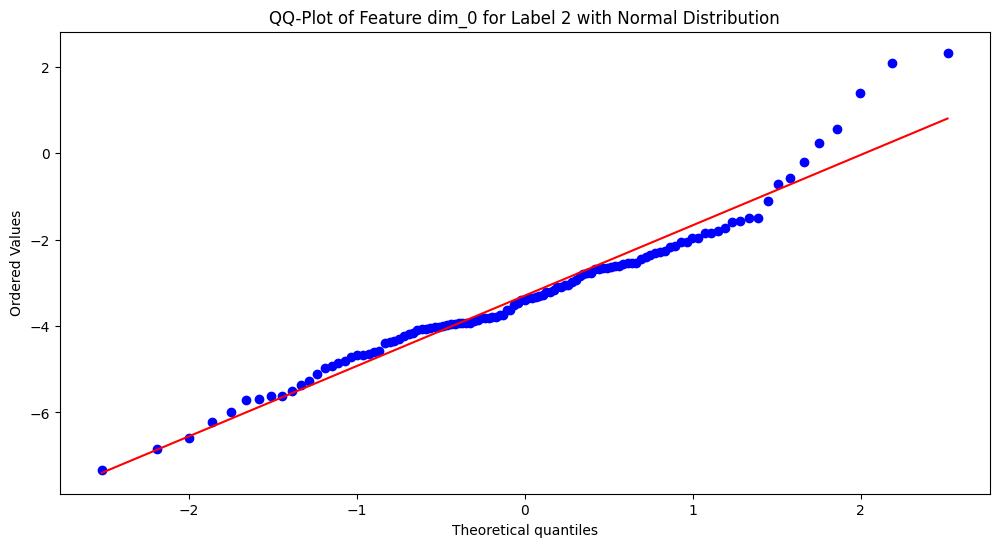

KS-test for Normal distribution (Feature dim_0, Label 2): Statistic = 0.07536065692684668, p-value = 0.4960663622025945
Data seems to follow a Normal distribution (Feature dim_0, Label 2).
Estimated parameters: Mean = -3.2969148199782414, Std = 1.6415364599073772


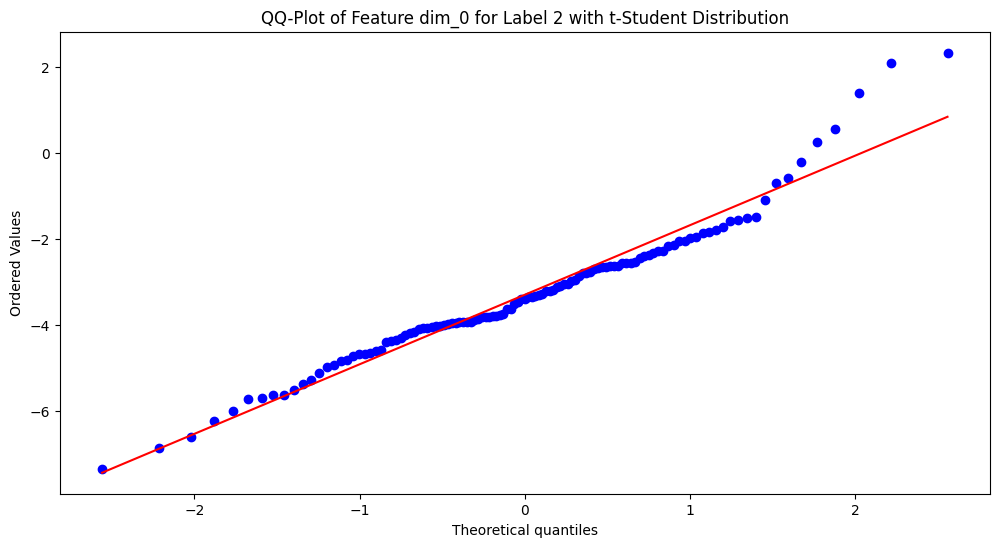

KS-test for t-Student distribution (Feature dim_0, Label 2): Statistic = 0.059097383275878546, p-value = 0.7860129425189303
Data seems to follow a t-Student distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 4.223346154580167, Location = -3.3912647182193707, Scale = 1.2250927860514396


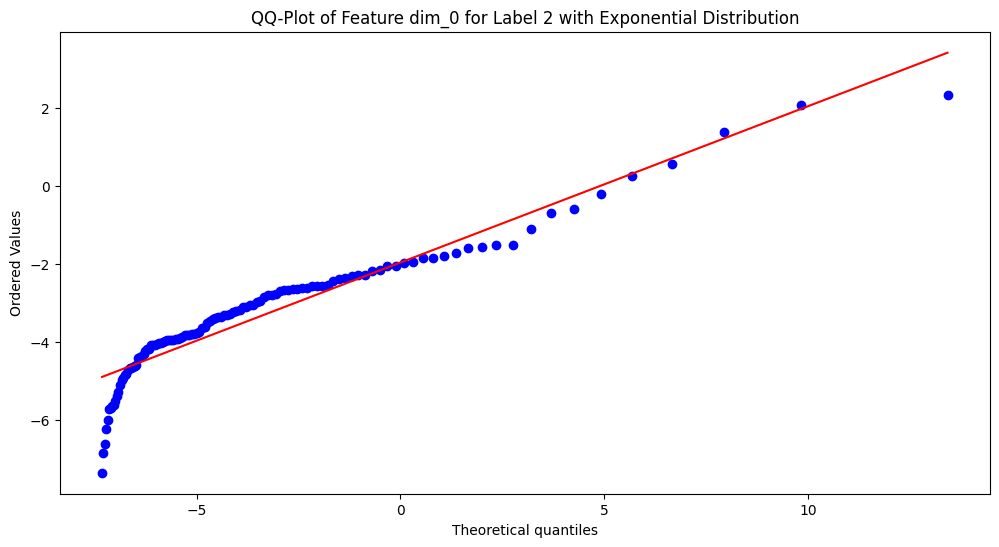

KS-test for Exponential distribution (Feature dim_0, Label 2): Statistic = 0.33236510691486393, p-value = 5.069384665840169e-12
Data does not follow an Exponential distribution (Feature dim_0, Label 2).


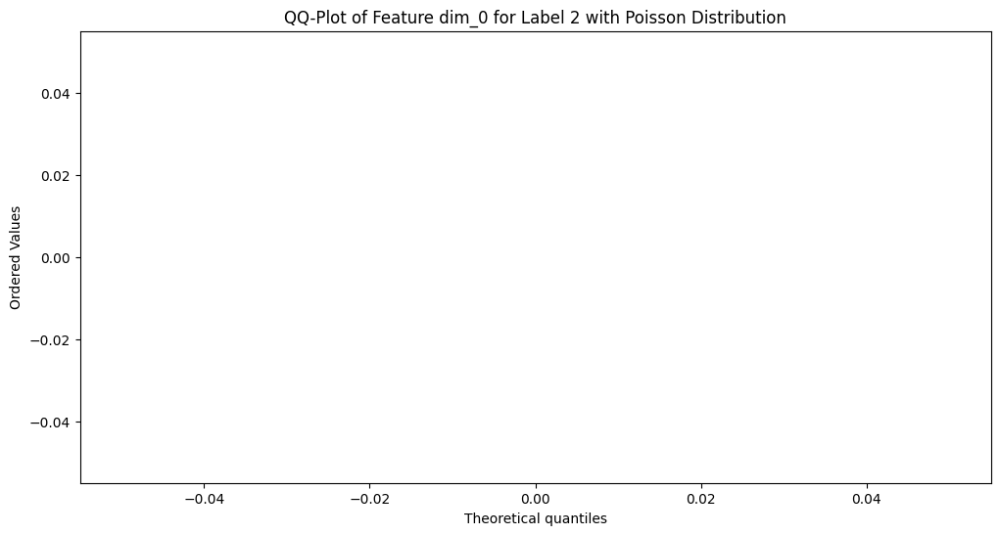

KS-test for Poisson distribution (Feature dim_0, Label 2): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_0, Label 2).


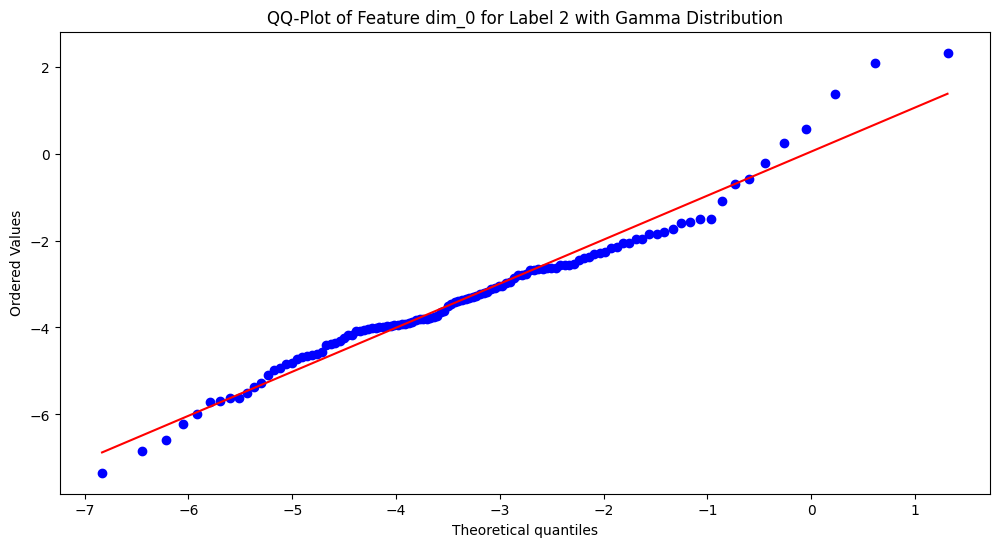

KS-test for Gamma distribution (Feature dim_0, Label 2): Statistic = 0.0738117528974514, p-value = 0.5226691675999737
Data seems to follow a Gamma distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 28.473433741247725, Location = -11.93613121443925, Scale = 0.30341323686325816


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


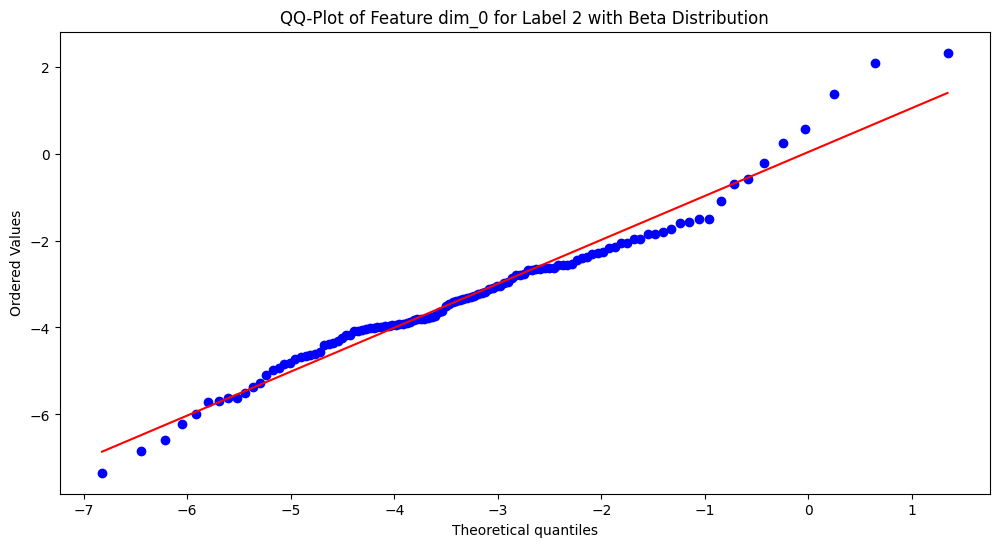

KS-test for Beta distribution (Feature dim_0, Label 2): Statistic = 0.07466942363596762, p-value = 0.5078646072212192
Data seems to follow a Beta distribution (Feature dim_0, Label 2).
Estimated parameters: a = 26.70797025303324, b = 5653371.829266786, Location = -11.682524707841068, Scale = 1775130.4006314434


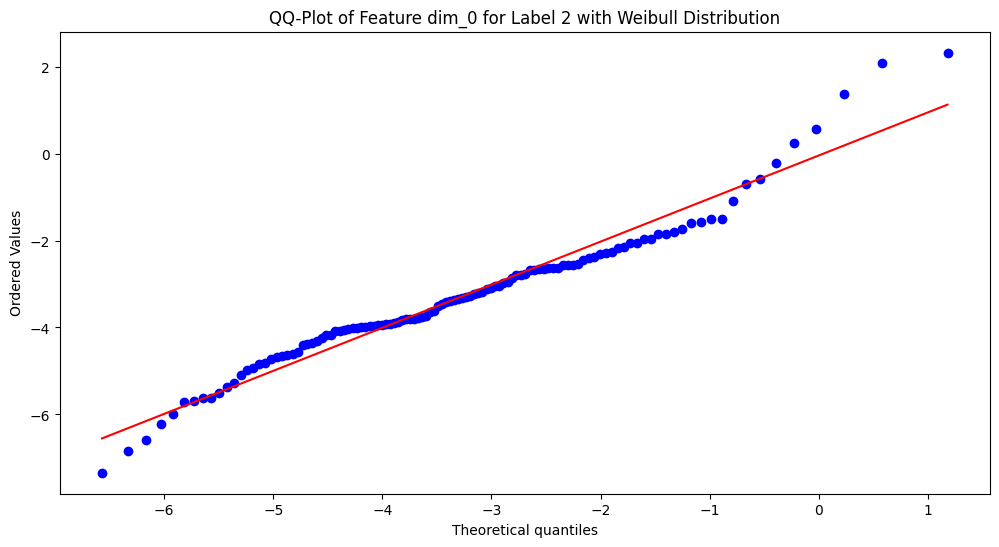

KS-test for Weibull distribution (Feature dim_0, Label 2): Statistic = 0.08022662670655822, p-value = 0.4168995848397391
Data seems to follow a Weibull distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 2.519620964754326, Location = -7.136266859951442, Scale = 4.3451047417027295


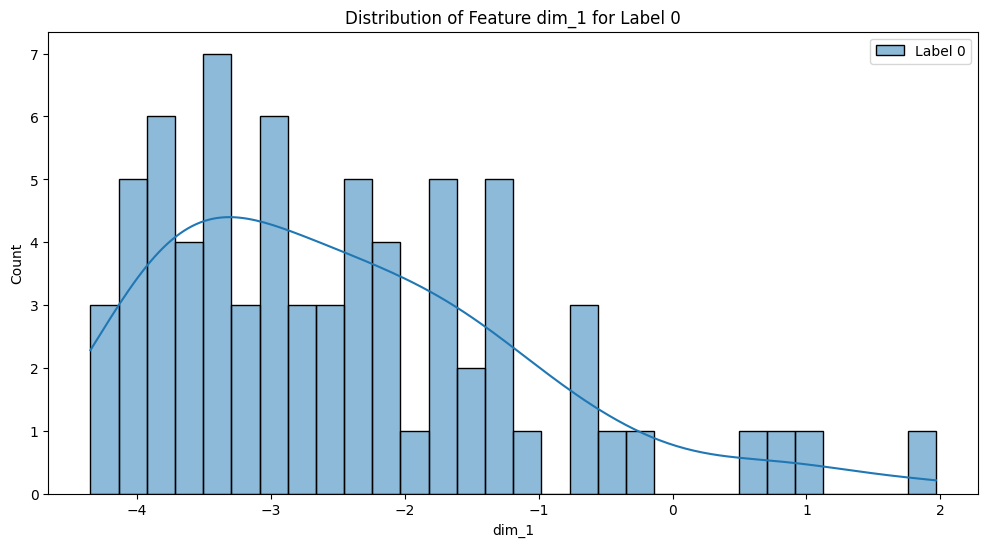

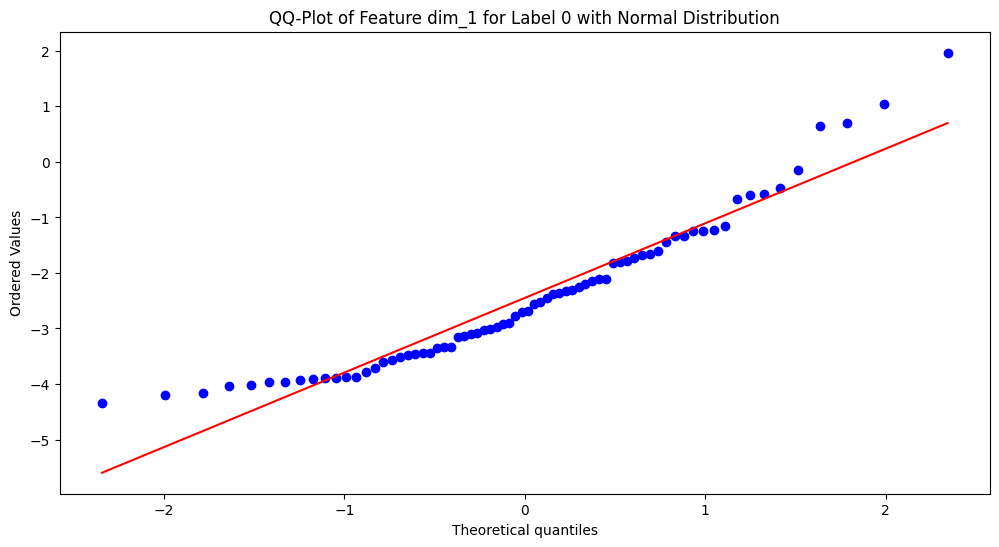

KS-test for Normal distribution (Feature dim_1, Label 0): Statistic = 0.09955412373543537, p-value = 0.444737758821241
Data seems to follow a Normal distribution (Feature dim_1, Label 0).
Estimated parameters: Mean = -2.4497756492346525, Std = 1.3684680686210058


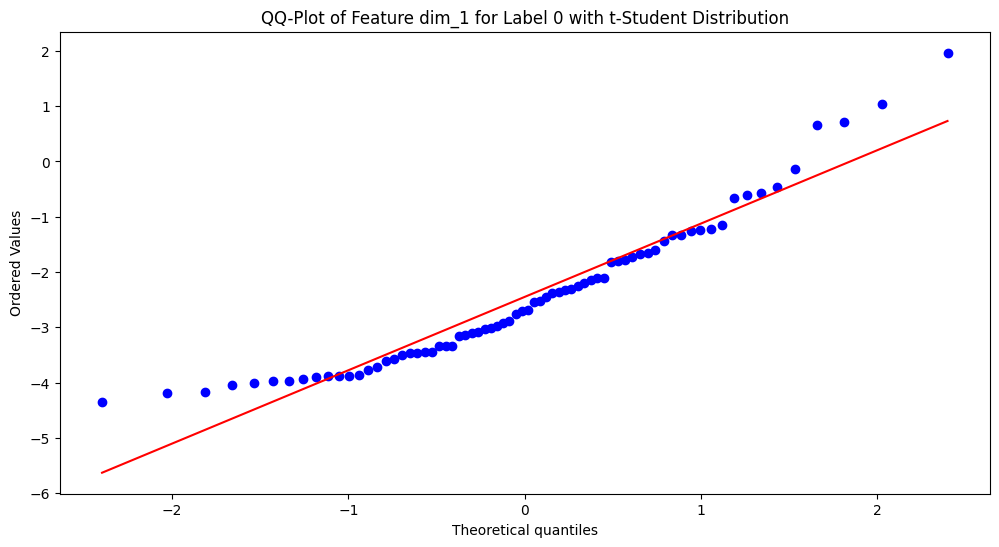

KS-test for t-Student distribution (Feature dim_1, Label 0): Statistic = 0.09012933222361286, p-value = 0.5711964716870412
Data seems to follow a t-Student distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 9.157332138584566, Location = -2.5582845759493873, Scale = 1.2042946178217853


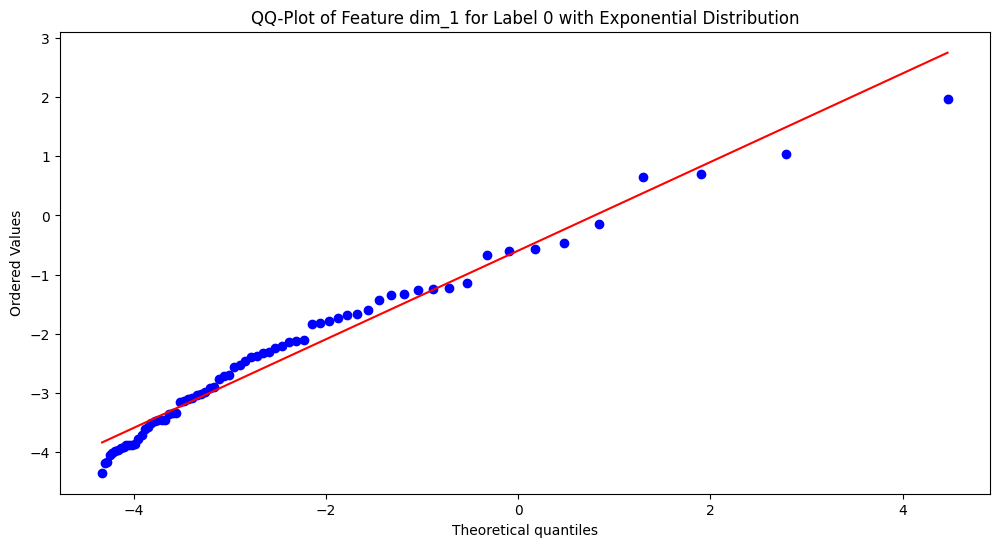

KS-test for Exponential distribution (Feature dim_1, Label 0): Statistic = 0.12139482666929785, p-value = 0.22052256416250723
Data seems to follow an Exponential distribution (Feature dim_1, Label 0).
Estimated parameters: Location = -4.345442771911621, Scale = 1.8956671226769686


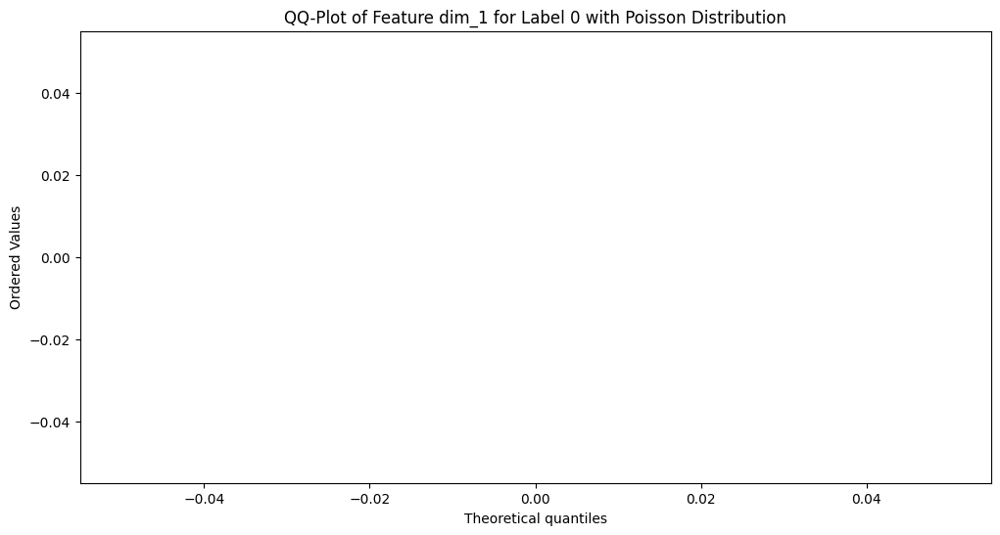

KS-test for Poisson distribution (Feature dim_1, Label 0): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_1, Label 0).


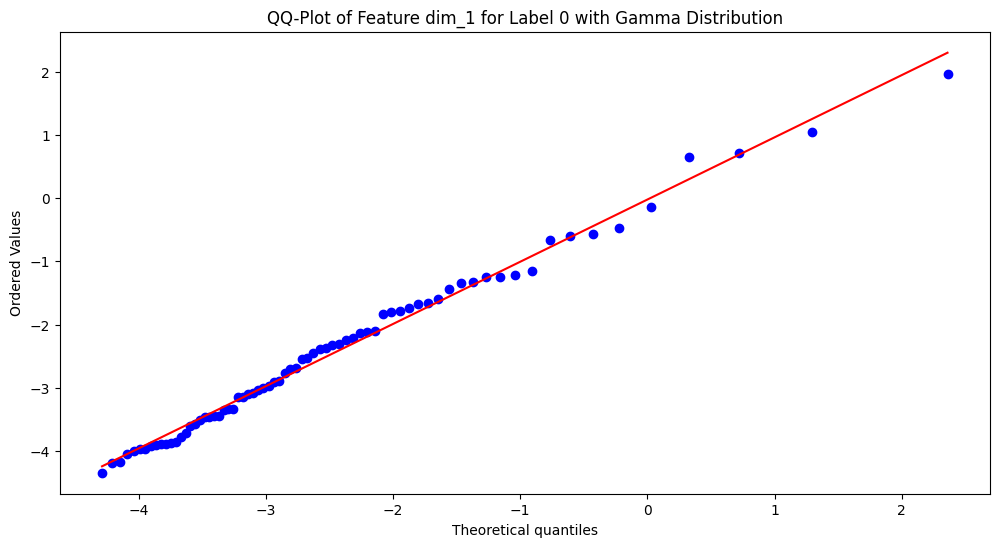

KS-test for Gamma distribution (Feature dim_1, Label 0): Statistic = 0.06053428490068462, p-value = 0.940054057903267
Data seems to follow a Gamma distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 1.8632380543371365, Location = -4.412380188637648, Scale = 1.0533278861092392


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


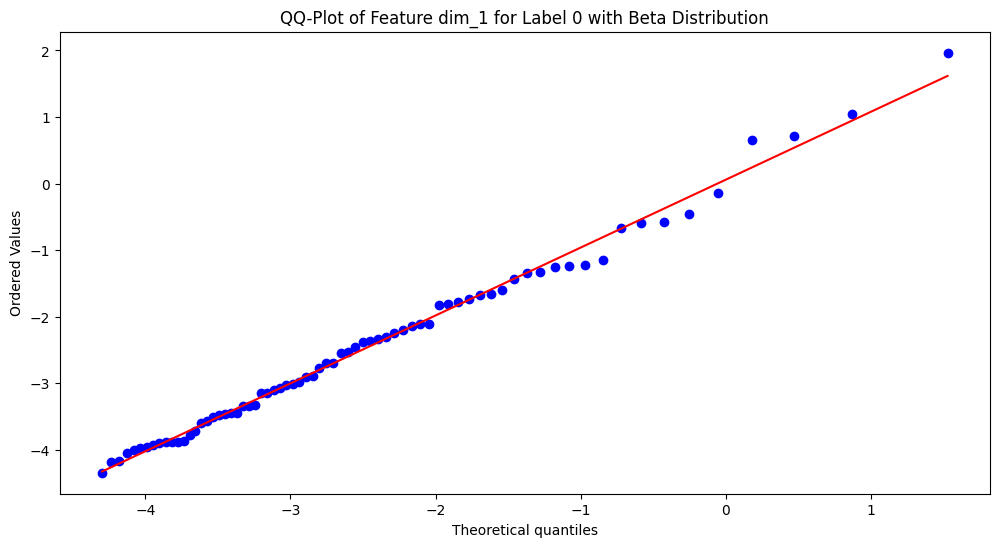

KS-test for Beta distribution (Feature dim_1, Label 0): Statistic = 0.04829993822407805, p-value = 0.9931625441501647
Data seems to follow a Beta distribution (Feature dim_1, Label 0).
Estimated parameters: a = 1.3948512696817923, b = 5.512855450866979, Location = -4.368369103532766, Scale = 9.506415807197953


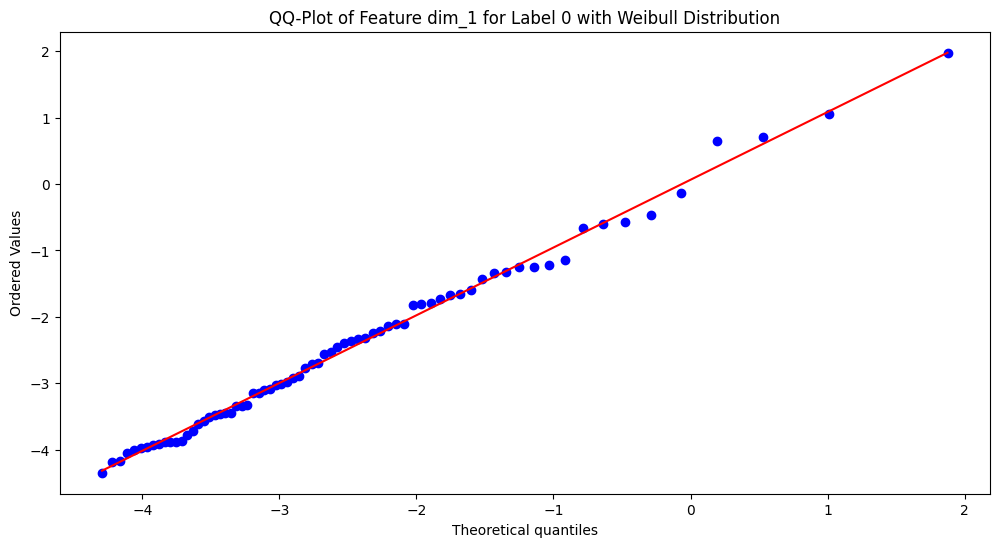

KS-test for Weibull distribution (Feature dim_1, Label 0): Statistic = 0.055965617344265584, p-value = 0.9684145021729307
Data seems to follow a Weibull distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 1.417049852683542, Location = -4.373980834692236, Scale = 2.113183168582707


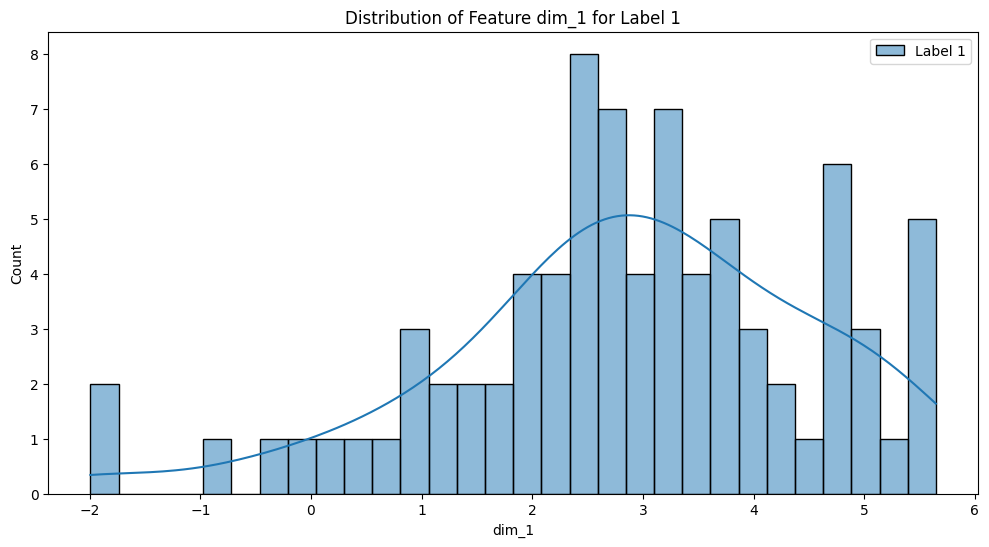

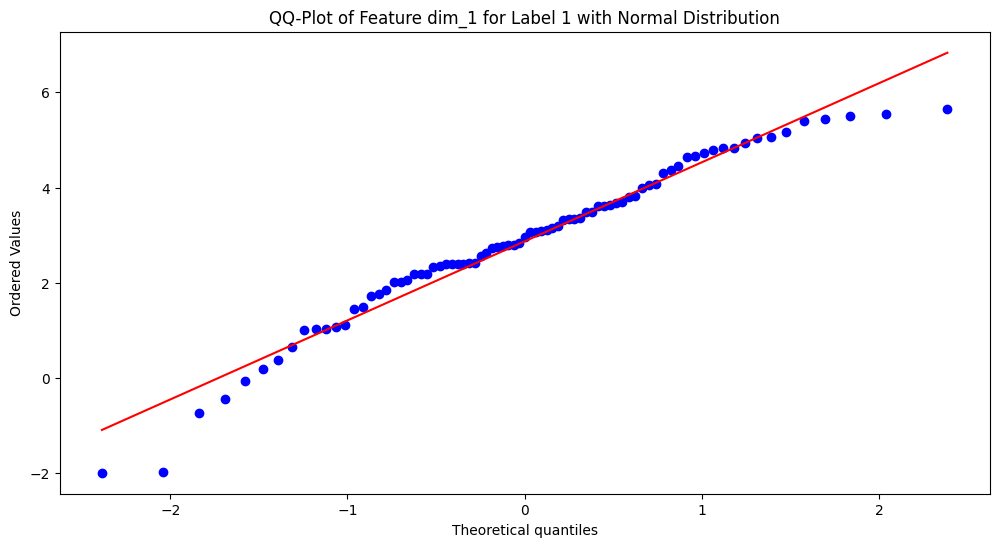

KS-test for Normal distribution (Feature dim_1, Label 1): Statistic = 0.08287027076238829, p-value = 0.6045053868092165
Data seems to follow a Normal distribution (Feature dim_1, Label 1).
Estimated parameters: Mean = 2.869425572362947, Std = 1.6604617301233344


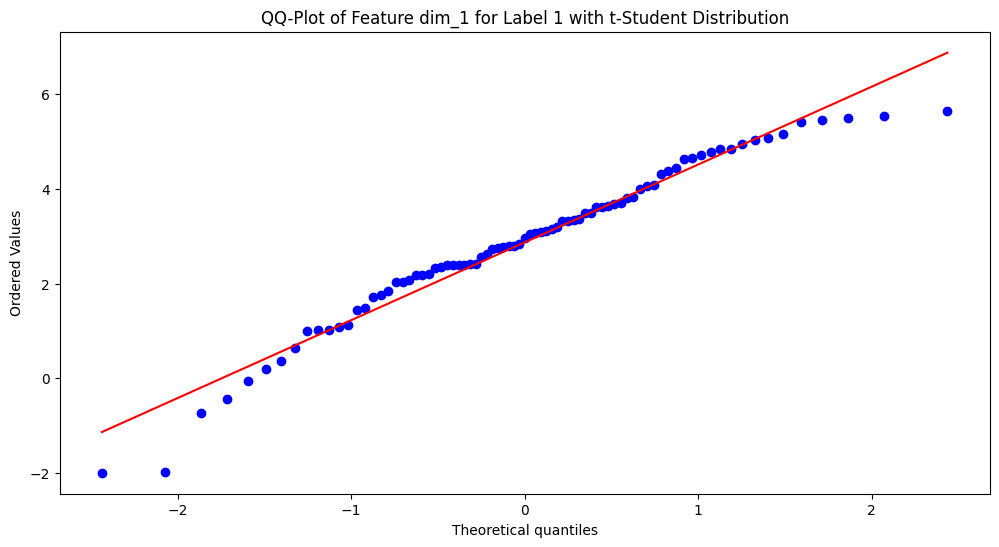

KS-test for t-Student distribution (Feature dim_1, Label 1): Statistic = 0.05427487404271514, p-value = 0.9603683939324354
Data seems to follow a t-Student distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 10.881846314206019, Location = 2.9378852936504316, Scale = 1.494620210960159


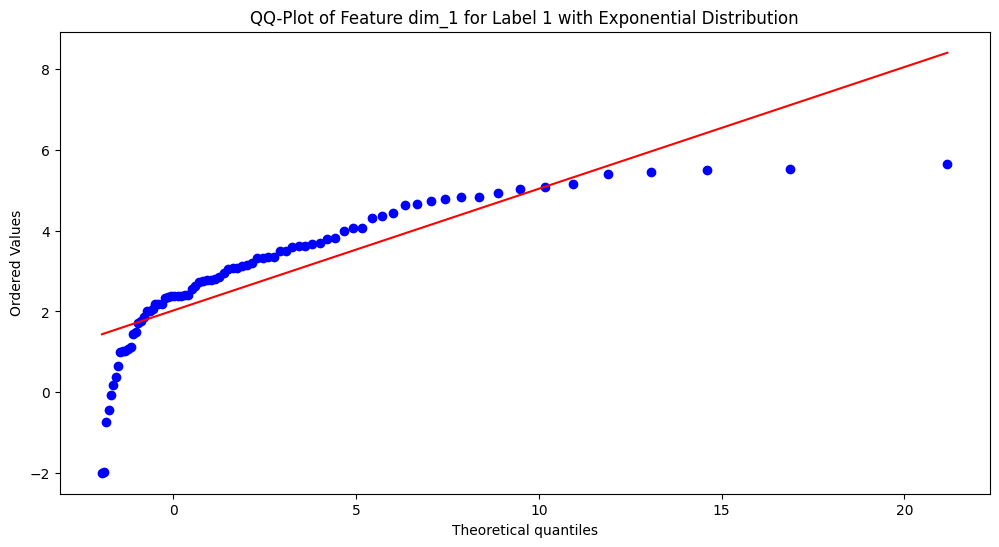

KS-test for Exponential distribution (Feature dim_1, Label 1): Statistic = 0.36179208891286463, p-value = 5.27009171515688e-10
Data does not follow an Exponential distribution (Feature dim_1, Label 1).


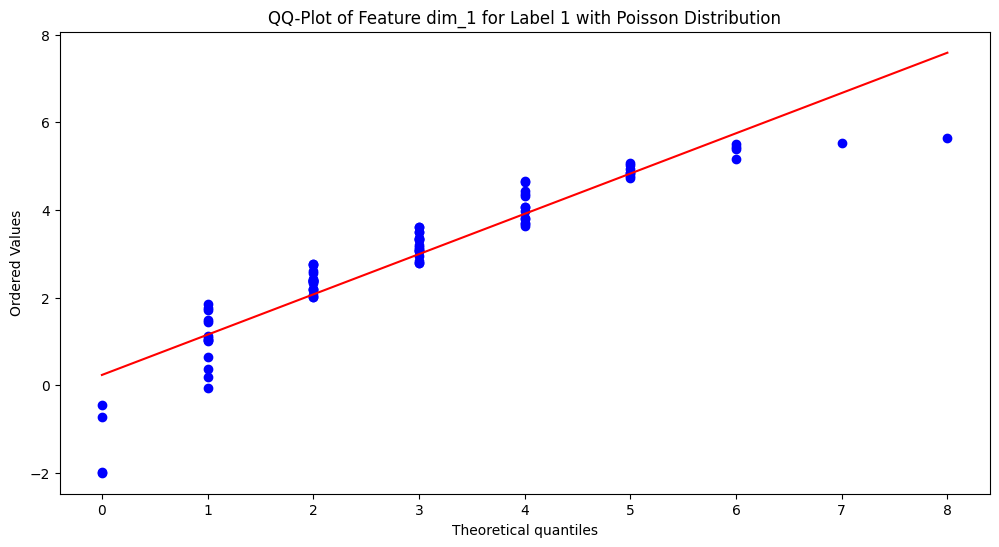

KS-test for Poisson distribution (Feature dim_1, Label 1): Statistic = 0.2308484650626389, p-value = 0.0002810172150174863
Data does not follow a Poisson distribution (Feature dim_1, Label 1).


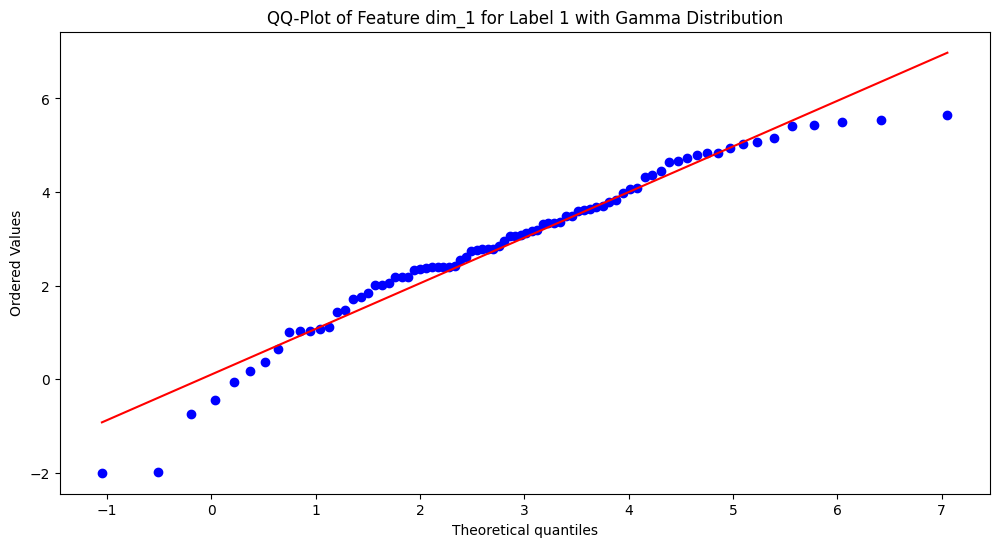

KS-test for Gamma distribution (Feature dim_1, Label 1): Statistic = 0.09844265271765806, p-value = 0.3872230701127579
Data seems to follow a Gamma distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 268.9598911047573, Location = -25.01754588719359, Scale = 0.10357765672795599


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


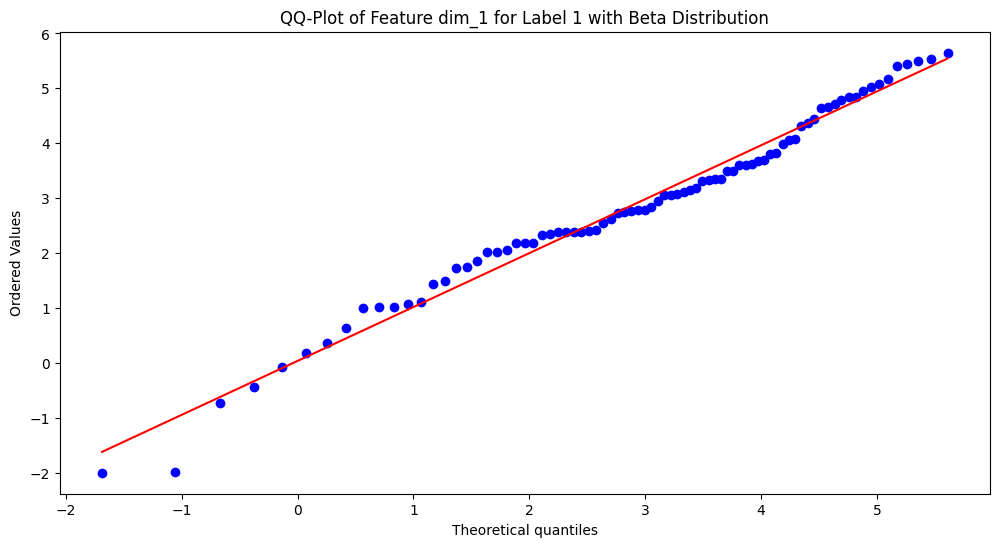

KS-test for Beta distribution (Feature dim_1, Label 1): Statistic = 0.0822513108664249, p-value = 0.6138696090653865
Data seems to follow a Beta distribution (Feature dim_1, Label 1).
Estimated parameters: a = 4.76617834385725, b = 1.9006262395758426, Location = -4.552566562104803, Scale = 10.391723132490782


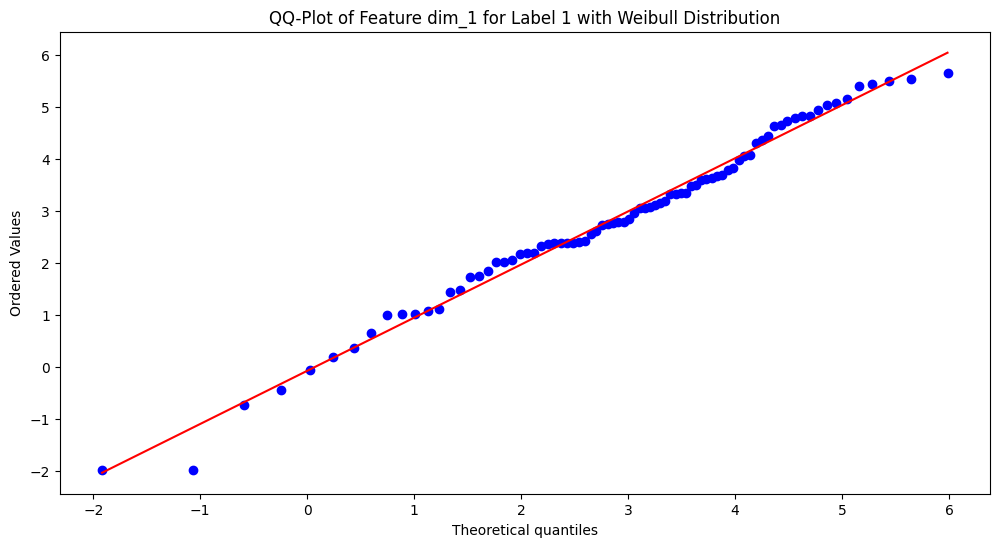

KS-test for Weibull distribution (Feature dim_1, Label 1): Statistic = 0.0558812619920932, p-value = 0.9497476087392154
Data seems to follow a Weibull distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 10.570906917373195, Location = -11.573136203206534, Scale = 15.148288655068828


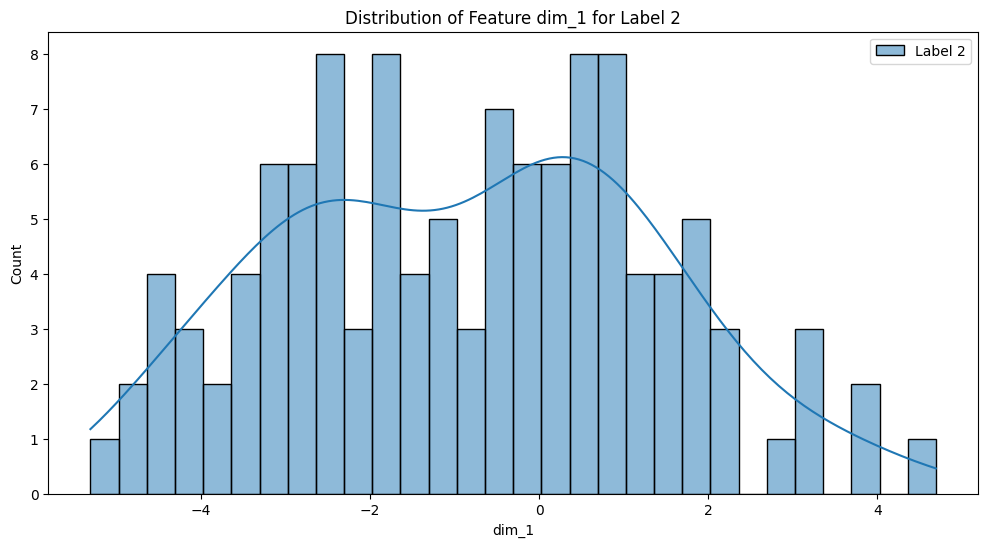

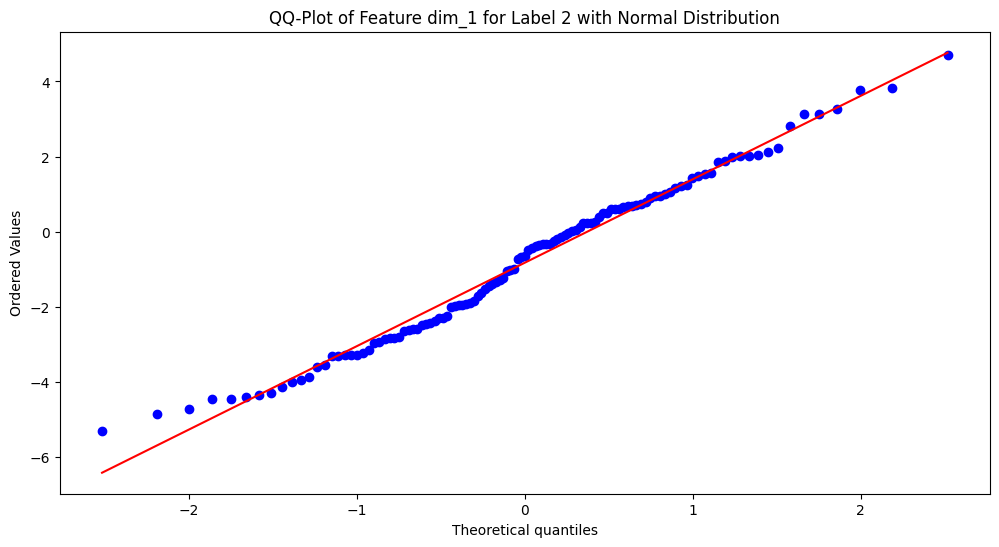

KS-test for Normal distribution (Feature dim_1, Label 2): Statistic = 0.06472145956277509, p-value = 0.686478681684763
Data seems to follow a Normal distribution (Feature dim_1, Label 2).
Estimated parameters: Mean = -0.8275960896235819, Std = 2.205532377103237


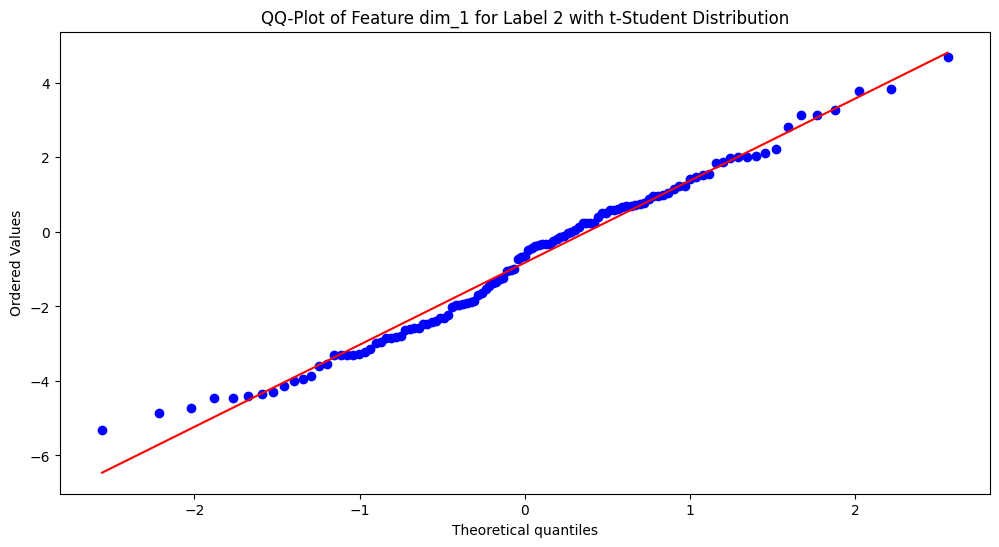

KS-test for t-Student distribution (Feature dim_1, Label 2): Statistic = 0.06563896145795223, p-value = 0.6697520395473657
Data seems to follow a t-Student distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 28166851689.583504, Location = -0.8275948799862657, Scale = 2.1960877379307933


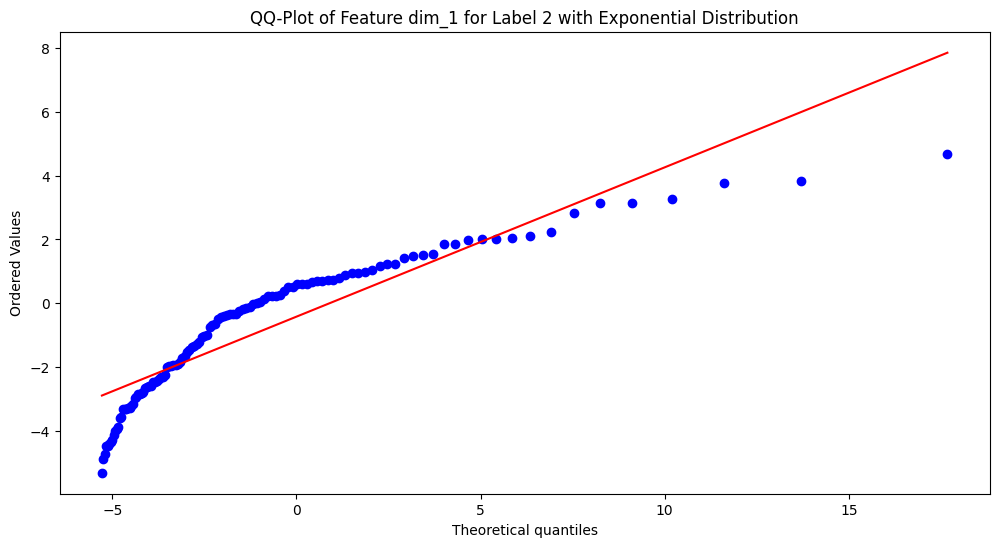

KS-test for Exponential distribution (Feature dim_1, Label 2): Statistic = 0.23970326512883572, p-value = 2.1175855562579647e-06
Data does not follow an Exponential distribution (Feature dim_1, Label 2).


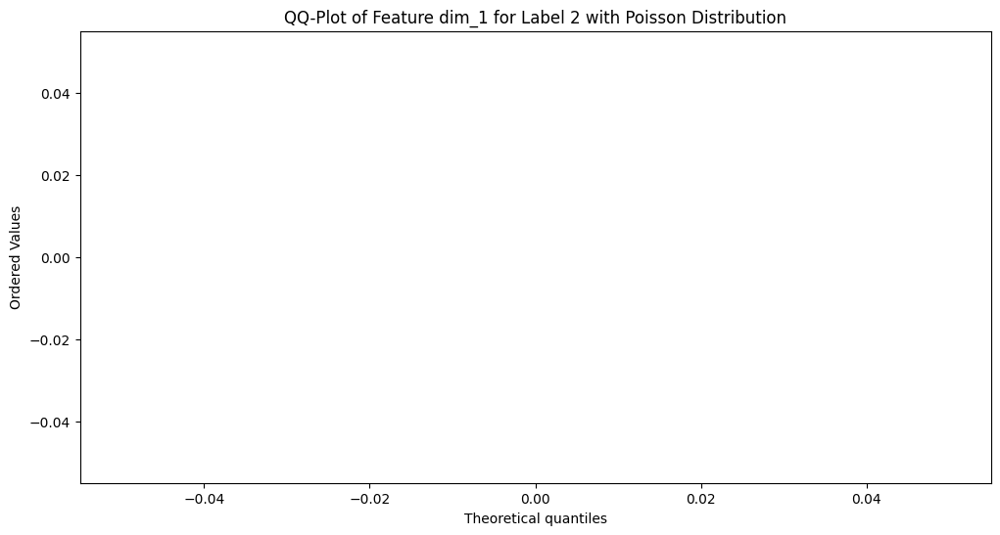

KS-test for Poisson distribution (Feature dim_1, Label 2): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_1, Label 2).


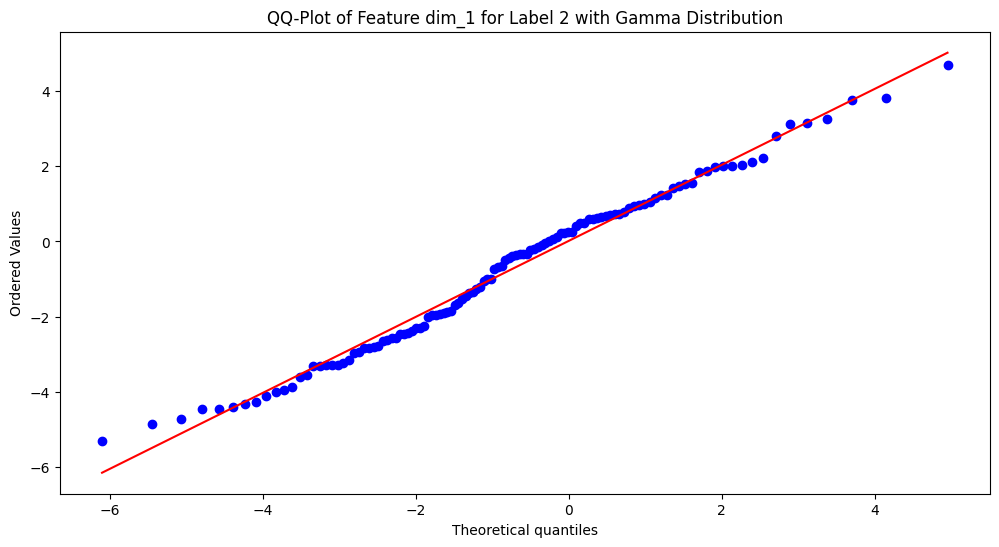

KS-test for Gamma distribution (Feature dim_1, Label 2): Statistic = 0.06739164352733429, p-value = 0.6377274493158902
Data seems to follow a Gamma distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 233.49633994844044, Location = -34.369659771529484, Scale = 0.14364330621261623


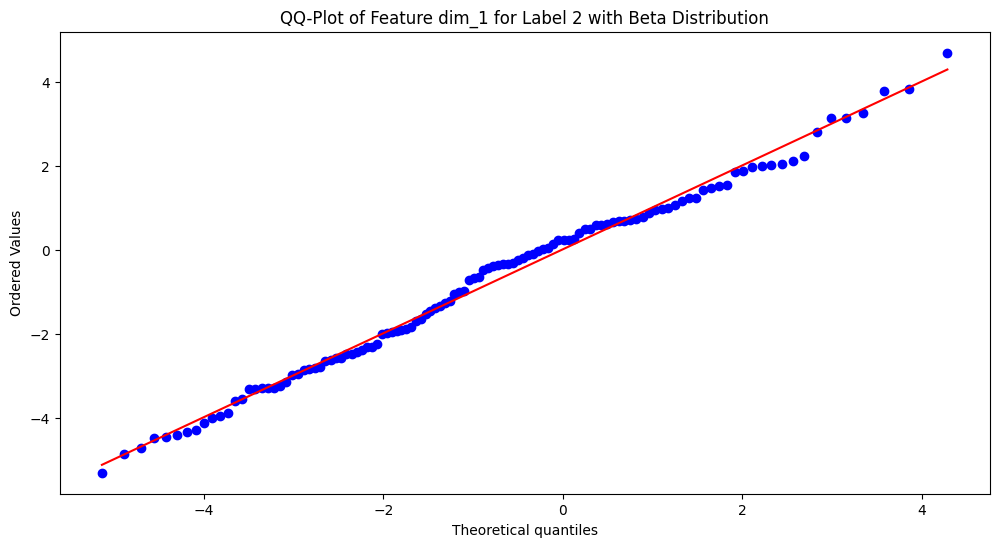

KS-test for Beta distribution (Feature dim_1, Label 2): Statistic = 0.0666365534818194, p-value = 0.6515254782531364
Data seems to follow a Beta distribution (Feature dim_1, Label 2).
Estimated parameters: a = 2.2339991402124286, b = 2.918171896958274, Location = -5.628791988761529, Scale = 11.049271190950265


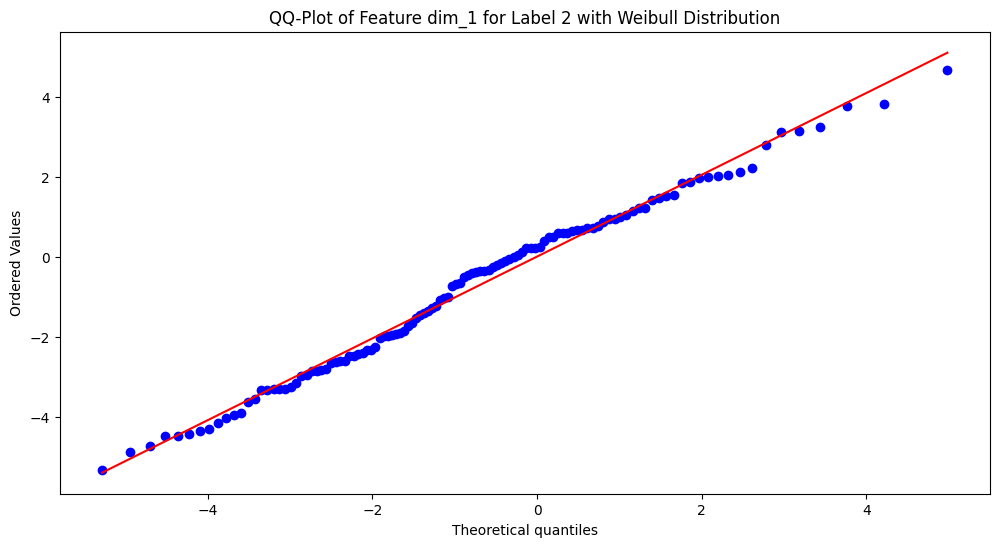

KS-test for Weibull distribution (Feature dim_1, Label 2): Statistic = 0.07315666692405198, p-value = 0.5340923206225237
Data seems to follow a Weibull distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 2.6388403828604465, Location = -6.14255487998447, Scale = 5.987494217972875


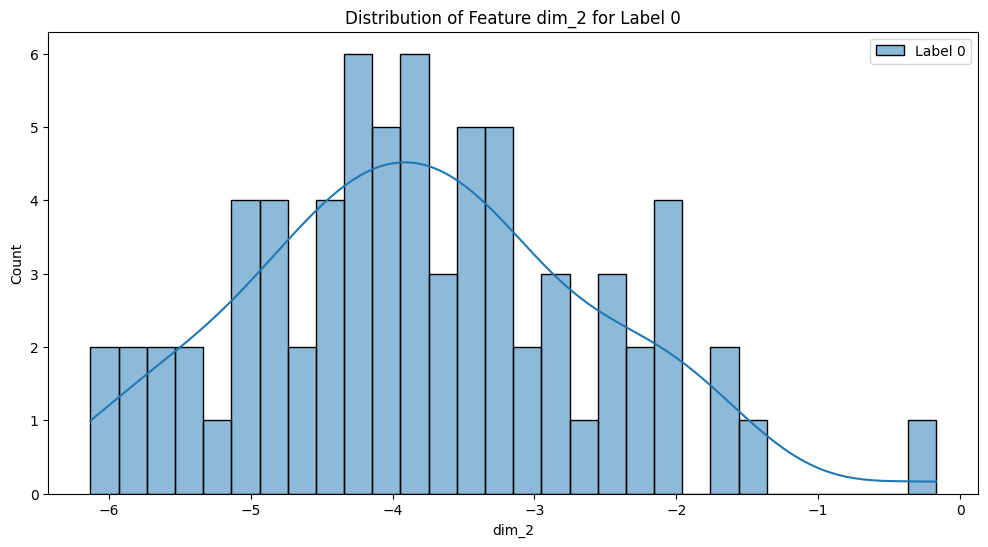

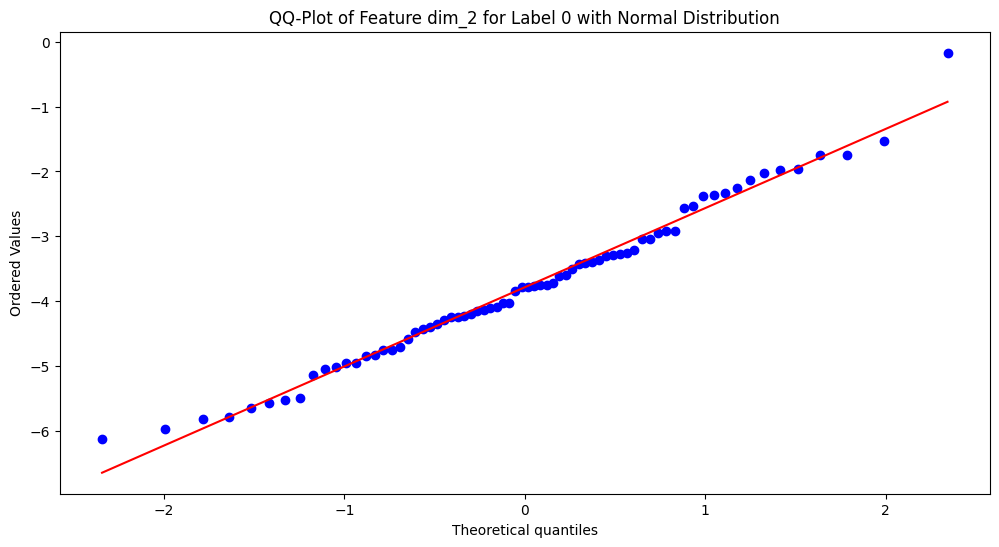

KS-test for Normal distribution (Feature dim_2, Label 0): Statistic = 0.05296224756871615, p-value = 0.9811973642218337
Data seems to follow a Normal distribution (Feature dim_2, Label 0).
Estimated parameters: Mean = -3.78501249021954, Std = 1.2049539699806446


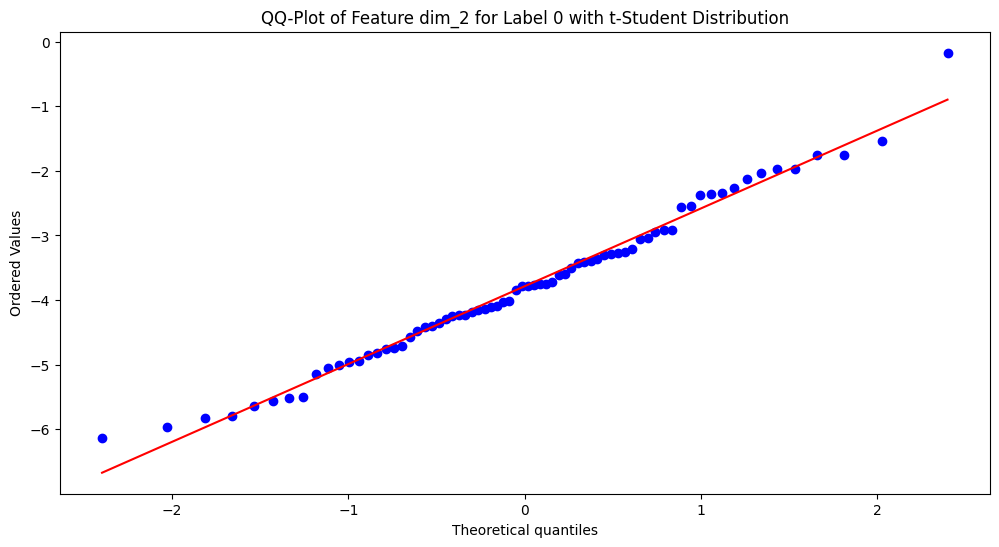

KS-test for t-Student distribution (Feature dim_2, Label 0): Statistic = 0.051772566530076336, p-value = 0.9850861739677995
Data seems to follow a t-Student distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 503991144.07014275, Location = -3.785011835827479, Scale = 1.1965574961831855


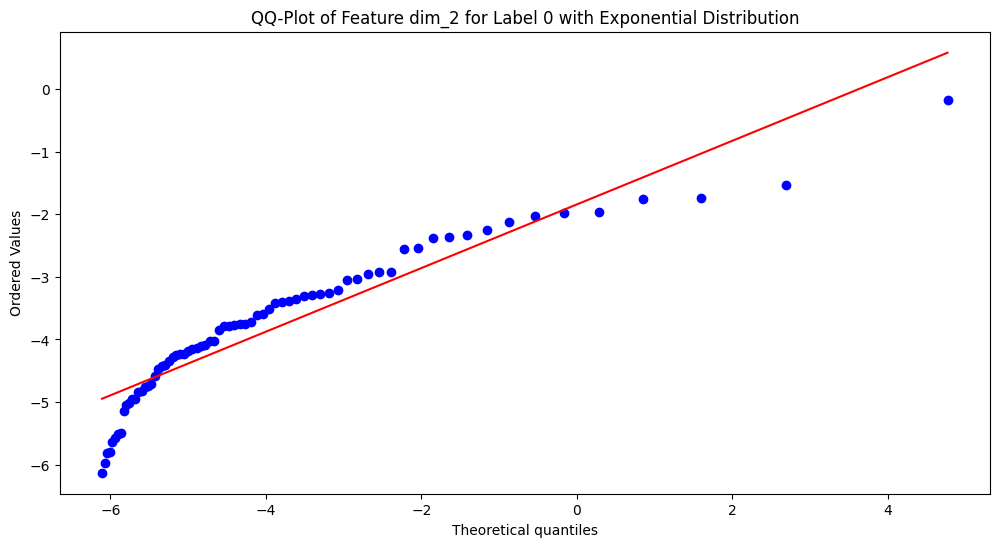

KS-test for Exponential distribution (Feature dim_2, Label 0): Statistic = 0.2434024992568255, p-value = 0.00030600356498793367
Data does not follow an Exponential distribution (Feature dim_2, Label 0).


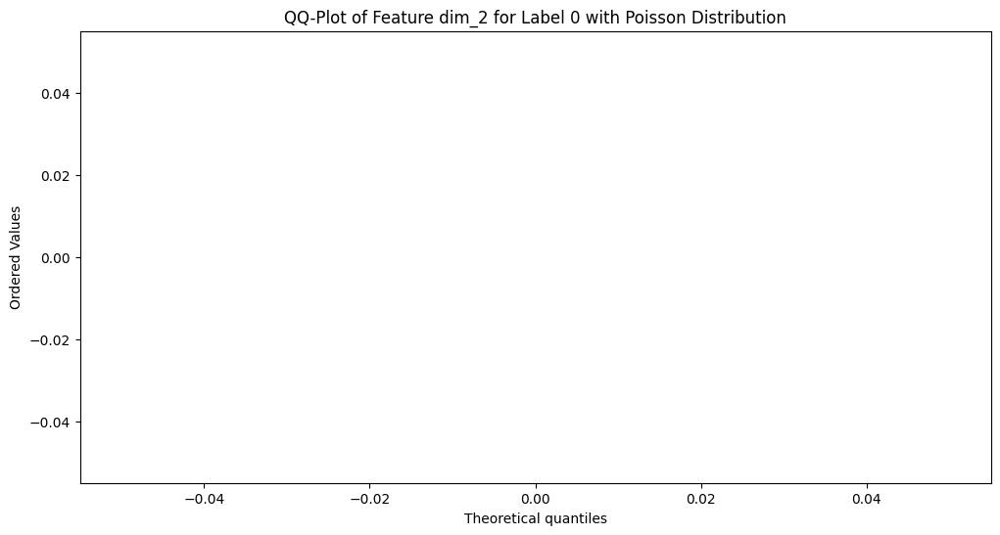

KS-test for Poisson distribution (Feature dim_2, Label 0): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_2, Label 0).


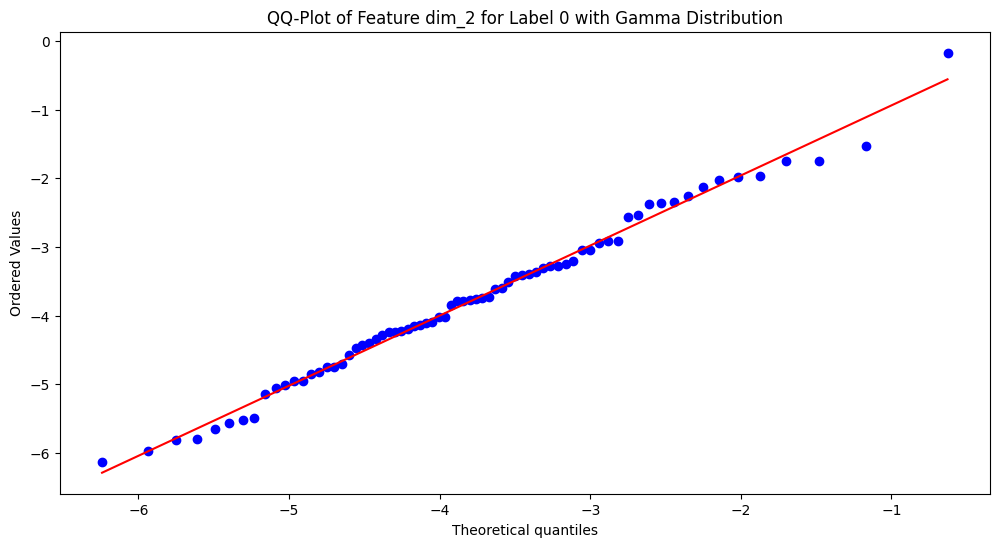

KS-test for Gamma distribution (Feature dim_2, Label 0): Statistic = 0.04642574478355857, p-value = 0.9958408540249695
Data seems to follow a Gamma distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 26.04385674683411, Location = -9.909812623302983, Scale = 0.23517254268063606


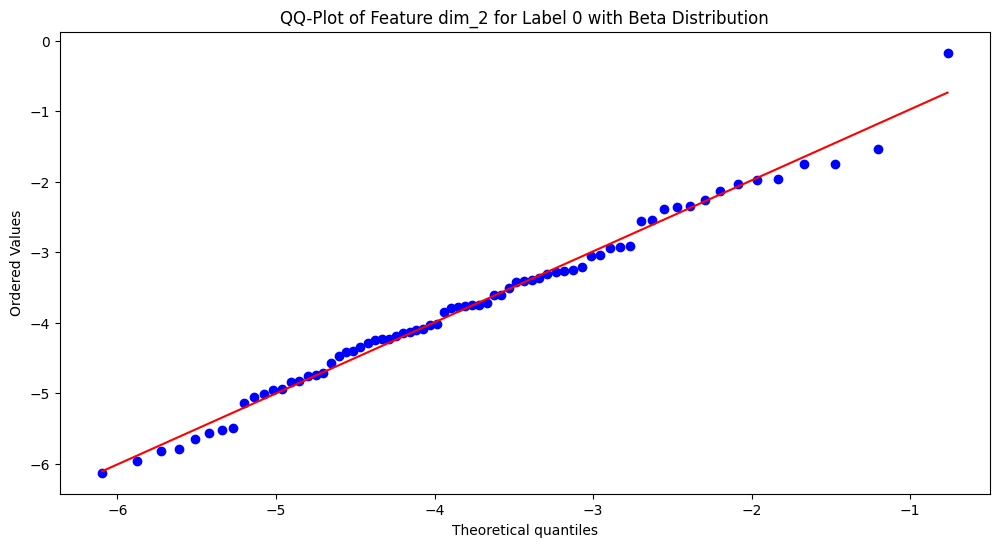

KS-test for Beta distribution (Feature dim_2, Label 0): Statistic = 0.05012064070748273, p-value = 0.9894936475460557
Data seems to follow a Beta distribution (Feature dim_2, Label 0).
Estimated parameters: a = 3.893960492633221, b = 7.599893091229952, Location = -6.836110661902078, Scale = 9.00068701631939


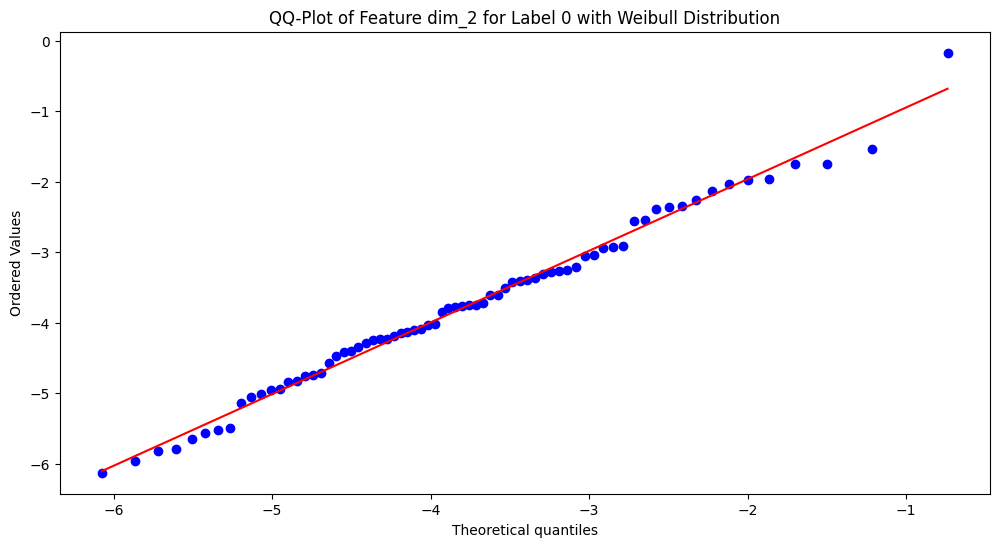

KS-test for Weibull distribution (Feature dim_2, Label 0): Statistic = 0.0462977794094811, p-value = 0.9959886979810517
Data seems to follow a Weibull distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 2.4598526654005948, Location = -6.5429583203486, Scale = 3.1075794774615373


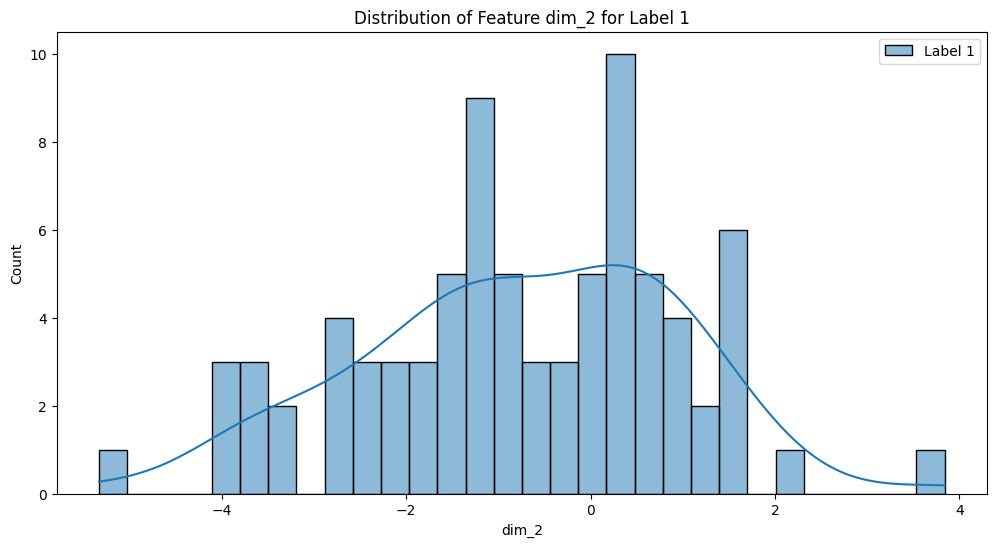

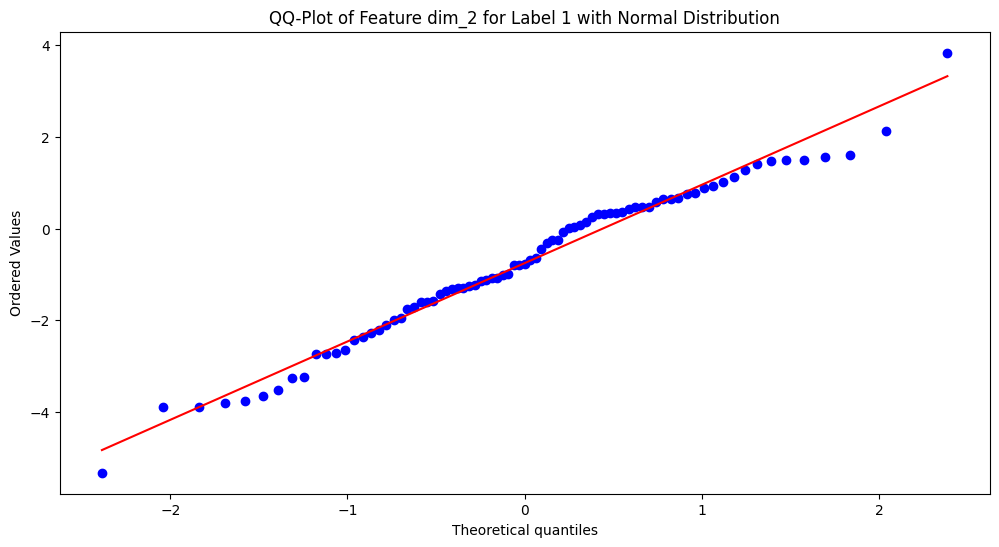

KS-test for Normal distribution (Feature dim_2, Label 1): Statistic = 0.08271097473369815, p-value = 0.6069130437477042
Data seems to follow a Normal distribution (Feature dim_2, Label 1).
Estimated parameters: Mean = -0.7532430911137734, Std = 1.6962860027793416


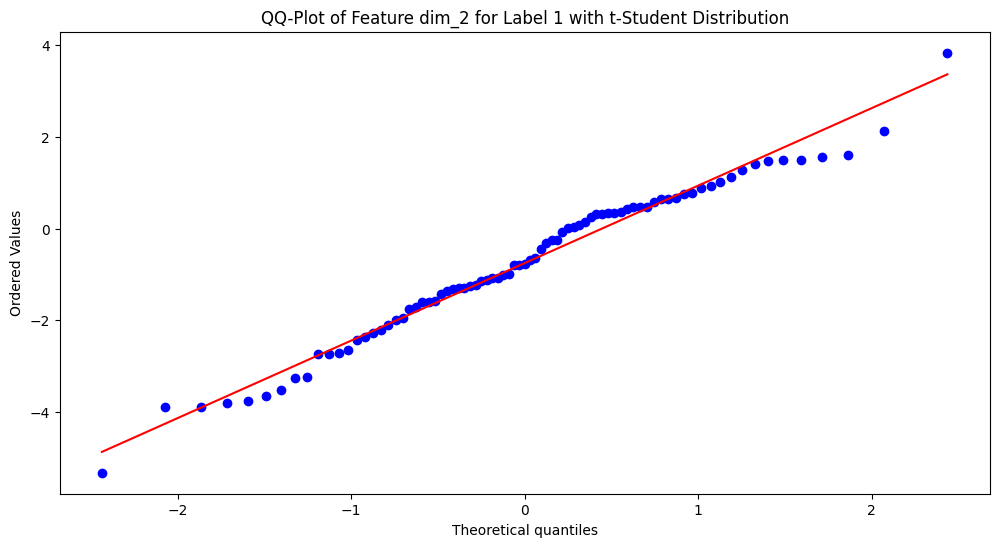

KS-test for t-Student distribution (Feature dim_2, Label 1): Statistic = 0.08399858167161356, p-value = 0.5875063314515516
Data seems to follow a t-Student distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 90693296571.91873, Location = -0.7532428169012304, Scale = 1.6857823252660067


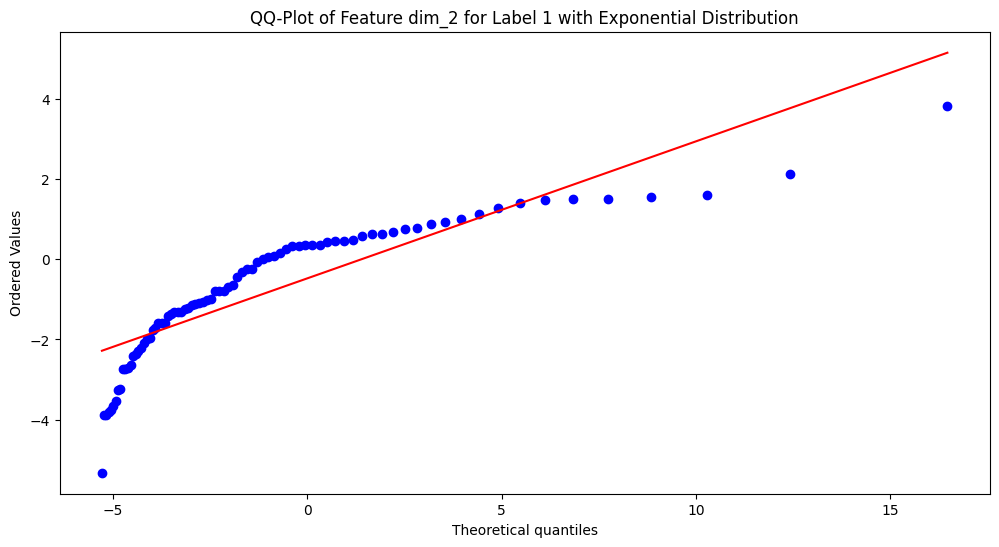

KS-test for Exponential distribution (Feature dim_2, Label 1): Statistic = 0.3200707233644828, p-value = 7.000679034344017e-08
Data does not follow an Exponential distribution (Feature dim_2, Label 1).


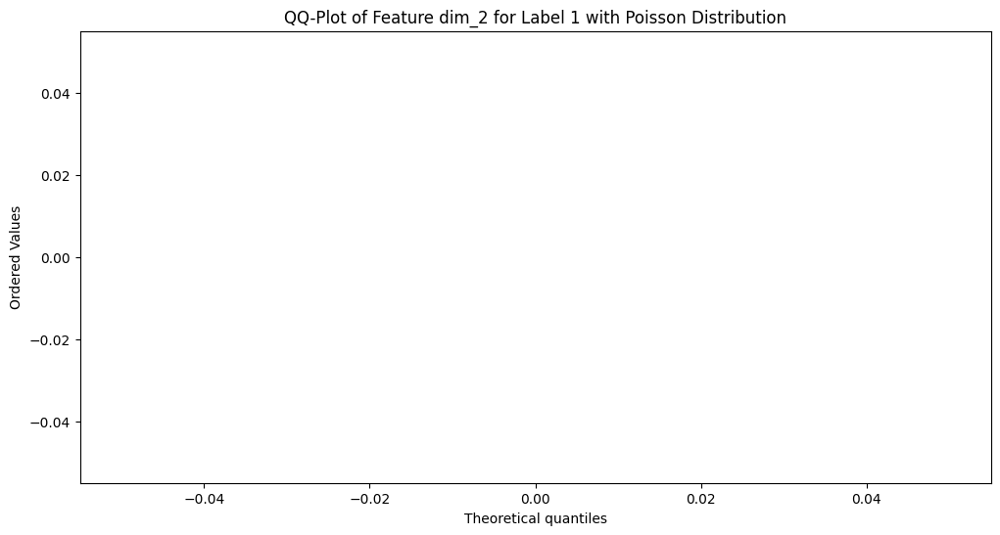

KS-test for Poisson distribution (Feature dim_2, Label 1): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_2, Label 1).


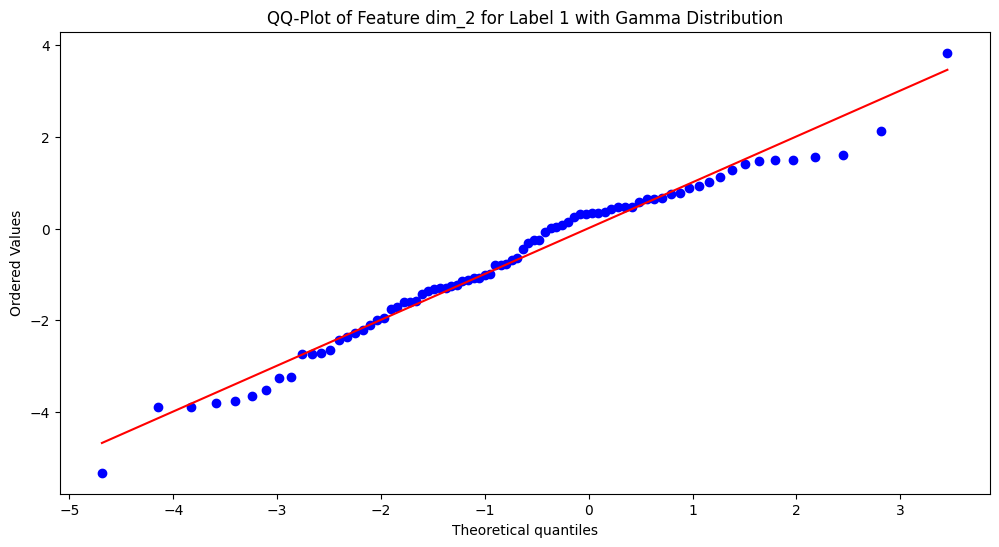

KS-test for Gamma distribution (Feature dim_2, Label 1): Statistic = 0.0868773122586205, p-value = 0.5447176999461989
Data seems to follow a Gamma distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 336.87692715334254, Location = -32.075344099017826, Scale = 0.09295175850211129


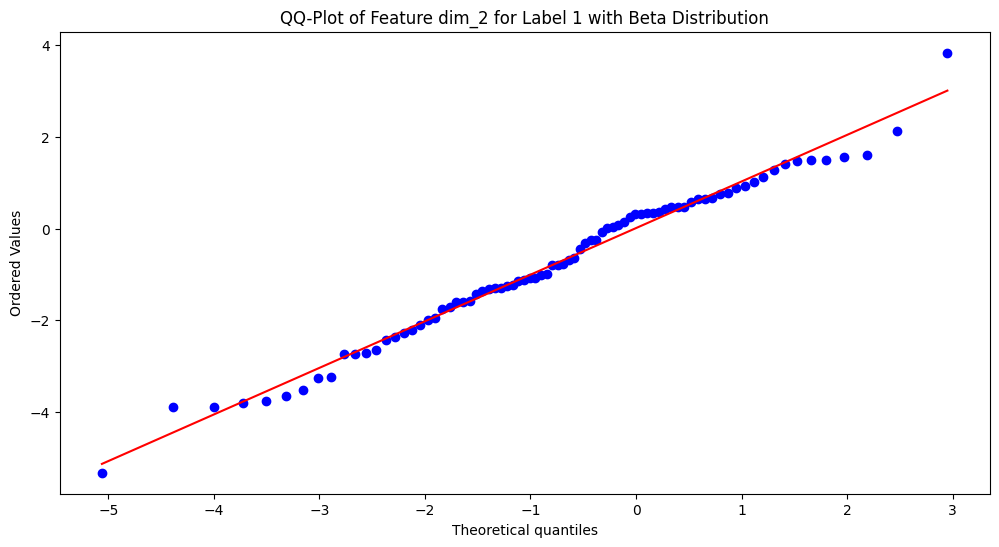

KS-test for Beta distribution (Feature dim_2, Label 1): Statistic = 0.07646843936011427, p-value = 0.7016699988442718
Data seems to follow a Beta distribution (Feature dim_2, Label 1).
Estimated parameters: a = 169.19528141646666, b = 37.81651823571481, Location = -52.16038863330219, Scale = 62.89523368968388


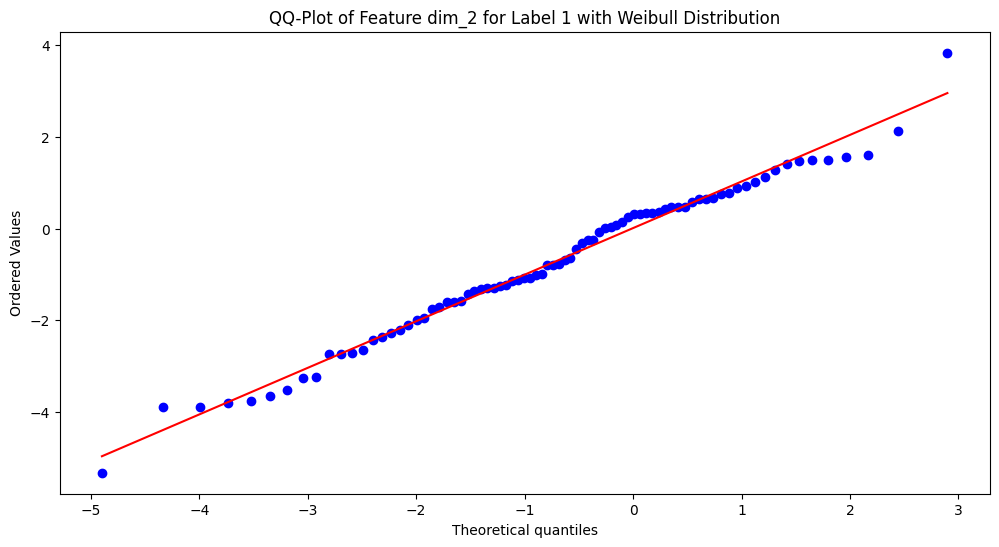

KS-test for Weibull distribution (Feature dim_2, Label 1): Statistic = 0.0728834444566483, p-value = 0.7549568325504266
Data seems to follow a Weibull distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 4.568973957052399, Location = -7.5052582496222175, Scale = 7.392205314122966


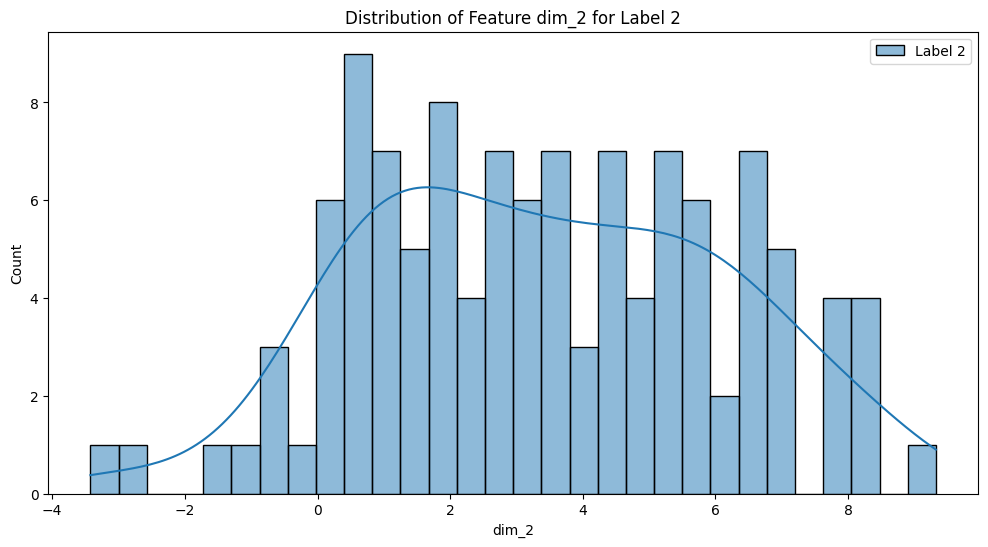

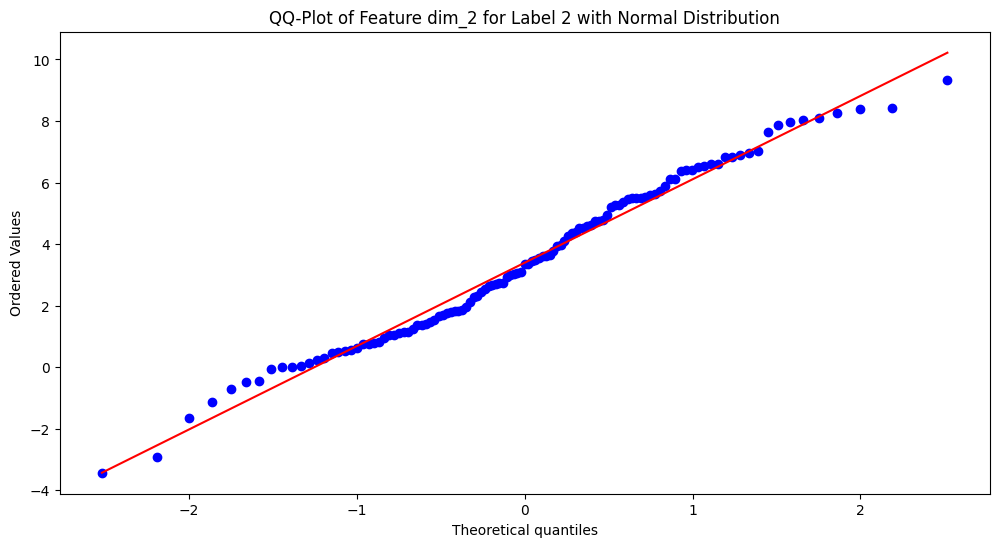

KS-test for Normal distribution (Feature dim_2, Label 2): Statistic = 0.07368451193400155, p-value = 0.5248803755227232
Data seems to follow a Normal distribution (Feature dim_2, Label 2).
Estimated parameters: Mean = 3.3960575142986755, Std = 2.692087561822481


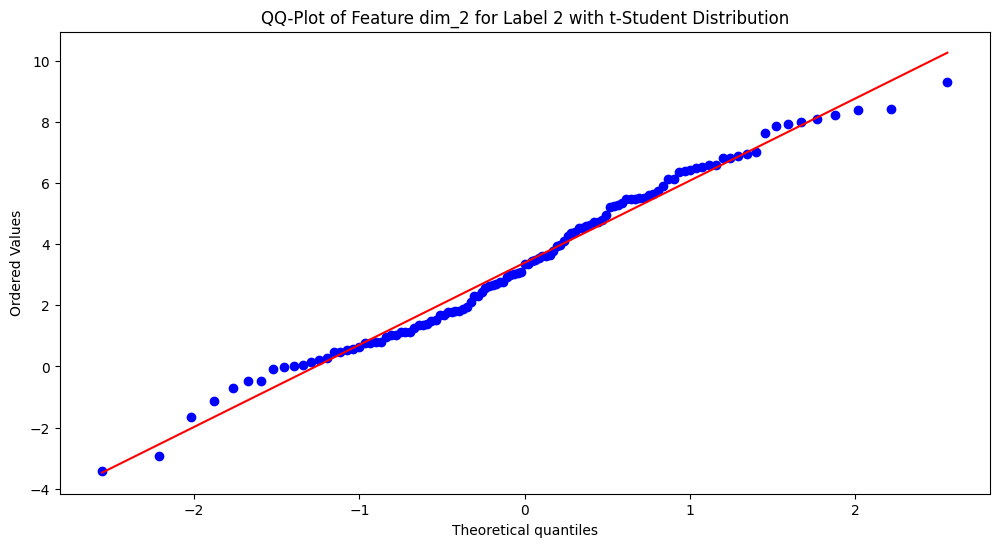

KS-test for t-Student distribution (Feature dim_2, Label 2): Statistic = 0.07451280732372995, p-value = 0.5105546664801632
Data seems to follow a t-Student distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 41261535048.558044, Location = 3.396059125971778, Scale = 2.6805578397052976


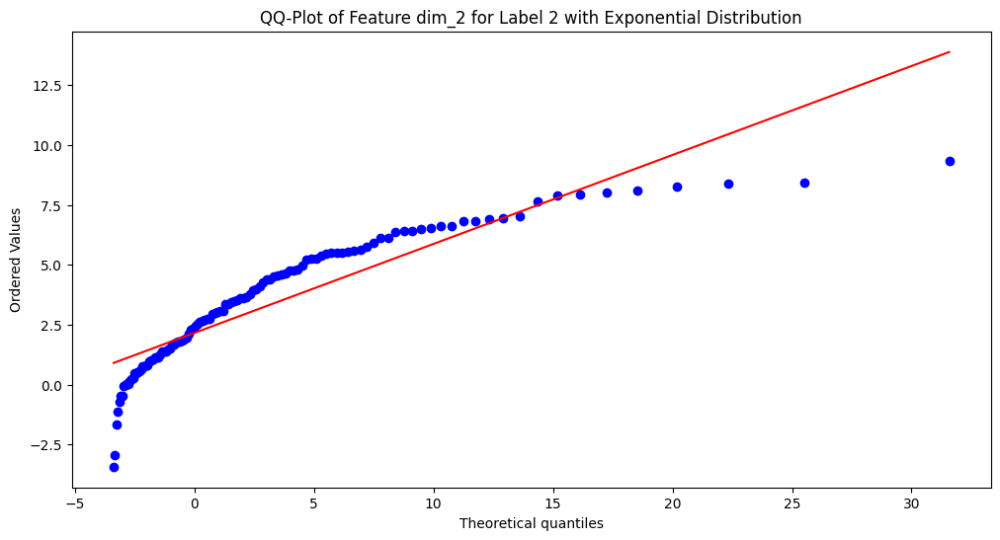

KS-test for Exponential distribution (Feature dim_2, Label 2): Statistic = 0.32848857454403674, p-value = 9.546376525916611e-12
Data does not follow an Exponential distribution (Feature dim_2, Label 2).


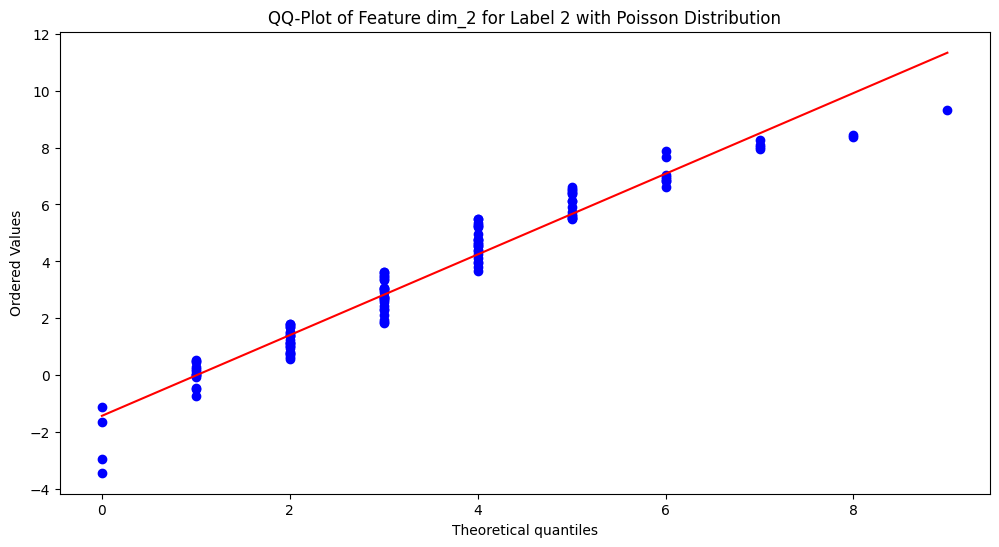

KS-test for Poisson distribution (Feature dim_2, Label 2): Statistic = 0.22023100637125798, p-value = 1.8300123035416153e-05
Data does not follow a Poisson distribution (Feature dim_2, Label 2).


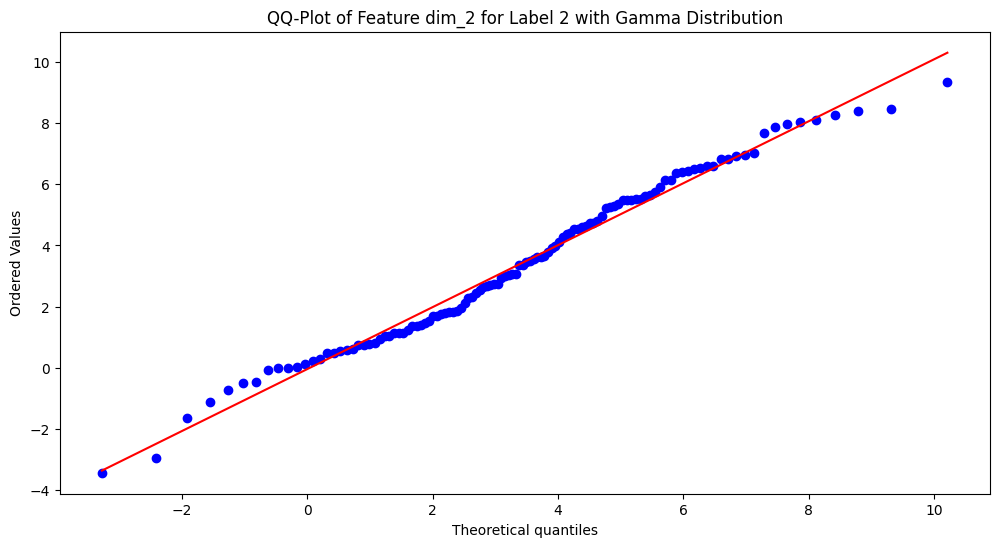

KS-test for Gamma distribution (Feature dim_2, Label 2): Statistic = 0.07325025190007906, p-value = 0.5324545840080586
Data seems to follow a Gamma distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 4345.958465859164, Location = -173.32605448865897, Scale = 0.04066338188126781


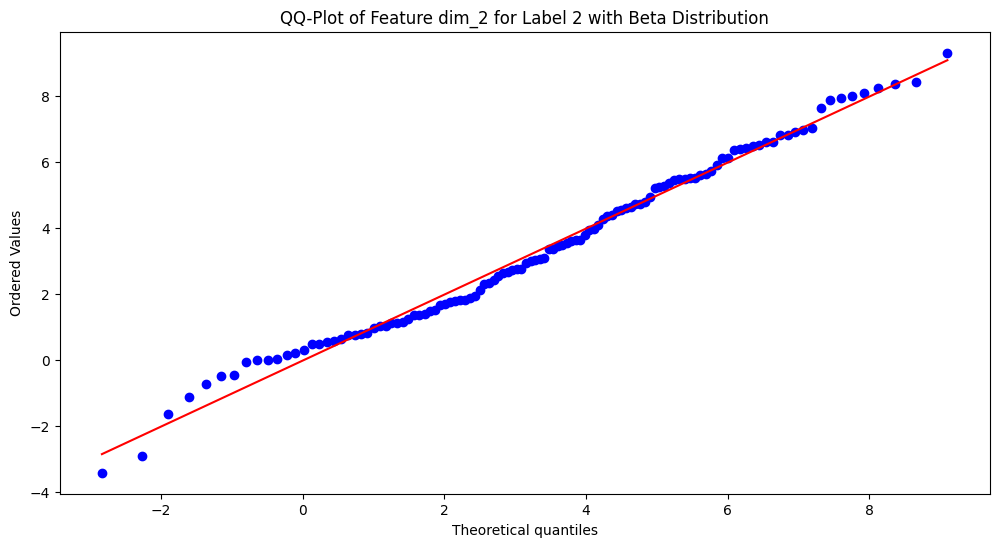

KS-test for Beta distribution (Feature dim_2, Label 2): Statistic = 0.06332230142556683, p-value = 0.7118365733060299
Data seems to follow a Beta distribution (Feature dim_2, Label 2).
Estimated parameters: a = 3.70432395450925, b = 3.1470474648209823, Location = -4.759934234548748, Scale = 15.108668594619523


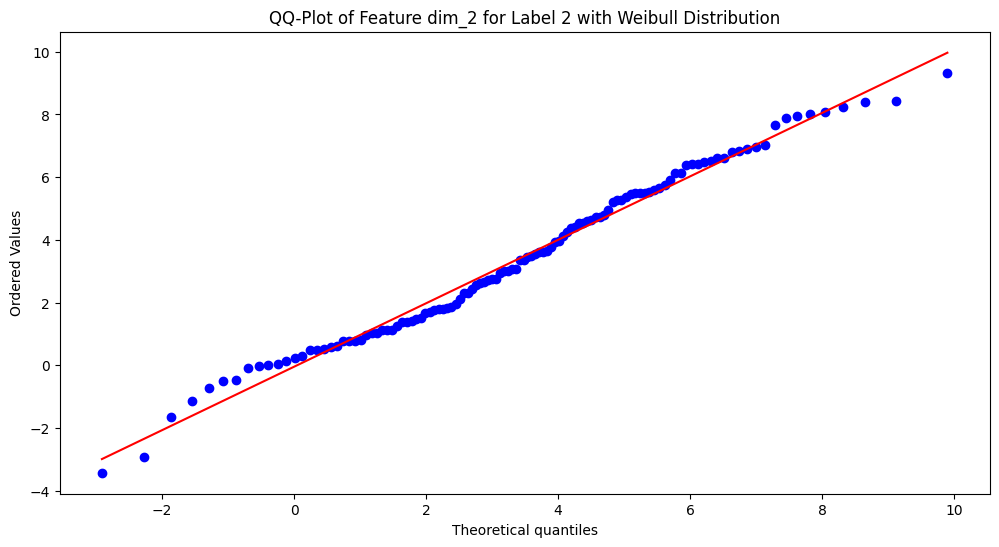

KS-test for Weibull distribution (Feature dim_2, Label 2): Statistic = 0.0697357910418065, p-value = 0.5950784253924093
Data seems to follow a Weibull distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 3.557673716731636, Location = -5.163516356951353, Scale = 9.512671251391293
Analyzing dataset: Test


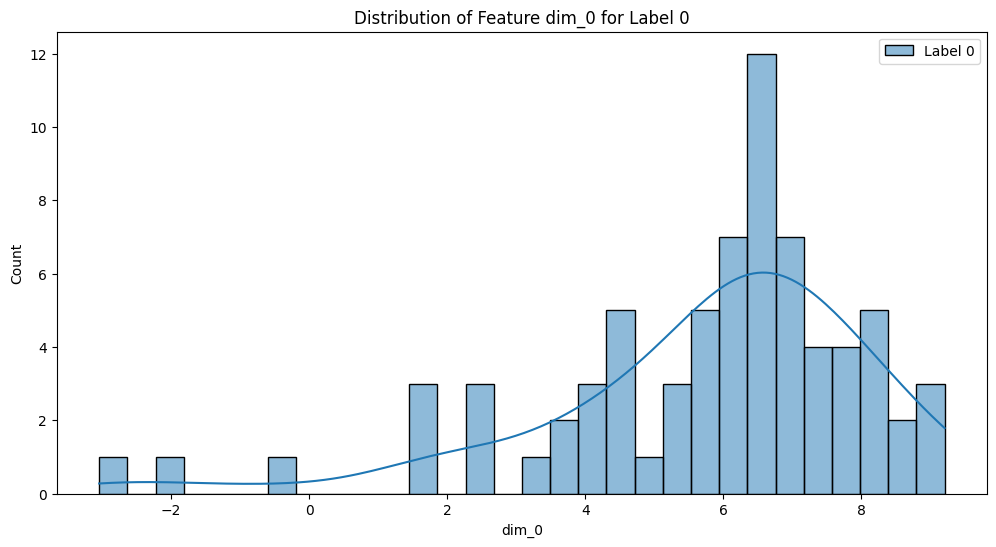

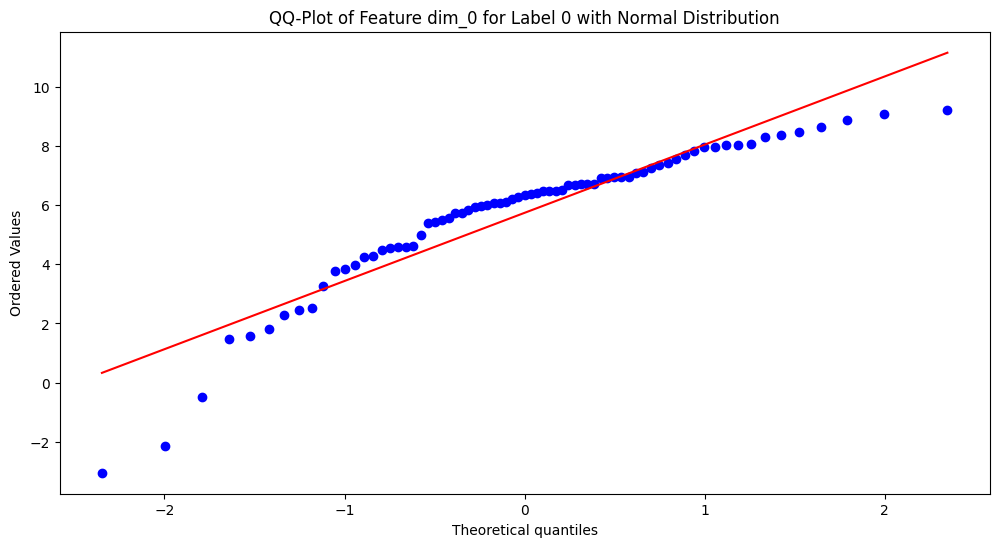

KS-test for Normal distribution (Feature dim_0, Label 0): Statistic = 0.15561323834911212, p-value = 0.052075500740049054
Data seems to follow a Normal distribution (Feature dim_0, Label 0).
Estimated parameters: Mean = 5.736197246264105, Std = 2.408364641305638


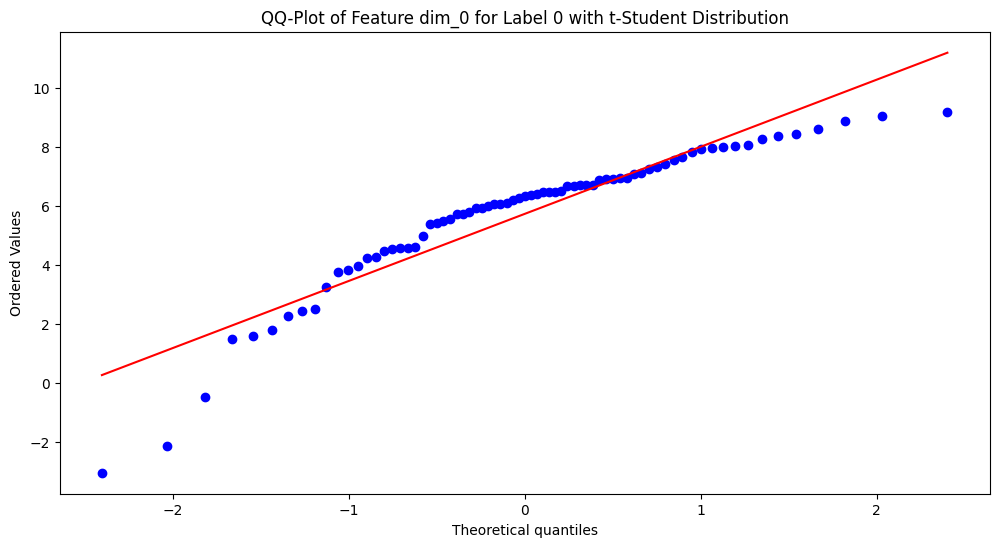

KS-test for t-Student distribution (Feature dim_0, Label 0): Statistic = 0.09702231872171313, p-value = 0.46874444372473867
Data seems to follow a t-Student distribution (Feature dim_0, Label 0).
Estimated parameters: Shape = 2.7063101781933163, Location = 6.259434711690584, Scale = 1.4837255895691301


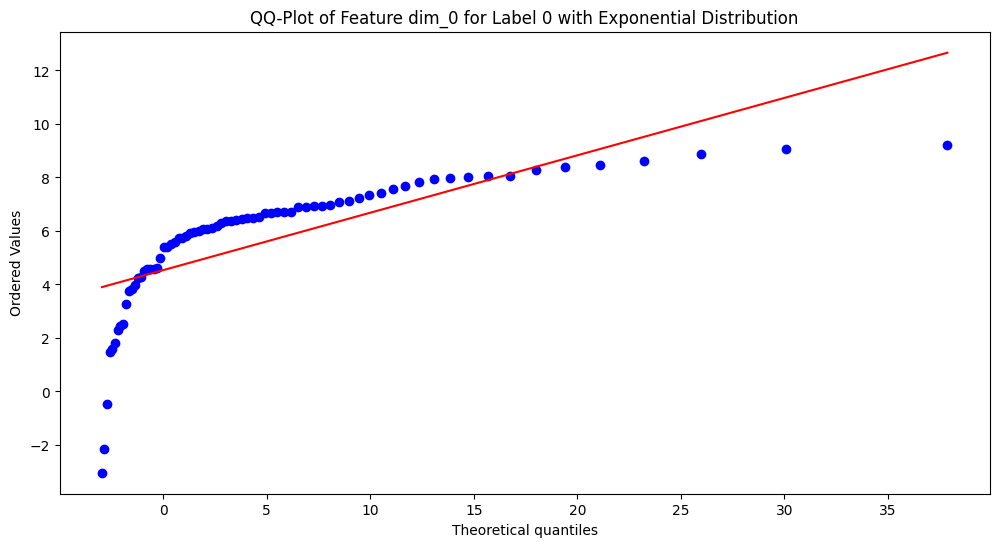

KS-test for Exponential distribution (Feature dim_0, Label 0): Statistic = 0.4024009564422065, p-value = 3.470450976454812e-11
Data does not follow an Exponential distribution (Feature dim_0, Label 0).


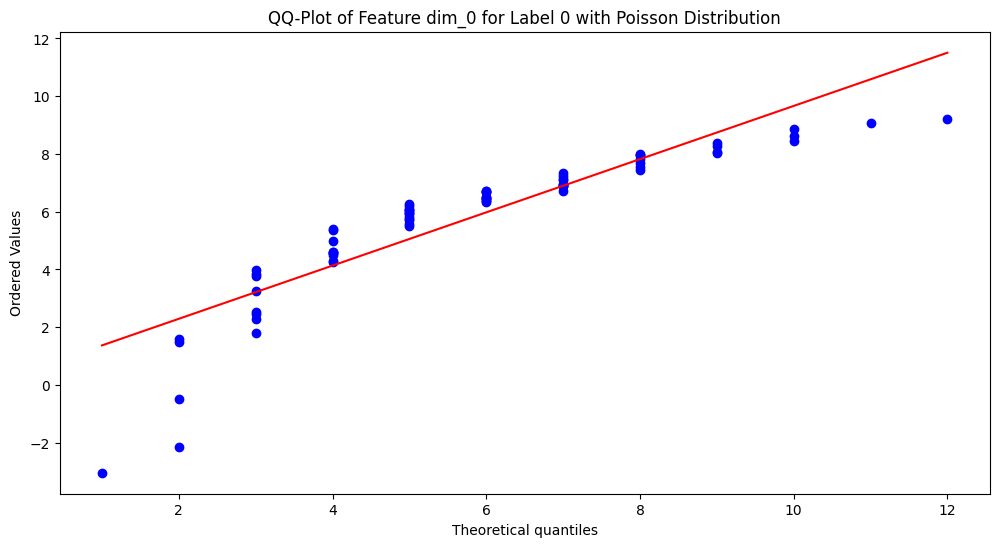

KS-test for Poisson distribution (Feature dim_0, Label 0): Statistic = 0.22393446374400222, p-value = 0.0010694754077871127
Data does not follow a Poisson distribution (Feature dim_0, Label 0).


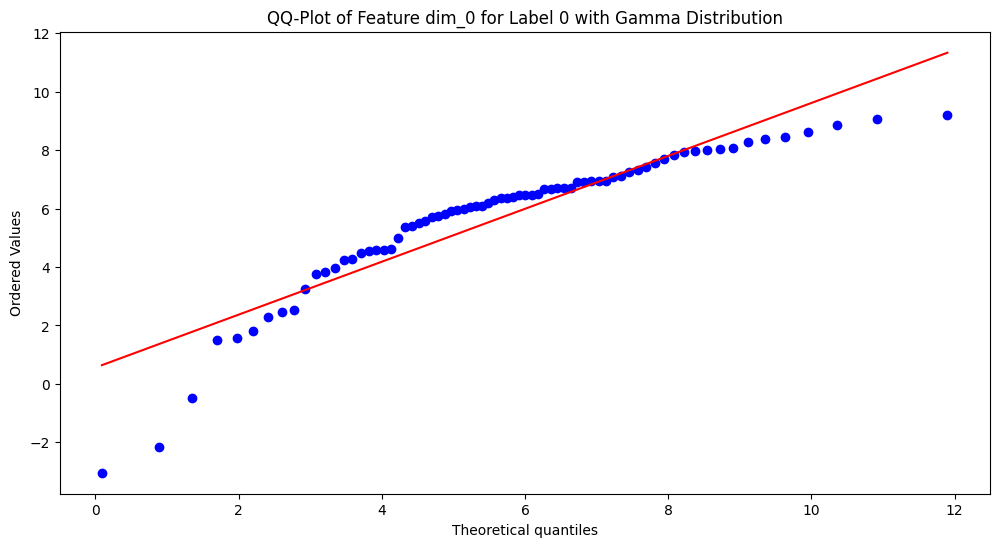

KS-test for Gamma distribution (Feature dim_0, Label 0): Statistic = 0.16839427087985714, p-value = 0.028051993852948705
Data does not follow a Gamma distribution (Feature dim_0, Label 0).


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


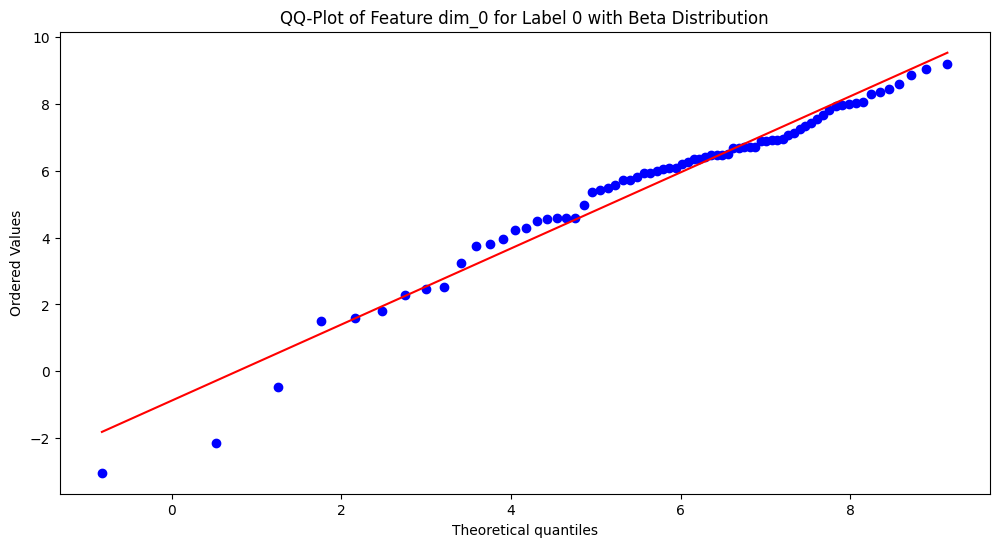

KS-test for Beta distribution (Feature dim_0, Label 0): Statistic = 0.07682613633343138, p-value = 0.7528112343037926
Data seems to follow a Beta distribution (Feature dim_0, Label 0).
Estimated parameters: a = 908860.6611259475, b = 3.707056236878665, Location = -1011330.8590705842, Scale = 1011340.7729264328


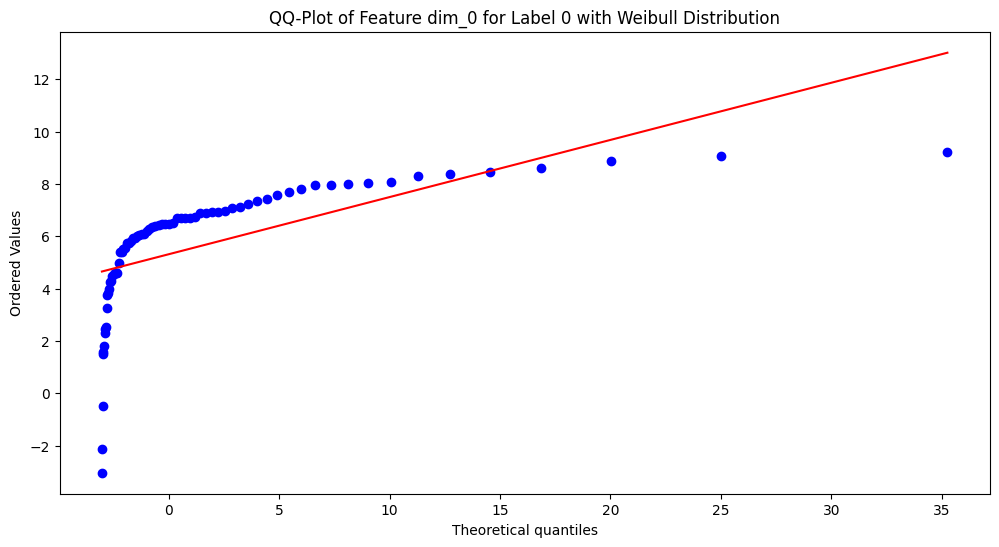

KS-test for Weibull distribution (Feature dim_0, Label 0): Statistic = 0.628094683876555, p-value = 2.173689546609357e-28
Data does not follow a Weibull distribution (Feature dim_0, Label 0).


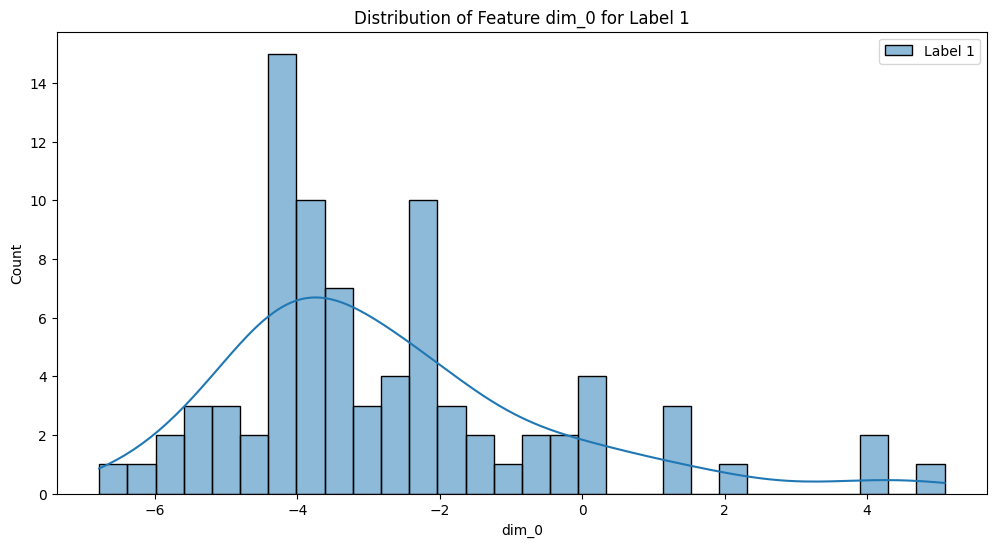

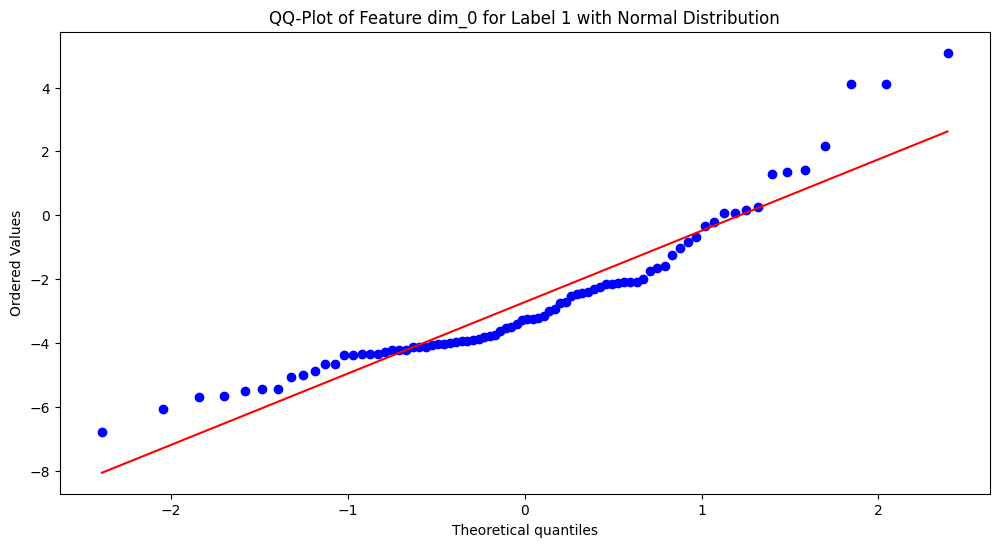

KS-test for Normal distribution (Feature dim_0, Label 1): Statistic = 0.13685689795500222, p-value = 0.0841836519854341
Data seems to follow a Normal distribution (Feature dim_0, Label 1).
Estimated parameters: Mean = -2.720866068107326, Std = 2.3139597649326764


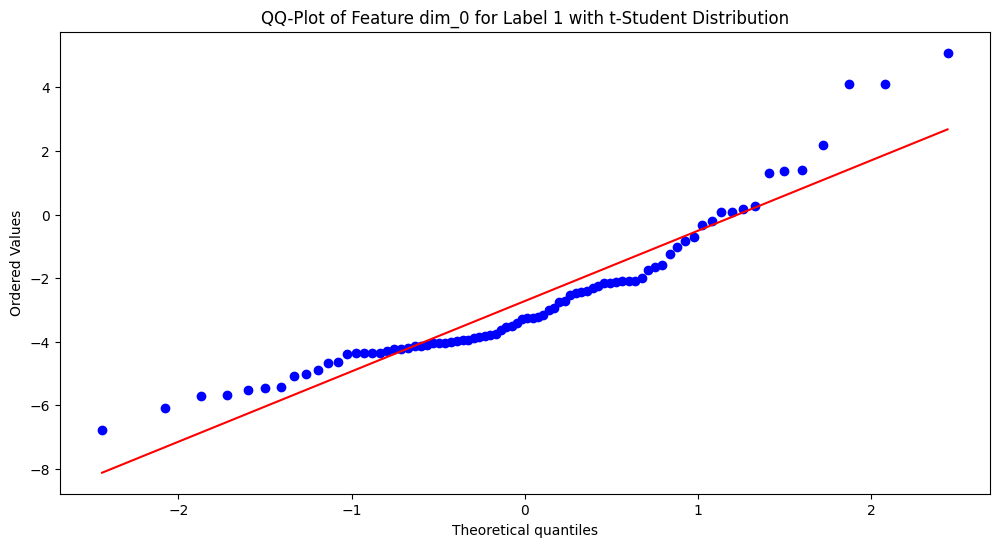

KS-test for t-Student distribution (Feature dim_0, Label 1): Statistic = 0.10189216571219578, p-value = 0.33905120043083575
Data seems to follow a t-Student distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 3.266778486863469, Location = -3.1717648830925267, Scale = 1.578610934114315


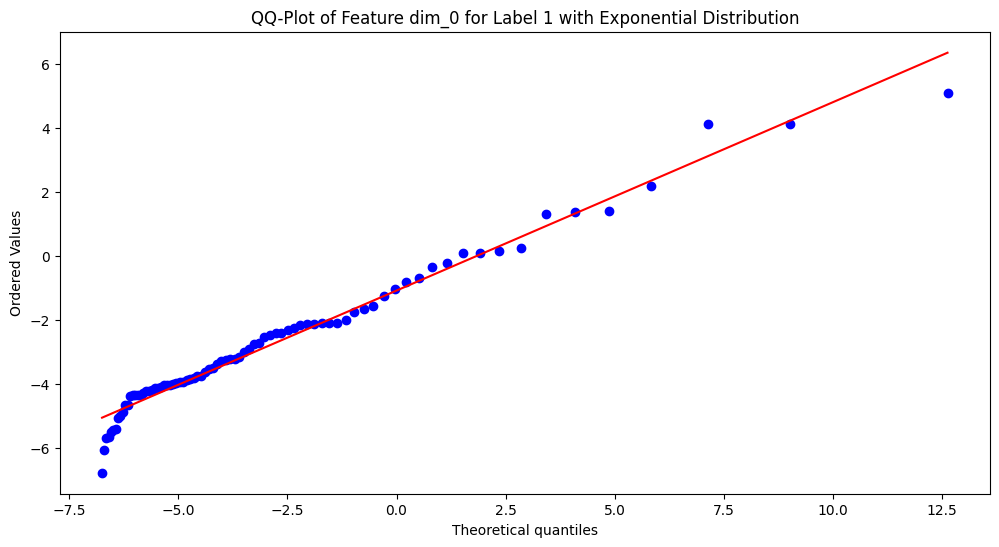

KS-test for Exponential distribution (Feature dim_0, Label 1): Statistic = 0.300696003465465, p-value = 4.5080083388322983e-07
Data does not follow an Exponential distribution (Feature dim_0, Label 1).


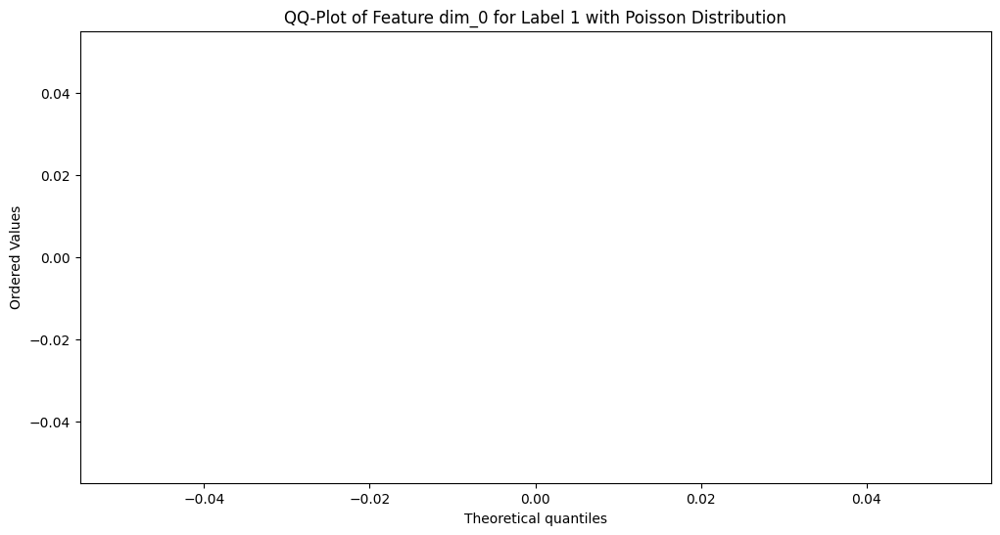

KS-test for Poisson distribution (Feature dim_0, Label 1): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_0, Label 1).


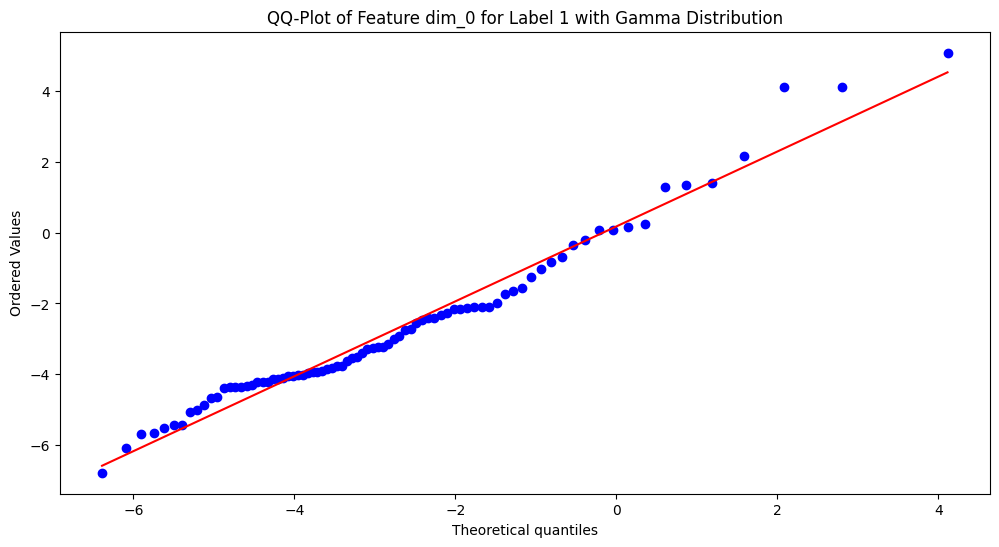

KS-test for Gamma distribution (Feature dim_0, Label 1): Statistic = 0.09589769242504254, p-value = 0.4119815051880247
Data seems to follow a Gamma distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 4.593903150183735, Location = -7.458995322271331, Scale = 1.031393083502196


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


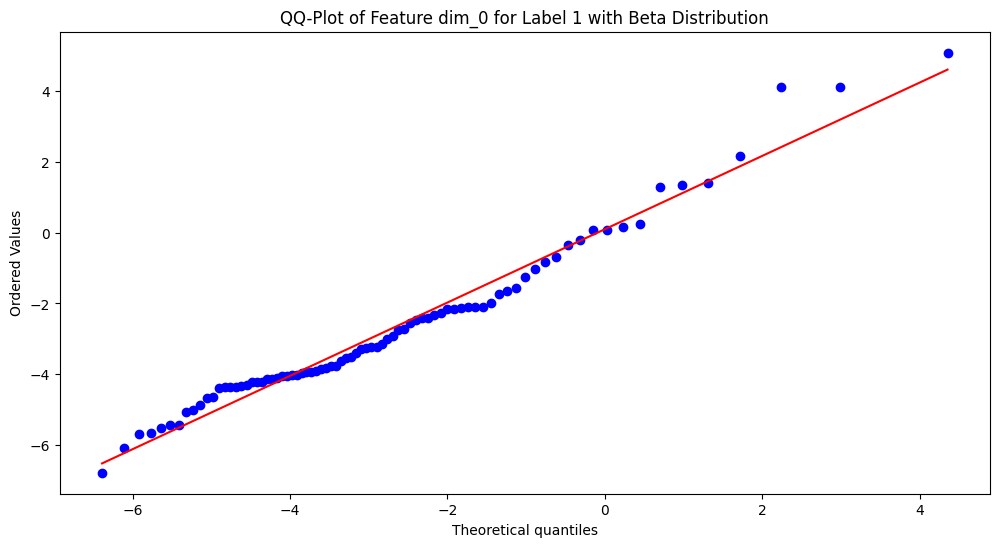

KS-test for Beta distribution (Feature dim_0, Label 1): Statistic = 0.10021746547337854, p-value = 0.35852193798082205
Data seems to follow a Beta distribution (Feature dim_0, Label 1).
Estimated parameters: a = 4.2229301835835695, b = 118613899.40642452, Location = -7.350970497268474, Scale = 130512169.43413162


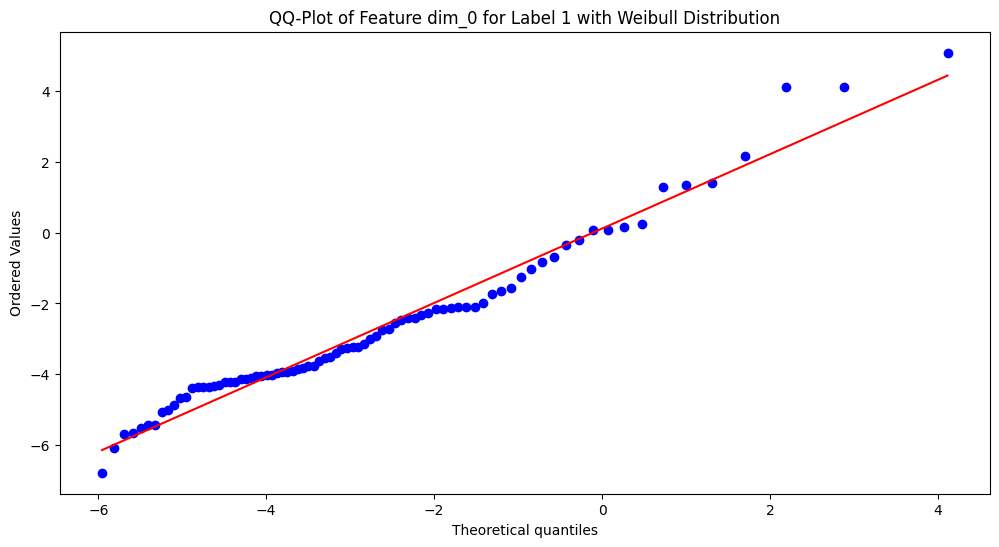

KS-test for Weibull distribution (Feature dim_0, Label 1): Statistic = 0.10287002499278267, p-value = 0.3280134157643784
Data seems to follow a Weibull distribution (Feature dim_0, Label 1).
Estimated parameters: Shape = 1.6029868996211025, Location = -6.152263910934929, Scale = 3.870299606279231


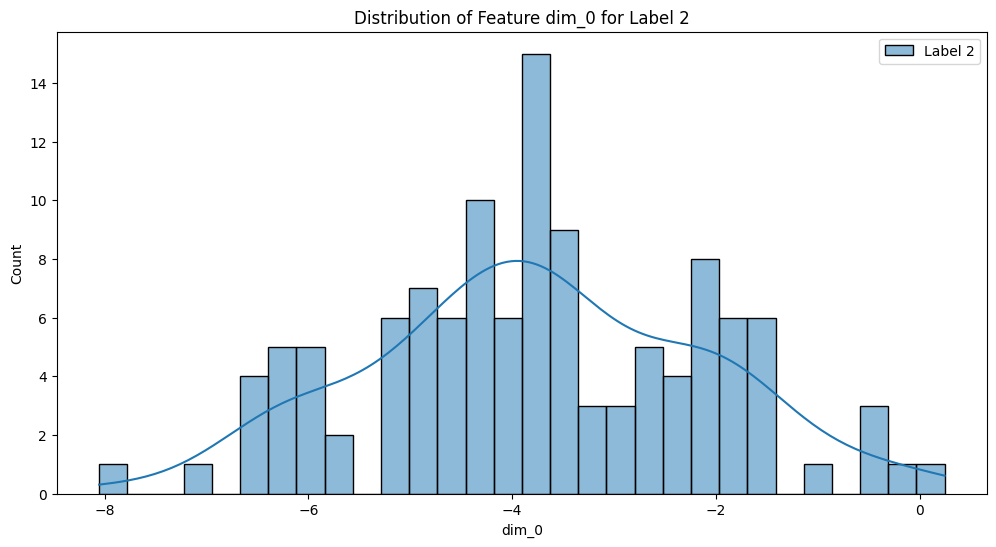

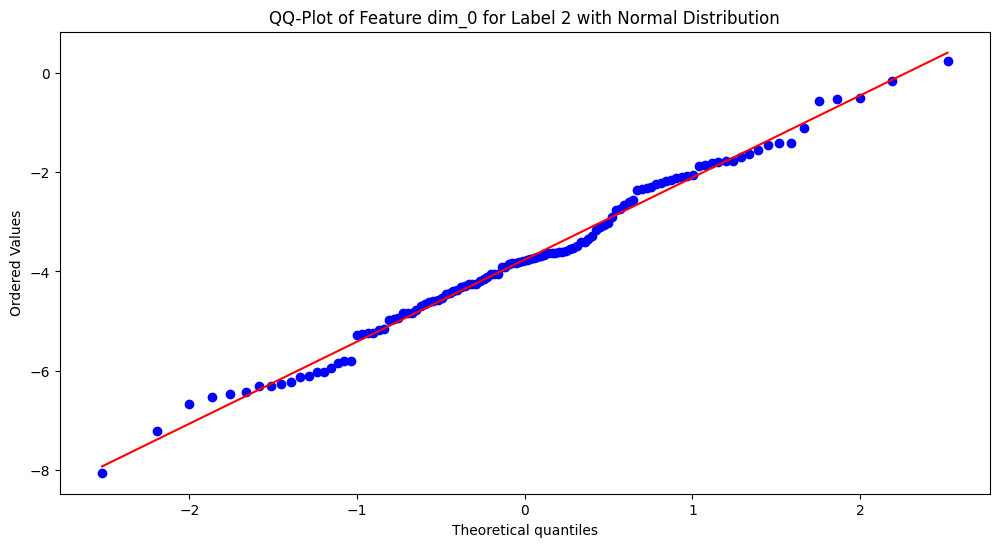

KS-test for Normal distribution (Feature dim_0, Label 2): Statistic = 0.06182580029326312, p-value = 0.734034941056028
Data seems to follow a Normal distribution (Feature dim_0, Label 2).
Estimated parameters: Mean = -3.7602166716577643, Std = 1.6372504496998608


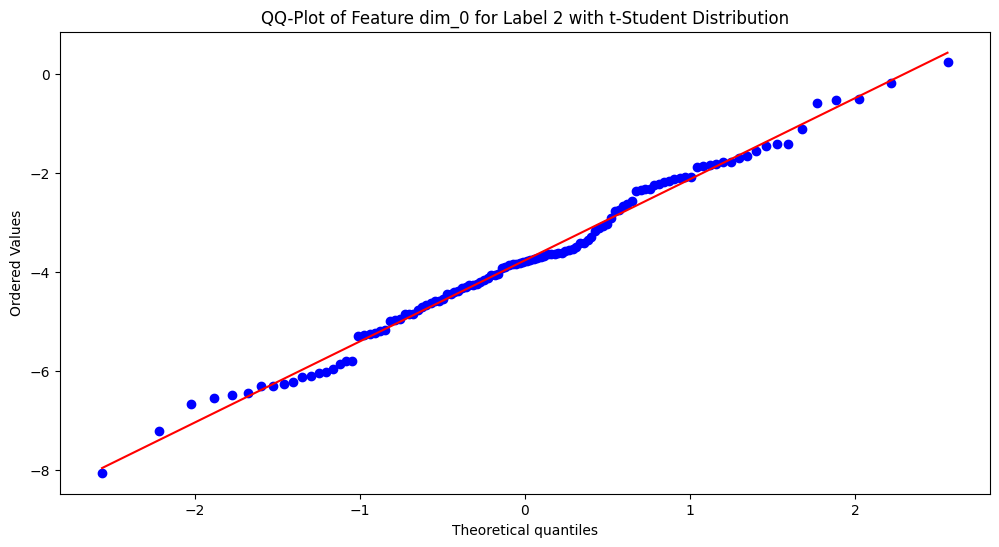

KS-test for t-Student distribution (Feature dim_0, Label 2): Statistic = 0.06158498568692117, p-value = 0.7383346062795878
Data seems to follow a t-Student distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 3365026192.180588, Location = -3.760217620162704, Scale = 1.6302998027761166


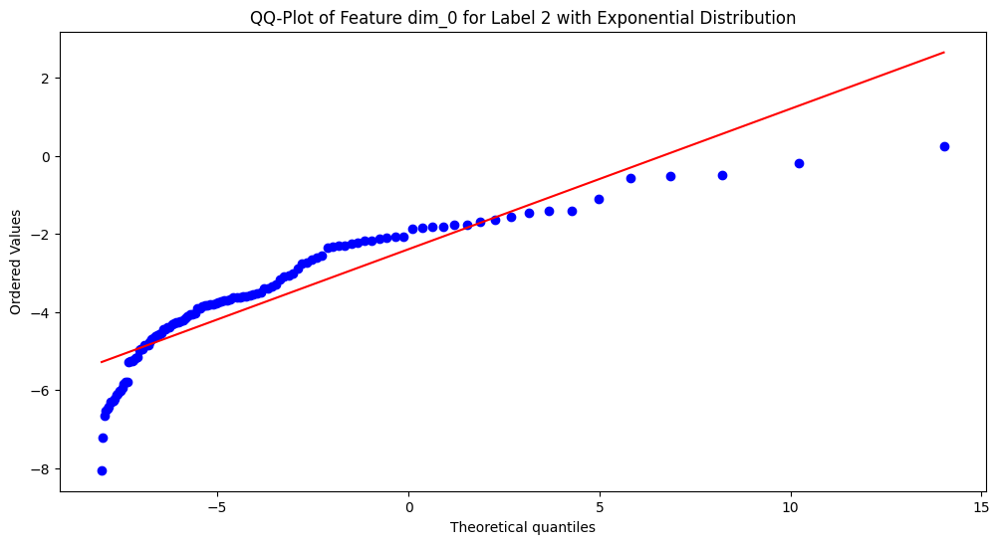

KS-test for Exponential distribution (Feature dim_0, Label 2): Statistic = 0.3230959439755847, p-value = 1.8340182600585828e-11
Data does not follow an Exponential distribution (Feature dim_0, Label 2).


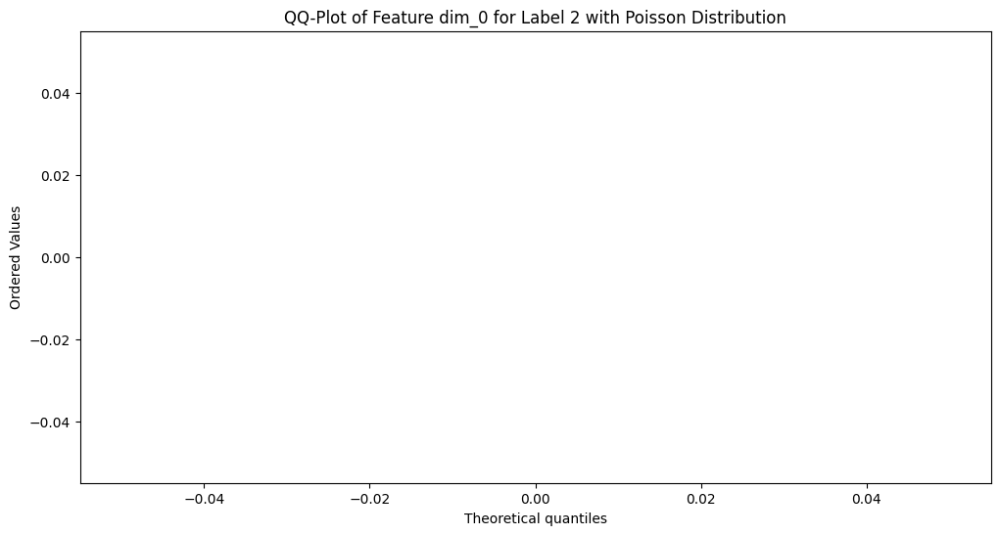

KS-test for Poisson distribution (Feature dim_0, Label 2): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_0, Label 2).


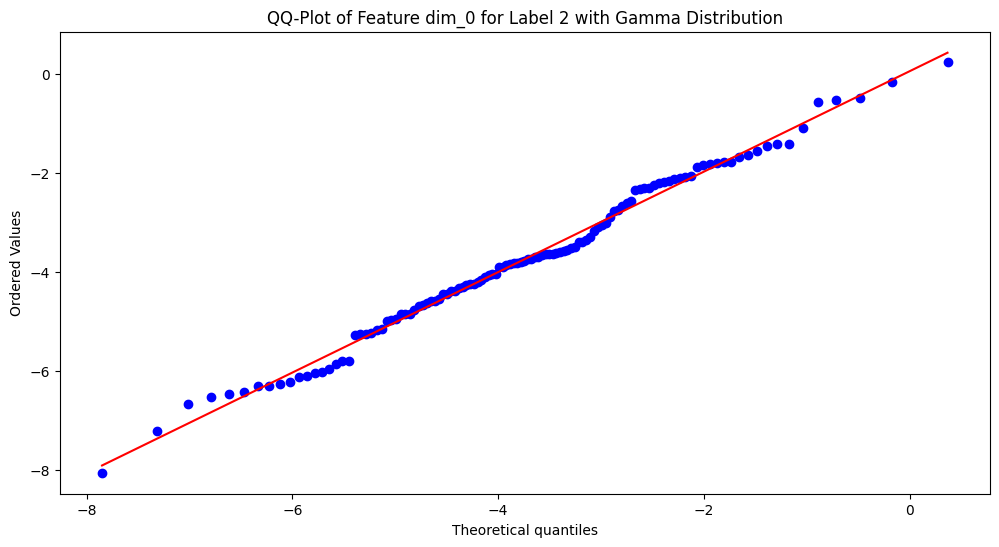

KS-test for Gamma distribution (Feature dim_0, Label 2): Statistic = 0.060750625554572446, p-value = 0.7531236960608721
Data seems to follow a Gamma distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 24086.920658936026, Location = -256.77968125460757, Scale = 0.01050443243519443


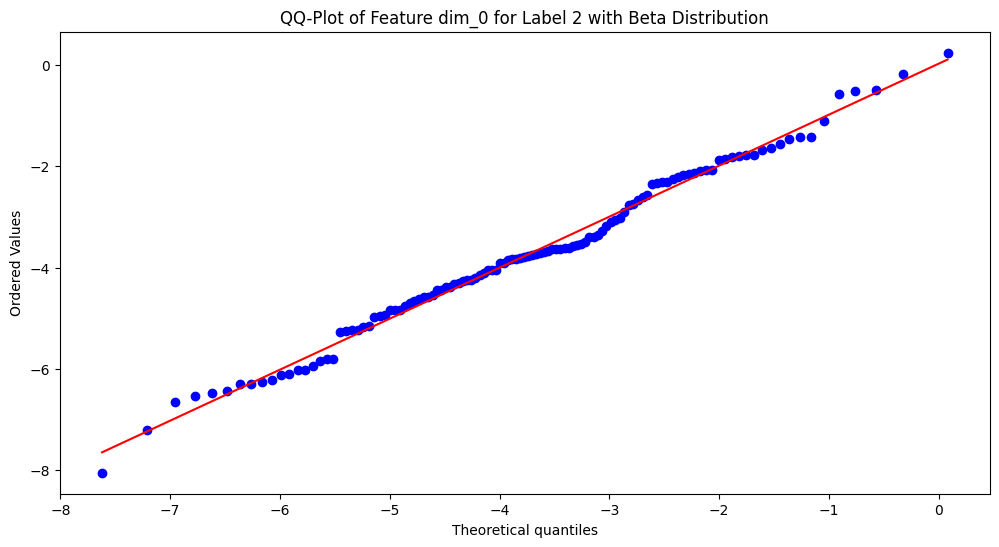

KS-test for Beta distribution (Feature dim_0, Label 2): Statistic = 0.06573523599060294, p-value = 0.6629752475889688
Data seems to follow a Beta distribution (Feature dim_0, Label 2).
Estimated parameters: a = 6.542872785437472, b = 6.45394697756765, Location = -9.905302021839464, Scale = 12.207793999193315


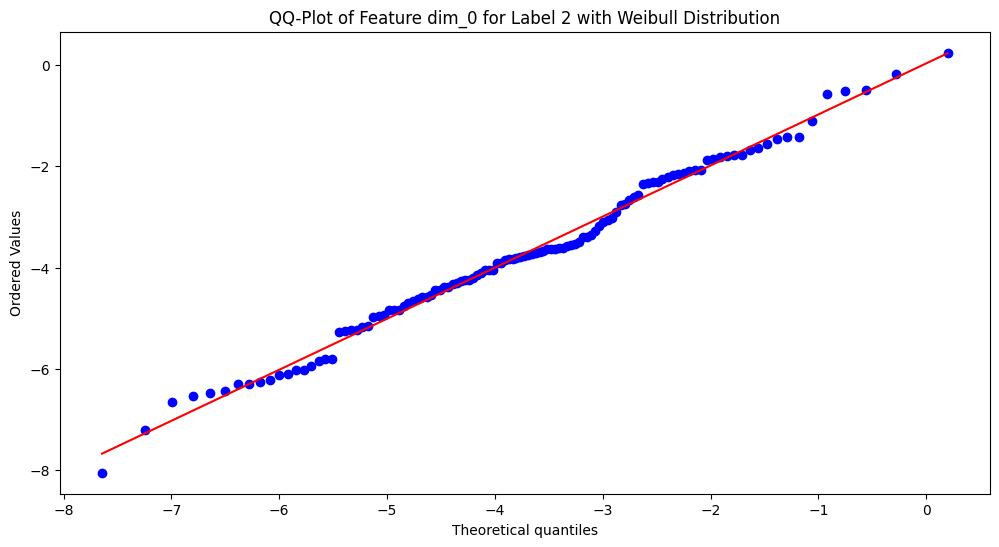

KS-test for Weibull distribution (Feature dim_0, Label 2): Statistic = 0.06687088770748961, p-value = 0.6421328940249009
Data seems to follow a Weibull distribution (Feature dim_0, Label 2).
Estimated parameters: Shape = 3.608151126204662, Location = -9.059393606608197, Scale = 5.880169994479977


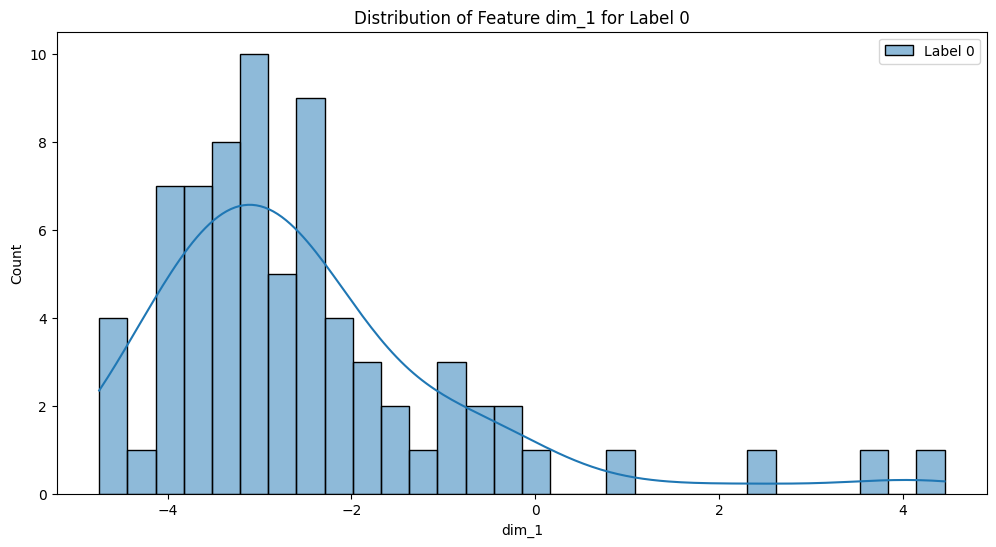

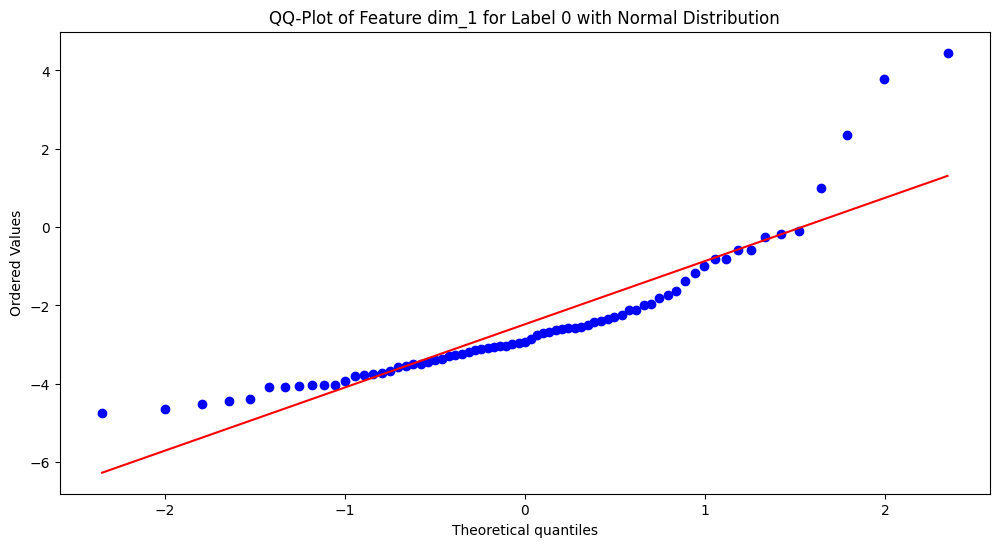

KS-test for Normal distribution (Feature dim_1, Label 0): Statistic = 0.1601933224110329, p-value = 0.04195829693701949
Data does not follow a Normal distribution (Feature dim_1, Label 0).


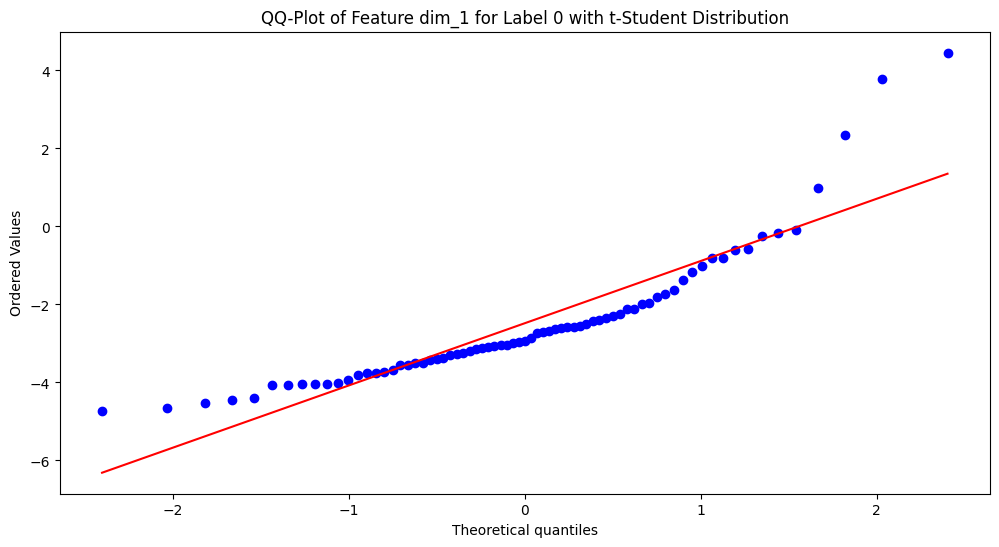

KS-test for t-Student distribution (Feature dim_1, Label 0): Statistic = 0.09402894661855088, p-value = 0.5086374637180151
Data seems to follow a t-Student distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 2.373664730306805, Location = -2.9033381475453948, Scale = 0.949216692135652


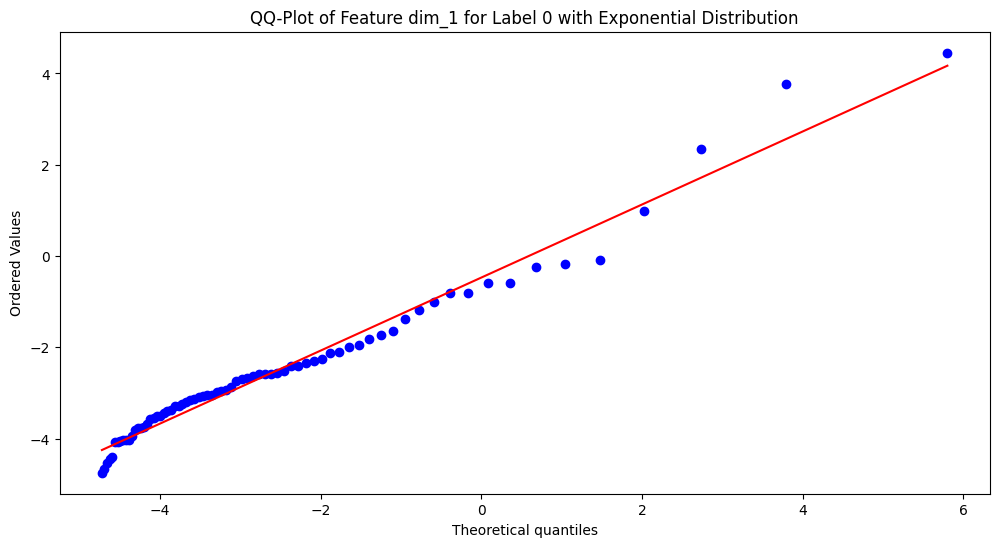

KS-test for Exponential distribution (Feature dim_1, Label 0): Statistic = 0.1876218219656169, p-value = 0.010075733961567666
Data does not follow an Exponential distribution (Feature dim_1, Label 0).


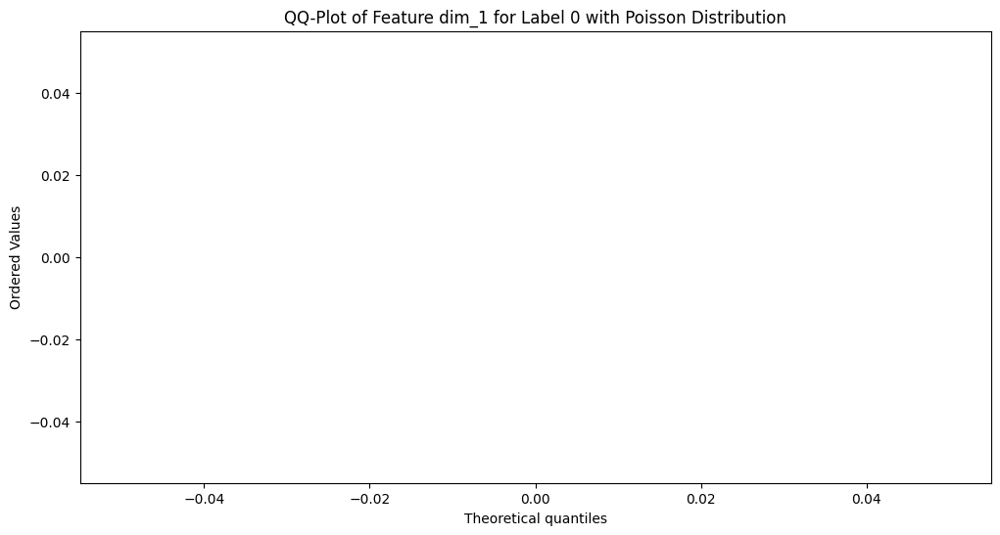

KS-test for Poisson distribution (Feature dim_1, Label 0): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_1, Label 0).


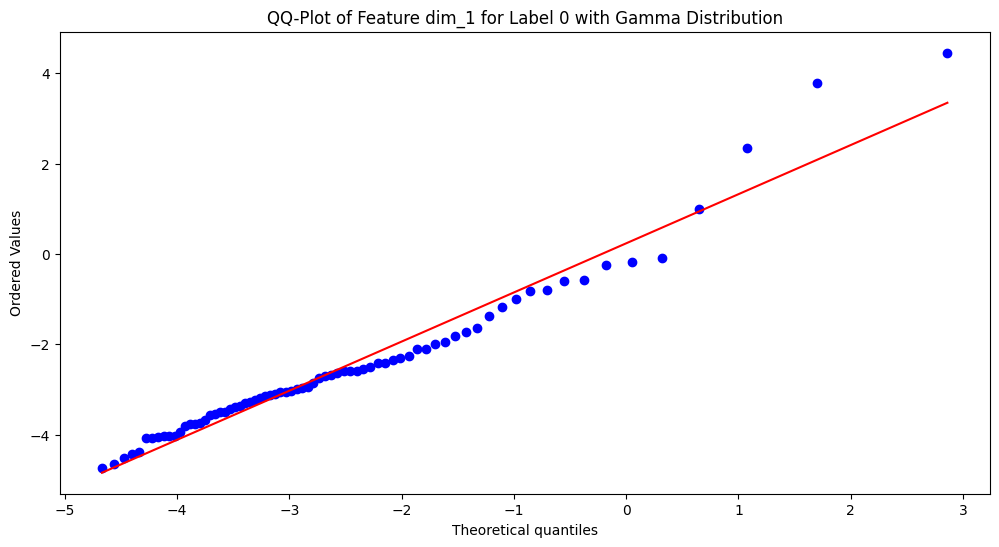

KS-test for Gamma distribution (Feature dim_1, Label 0): Statistic = 0.070633367705496, p-value = 0.8343850910412312
Data seems to follow a Gamma distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 2.16718623530228, Location = -4.872087210141178, Scale = 1.1027205547586507


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:790: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


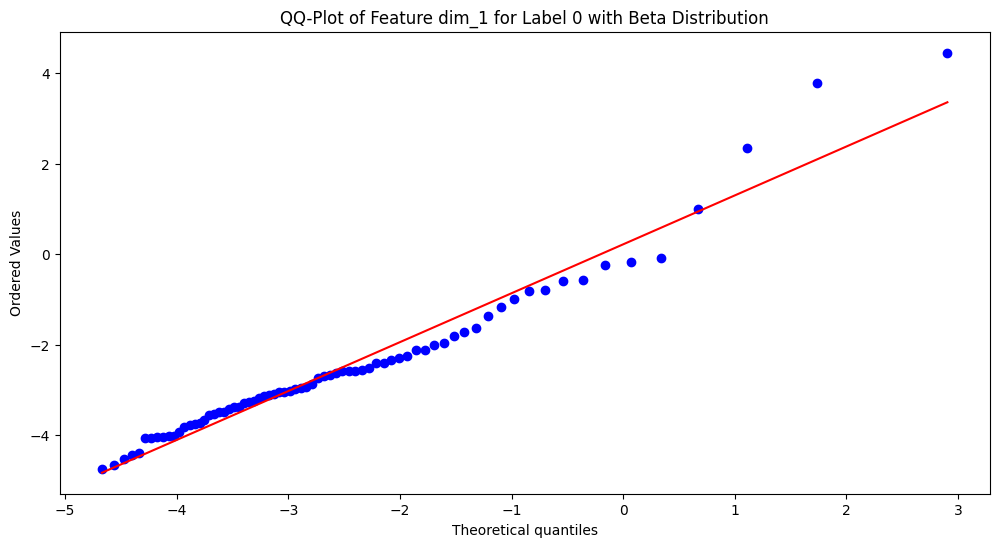

KS-test for Beta distribution (Feature dim_1, Label 0): Statistic = 0.07117419890299537, p-value = 0.8276871238468468
Data seems to follow a Beta distribution (Feature dim_1, Label 0).
Estimated parameters: a = 2.13942686922186, b = 2639994188316.4644, Location = -4.8669396314204185, Scale = 2947218499779.5117


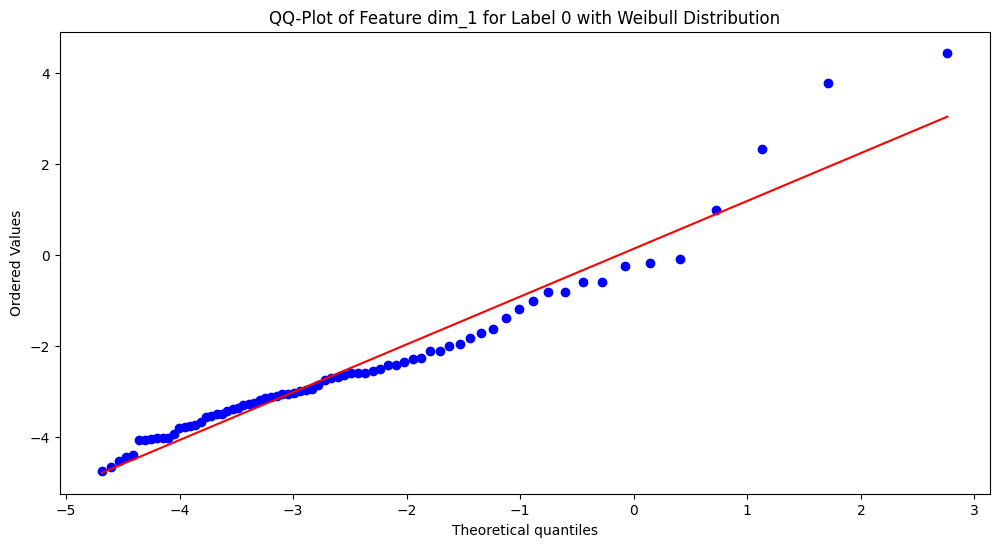

KS-test for Weibull distribution (Feature dim_1, Label 0): Statistic = 0.08340444132336908, p-value = 0.6590736716111598
Data seems to follow a Weibull distribution (Feature dim_1, Label 0).
Estimated parameters: Shape = 1.4064926054510134, Location = -4.7755088884079955, Scale = 2.522749033282642


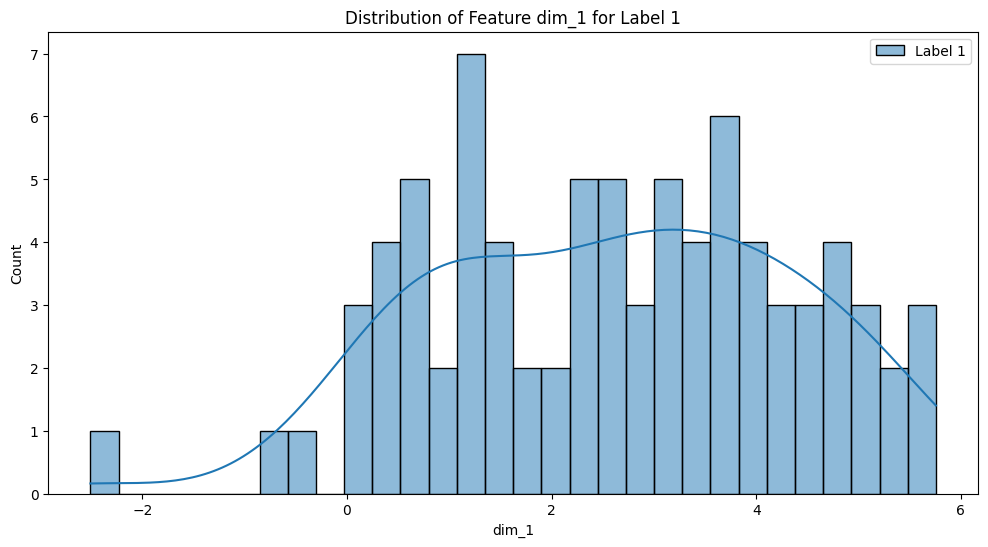

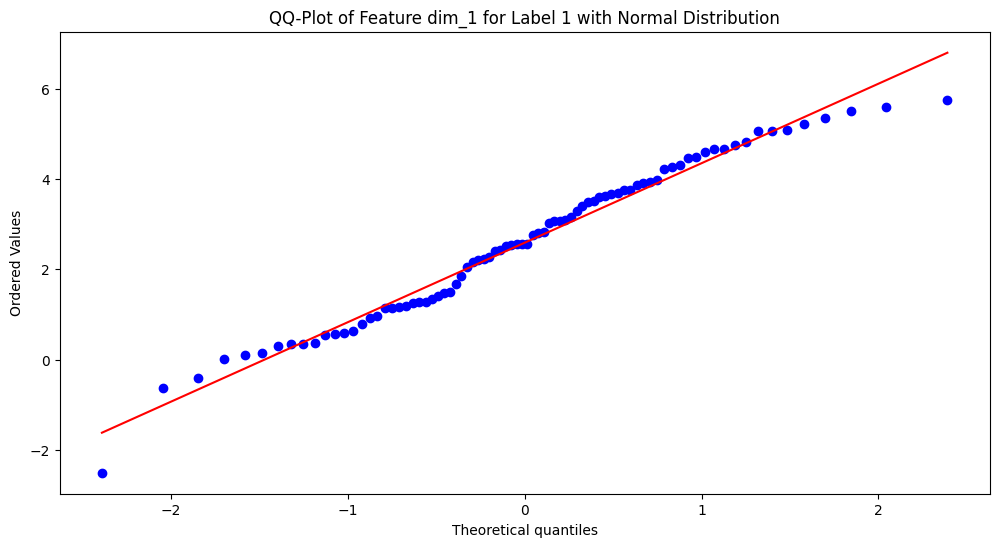

KS-test for Normal distribution (Feature dim_1, Label 1): Statistic = 0.07382843968839431, p-value = 0.7345409616830507
Data seems to follow a Normal distribution (Feature dim_1, Label 1).
Estimated parameters: Mean = 2.587313710643751, Std = 1.7472334959293192


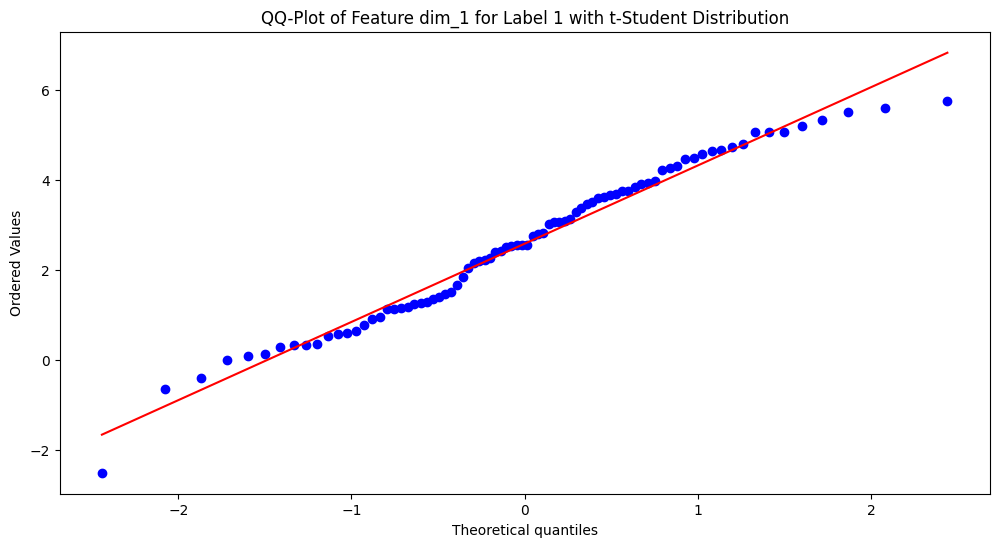

KS-test for t-Student distribution (Feature dim_1, Label 1): Statistic = 0.0750828078450973, p-value = 0.7157257160718629
Data seems to follow a t-Student distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 15403937053.492672, Location = 2.587312942262792, Scale = 1.7365465408418221


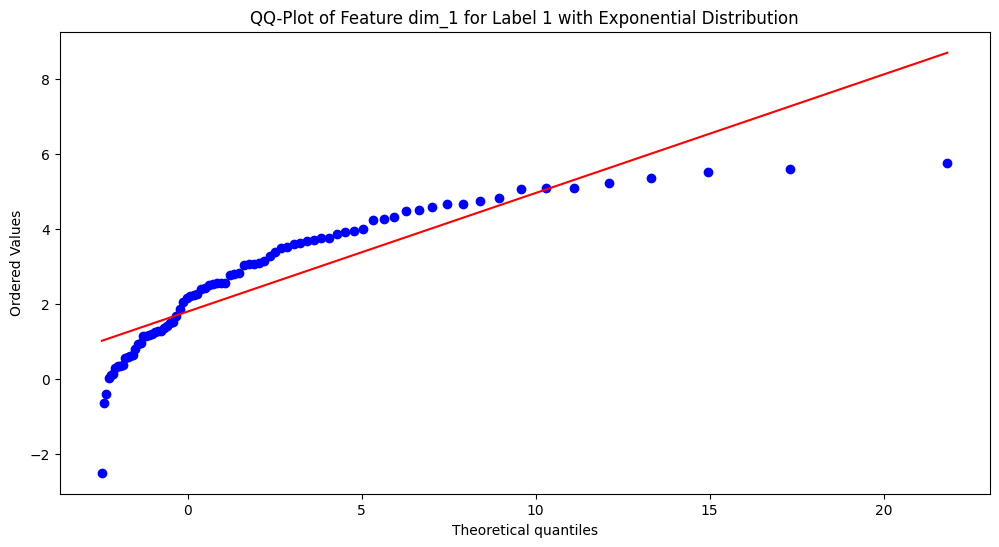

KS-test for Exponential distribution (Feature dim_1, Label 1): Statistic = 0.35343179263878377, p-value = 1.14509578379693e-09
Data does not follow an Exponential distribution (Feature dim_1, Label 1).


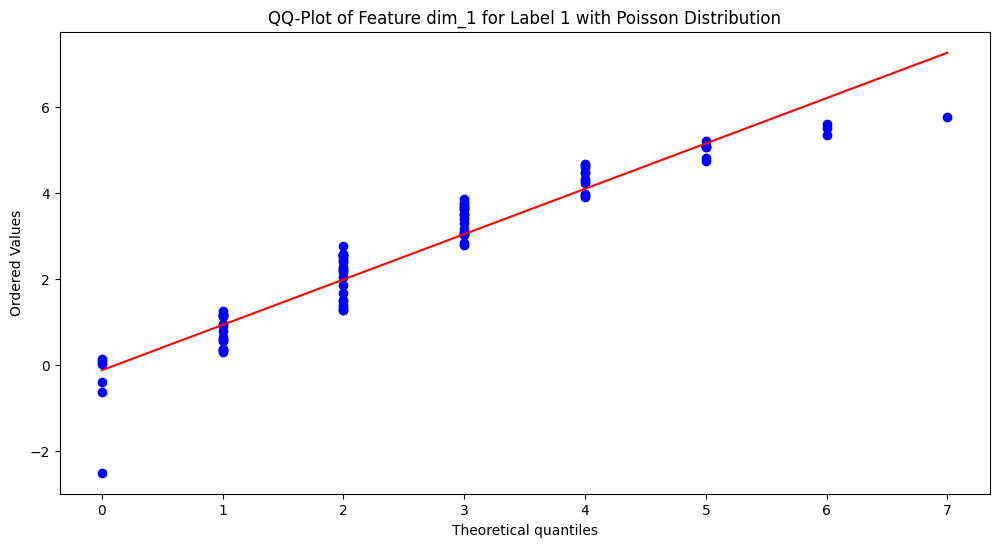

KS-test for Poisson distribution (Feature dim_1, Label 1): Statistic = 0.18997861408439887, p-value = 0.004580844988865505
Data does not follow a Poisson distribution (Feature dim_1, Label 1).


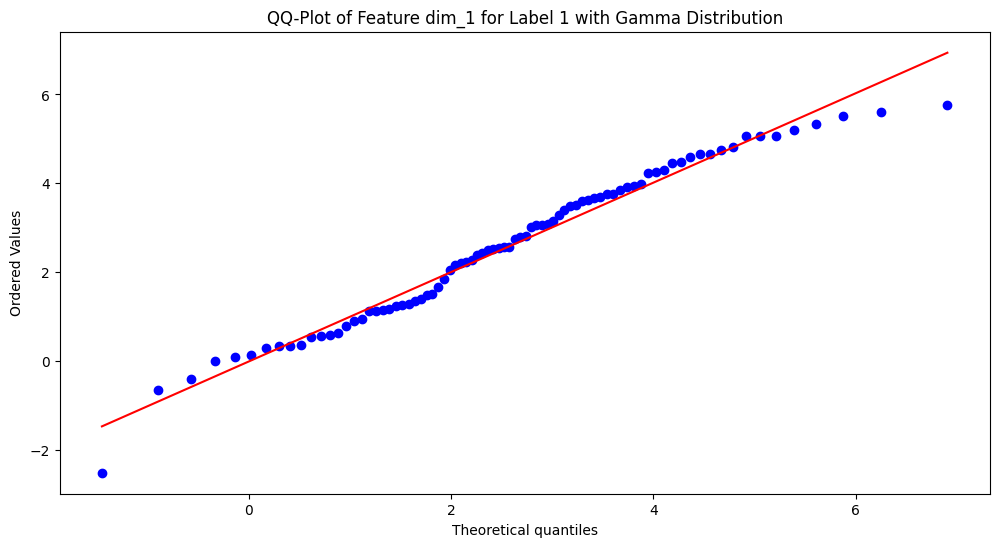

KS-test for Gamma distribution (Feature dim_1, Label 1): Statistic = 0.06900624633565666, p-value = 0.8040852295287674
Data seems to follow a Gamma distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 350.1909413308456, Location = -30.1390865264016, Scale = 0.0934372329832242


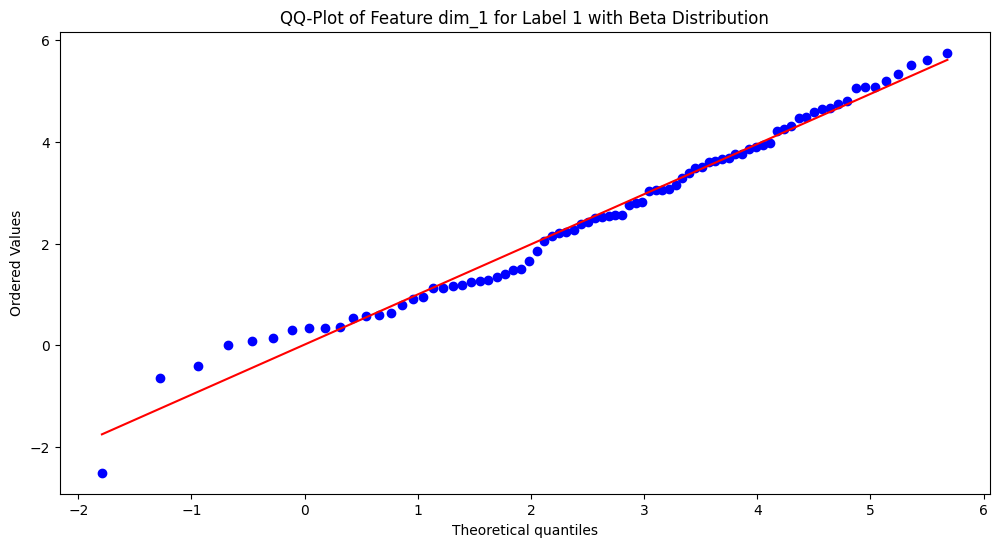

KS-test for Beta distribution (Feature dim_1, Label 1): Statistic = 0.07275295371595442, p-value = 0.7504842902017952
Data seems to follow a Beta distribution (Feature dim_1, Label 1).
Estimated parameters: a = 3.6594336855391103, b = 2.0126025448252536, Location = -3.559296845824615, Scale = 9.553942911124249


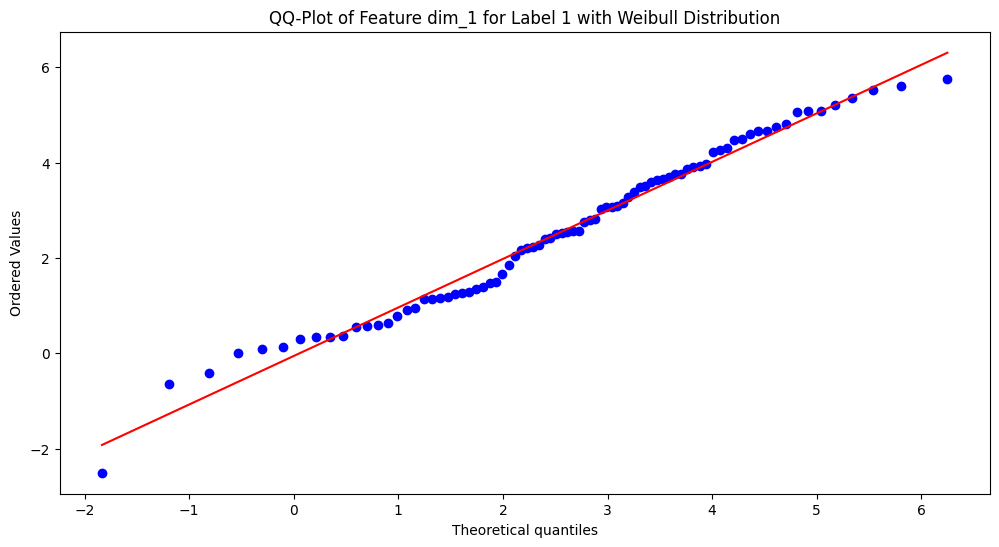

KS-test for Weibull distribution (Feature dim_1, Label 1): Statistic = 0.08482929507017656, p-value = 0.5674514232112864
Data seems to follow a Weibull distribution (Feature dim_1, Label 1).
Estimated parameters: Shape = 5.22737974741654, Location = -5.256716523362893, Scale = 8.530604614640346


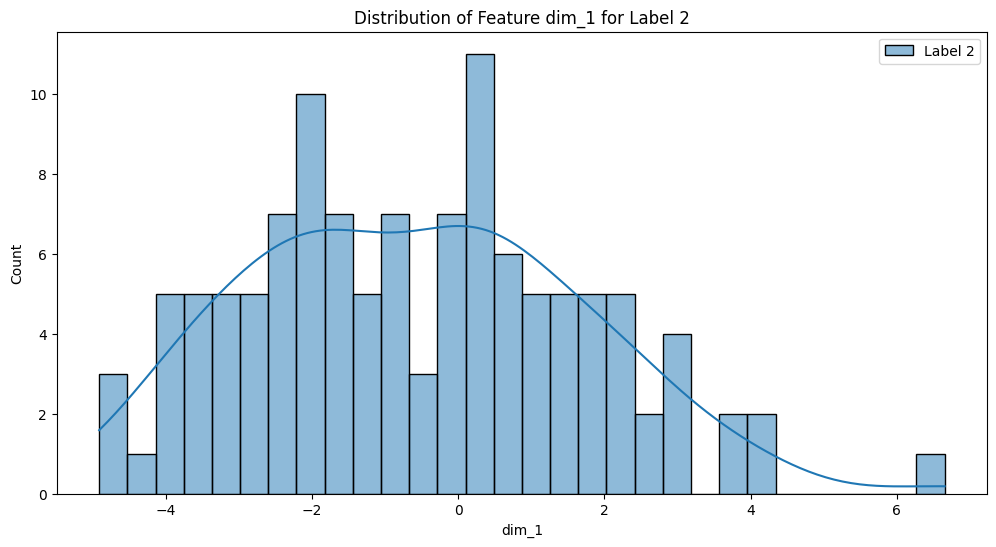

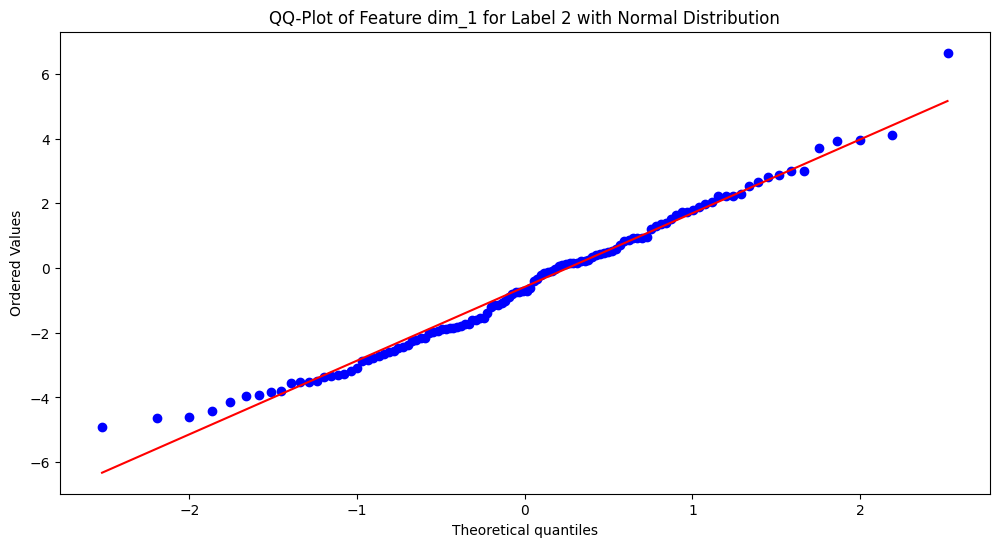

KS-test for Normal distribution (Feature dim_1, Label 2): Statistic = 0.0700399117747621, p-value = 0.5842979303869869
Data seems to follow a Normal distribution (Feature dim_1, Label 2).
Estimated parameters: Mean = -0.5815255111556942, Std = 2.265862075485725


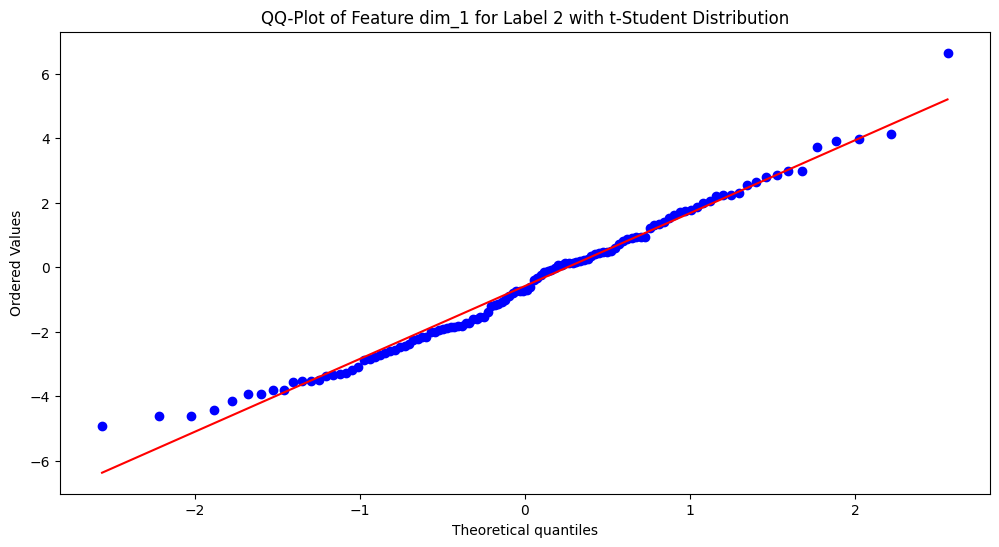

KS-test for t-Student distribution (Feature dim_1, Label 2): Statistic = 0.07069560212339654, p-value = 0.5724679530112474
Data seems to follow a t-Student distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 334282705002.7353, Location = -0.5815255978500553, Scale = 2.2562407865093865


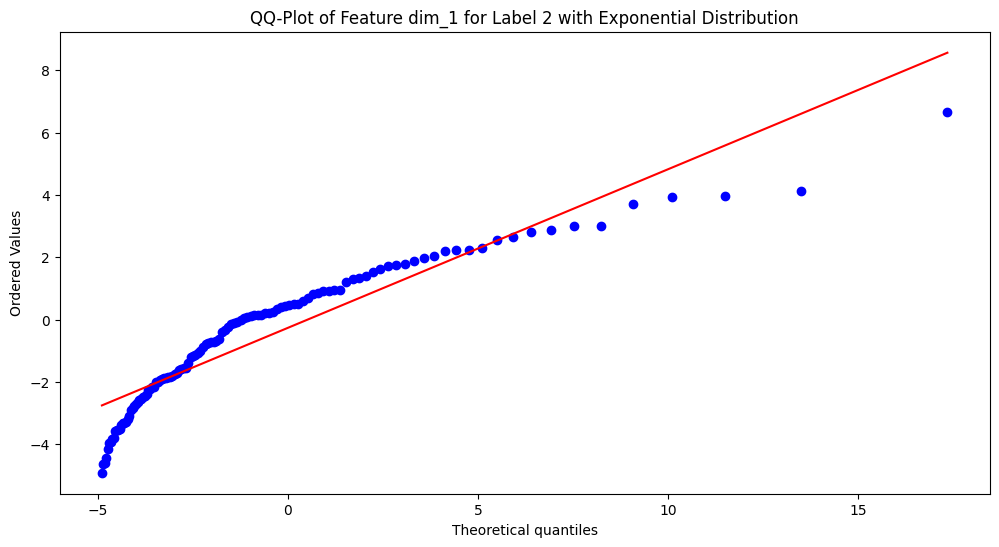

KS-test for Exponential distribution (Feature dim_1, Label 2): Statistic = 0.21281750585855555, p-value = 3.6109166234290665e-05
Data does not follow an Exponential distribution (Feature dim_1, Label 2).


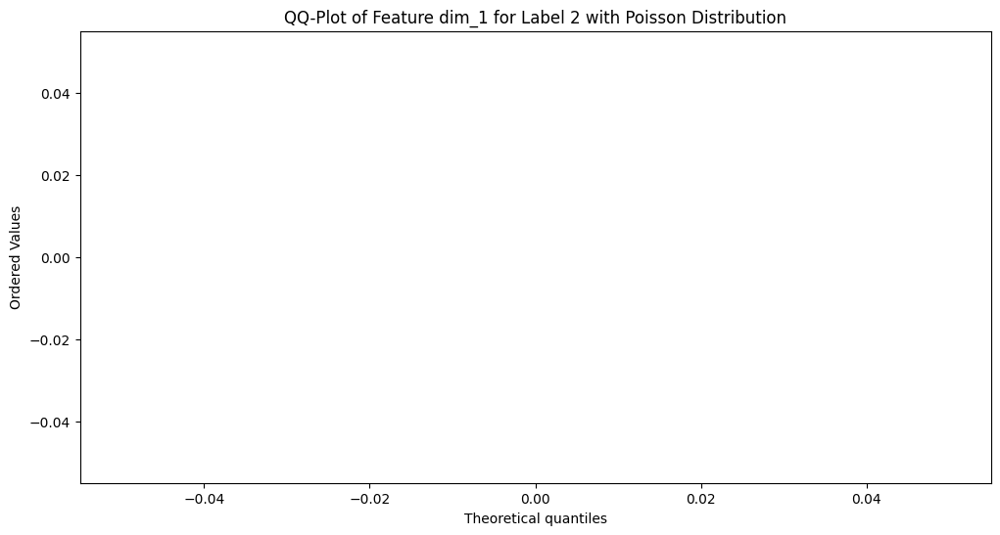

KS-test for Poisson distribution (Feature dim_1, Label 2): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_1, Label 2).


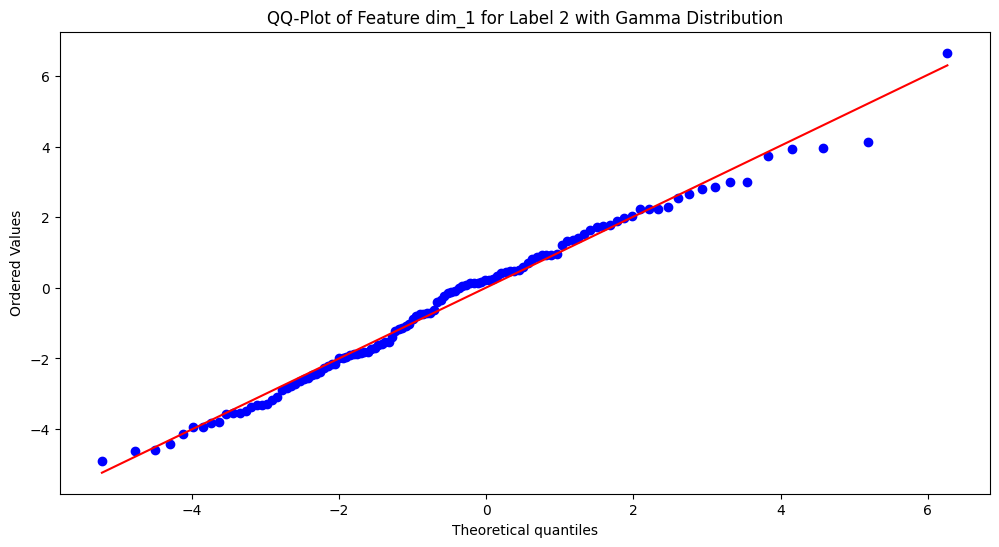

KS-test for Gamma distribution (Feature dim_1, Label 2): Statistic = 0.06705062957530217, p-value = 0.638835124686614
Data seems to follow a Gamma distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 13.419981336370208, Location = -8.939697642468527, Scale = 0.622815509561244


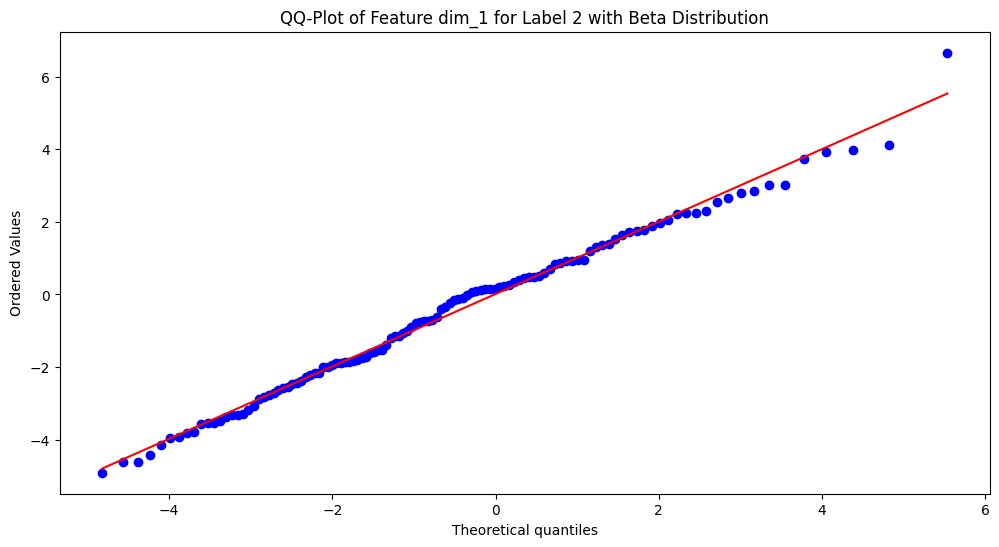

KS-test for Beta distribution (Feature dim_1, Label 2): Statistic = 0.05987657458542228, p-value = 0.7684098764111745
Data seems to follow a Beta distribution (Feature dim_1, Label 2).
Estimated parameters: a = 2.6959967269443235, b = 5.404971992392628, Location = -5.447016142189506, Scale = 14.595411585359583


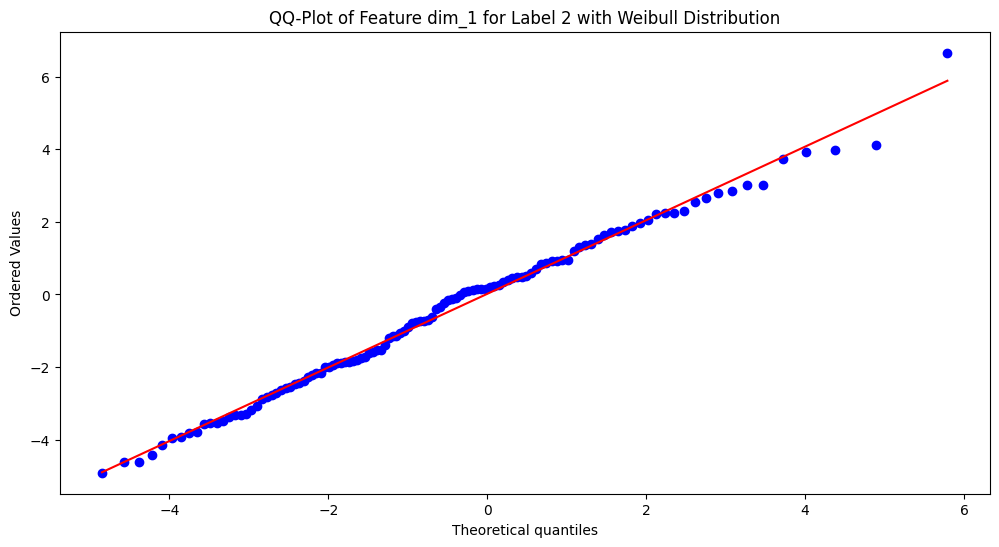

KS-test for Weibull distribution (Feature dim_1, Label 2): Statistic = 0.06035185384609798, p-value = 0.7601261156577954
Data seems to follow a Weibull distribution (Feature dim_1, Label 2).
Estimated parameters: Shape = 2.27600103450376, Location = -5.419032289840338, Scale = 5.460137859670158


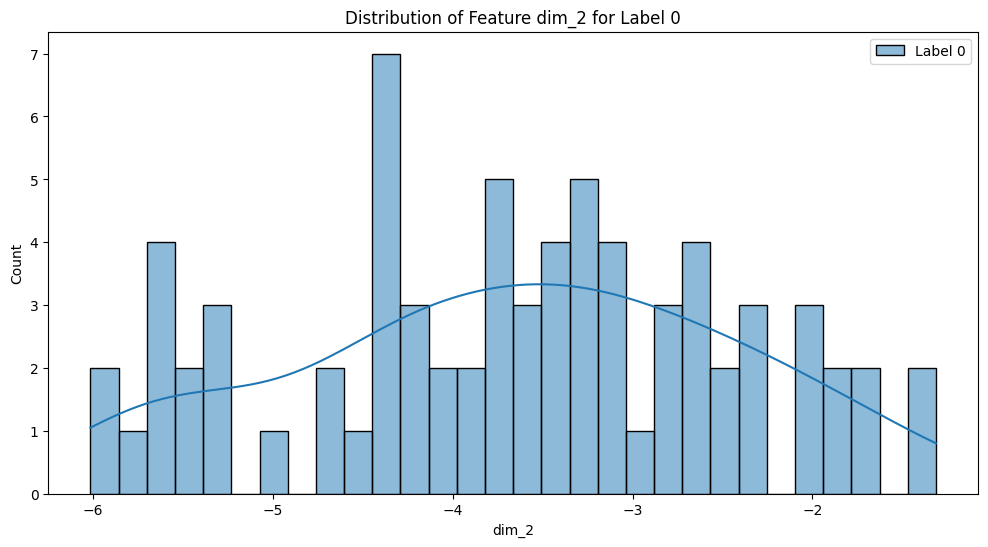

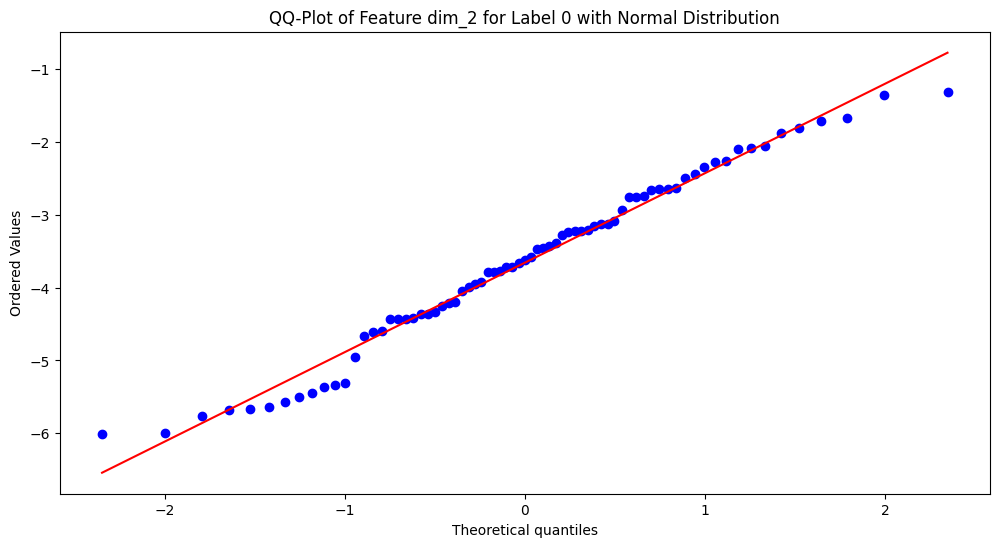

KS-test for Normal distribution (Feature dim_2, Label 0): Statistic = 0.07768400016382221, p-value = 0.7408490016888045
Data seems to follow a Normal distribution (Feature dim_2, Label 0).
Estimated parameters: Mean = -3.65769003025473, Std = 1.2157804121158824


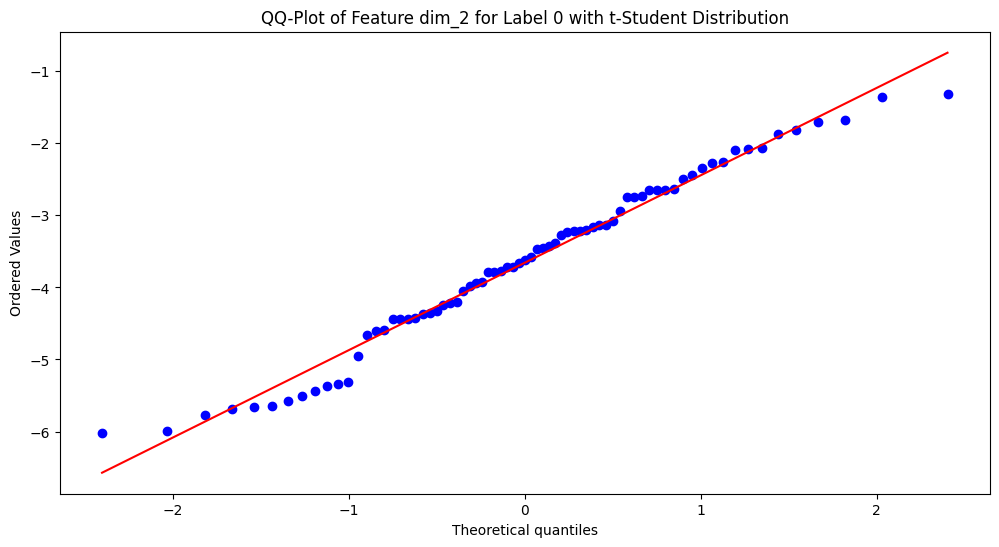

KS-test for t-Student distribution (Feature dim_2, Label 0): Statistic = 0.07916266221015796, p-value = 0.7199846597827891
Data seems to follow a t-Student distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 173822490.0066756, Location = -3.6576742409347904, Scale = 1.2074344668413408


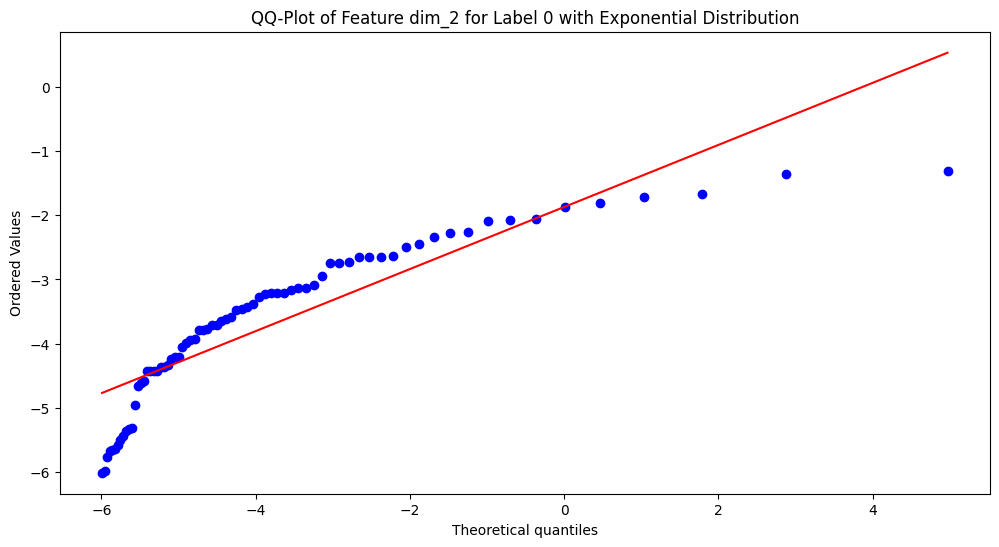

KS-test for Exponential distribution (Feature dim_2, Label 0): Statistic = 0.2690041463572149, p-value = 3.723400613935273e-05
Data does not follow an Exponential distribution (Feature dim_2, Label 0).


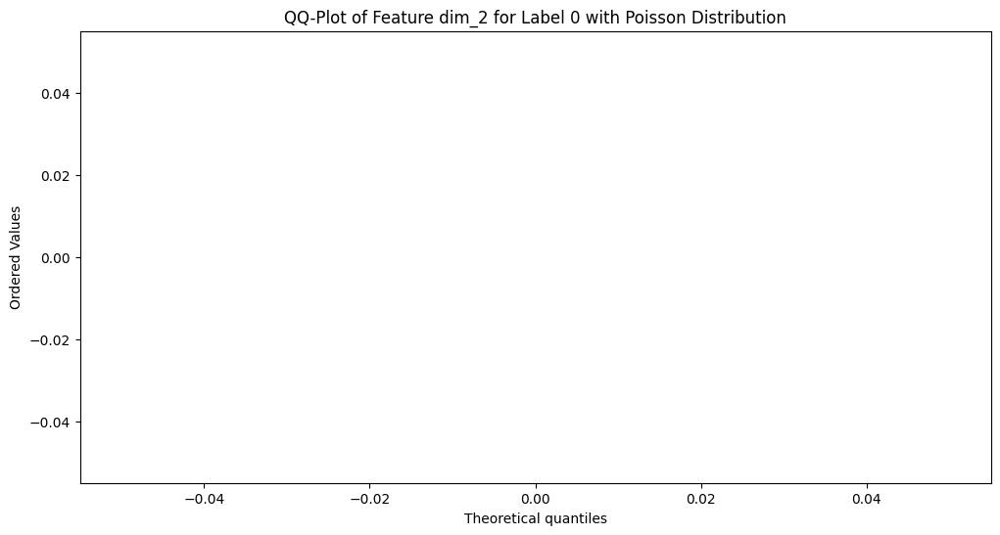

KS-test for Poisson distribution (Feature dim_2, Label 0): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_2, Label 0).


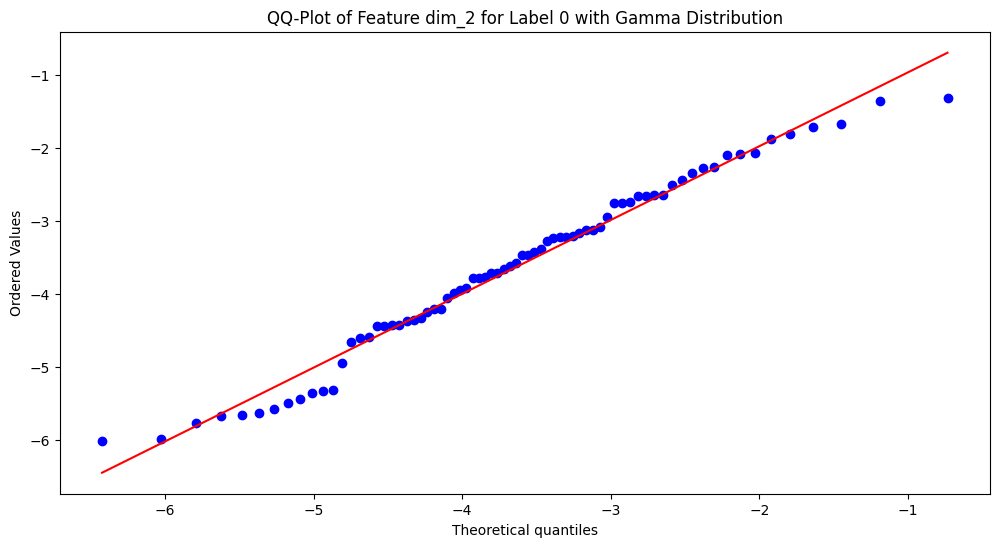

KS-test for Gamma distribution (Feature dim_2, Label 0): Statistic = 0.07993548102257184, p-value = 0.7089795131985721
Data seems to follow a Gamma distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 477.97486494731515, Location = -30.16154947494875, Scale = 0.055440742748976105


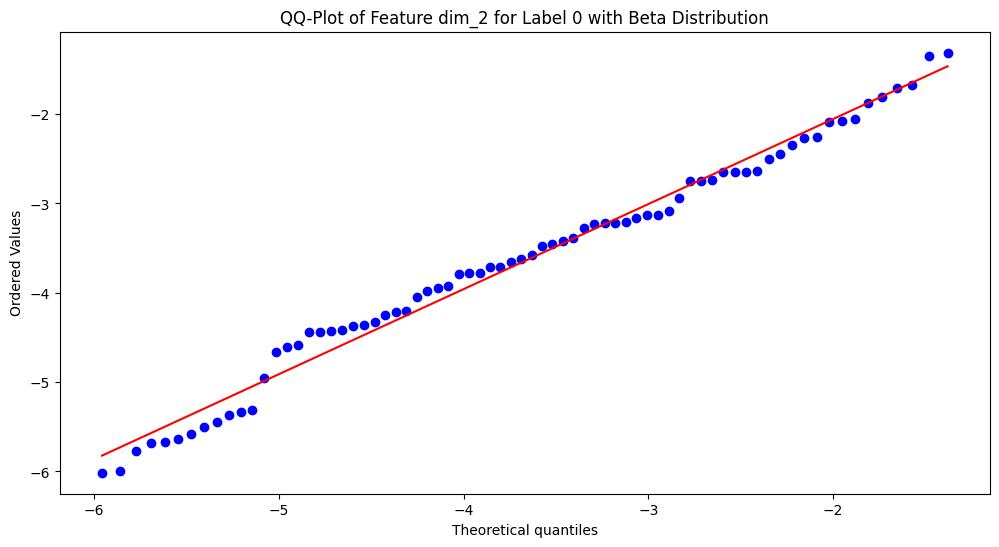

KS-test for Beta distribution (Feature dim_2, Label 0): Statistic = 0.10084038195899359, p-value = 0.420258562109566
Data seems to follow a Beta distribution (Feature dim_2, Label 0).
Estimated parameters: a = 1.2635311170883414, b = 1.282120862558144, Location = -6.051308473476185, Scale = 4.77171373489297


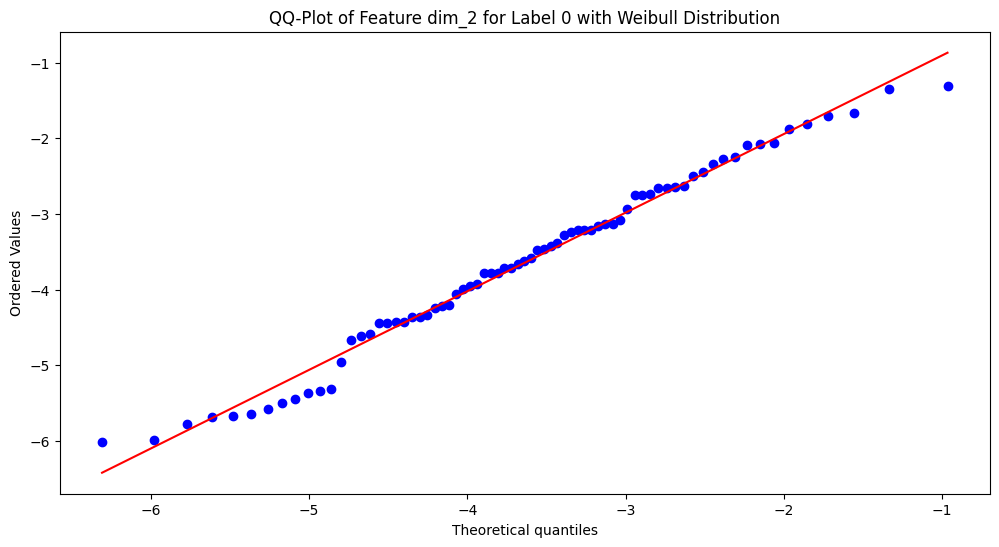

KS-test for Weibull distribution (Feature dim_2, Label 0): Statistic = 0.08007977022490469, p-value = 0.7069184850330685
Data seems to follow a Weibull distribution (Feature dim_2, Label 0).
Estimated parameters: Shape = 3.59865761029776, Location = -7.472658145406341, Scale = 4.242632682694757


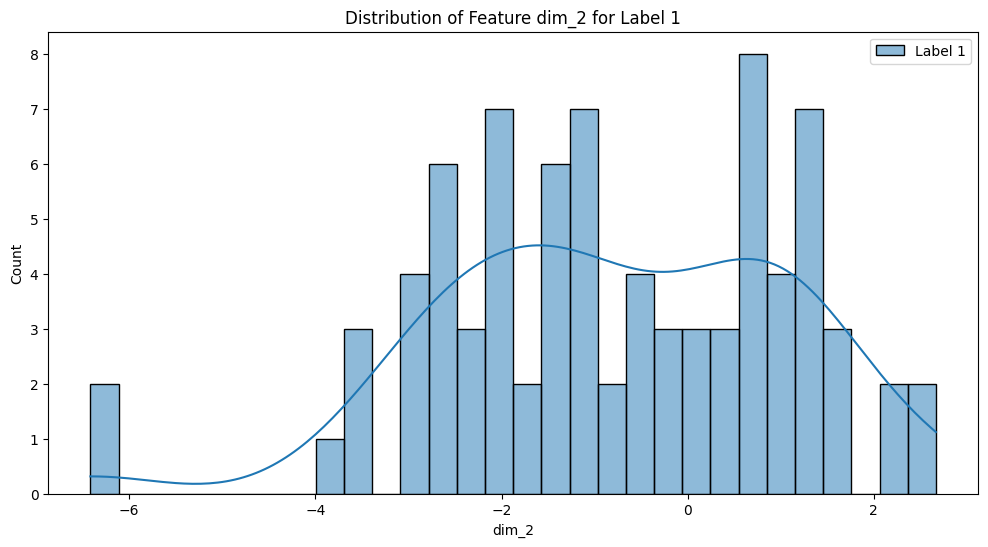

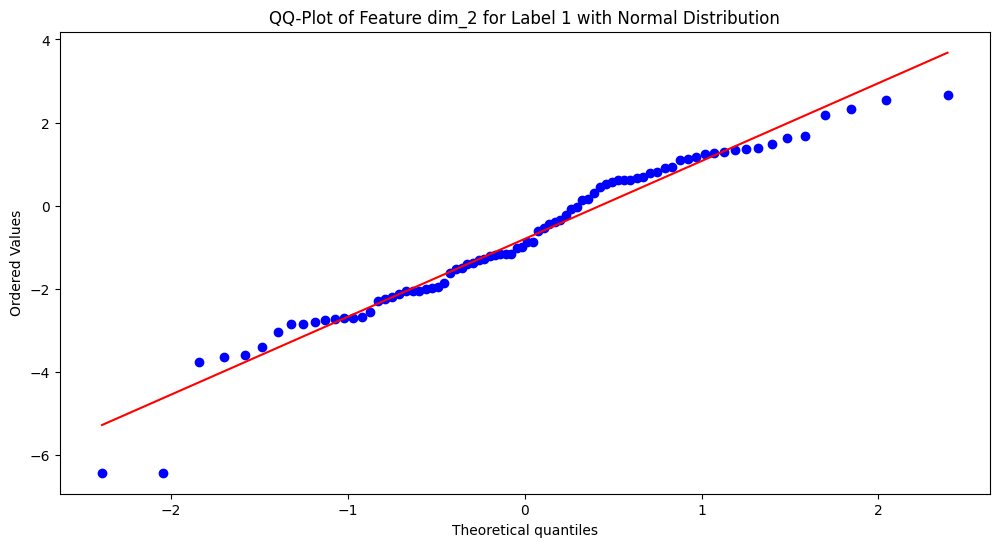

KS-test for Normal distribution (Feature dim_2, Label 1): Statistic = 0.09050867851305477, p-value = 0.4847630316731064
Data seems to follow a Normal distribution (Feature dim_2, Label 1).
Estimated parameters: Mean = -0.7943976851316487, Std = 1.8719528047430898


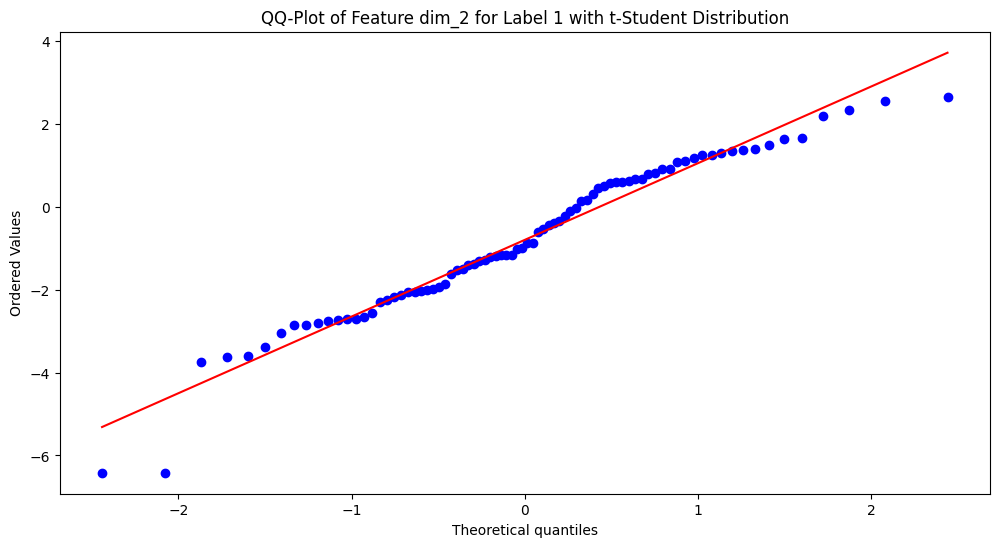

KS-test for t-Student distribution (Feature dim_2, Label 1): Statistic = 0.09231869508158419, p-value = 0.45961882098541007
Data seems to follow a t-Student distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 37.12330898295828, Location = -0.7747050703274365, Scale = 1.8092026389490554


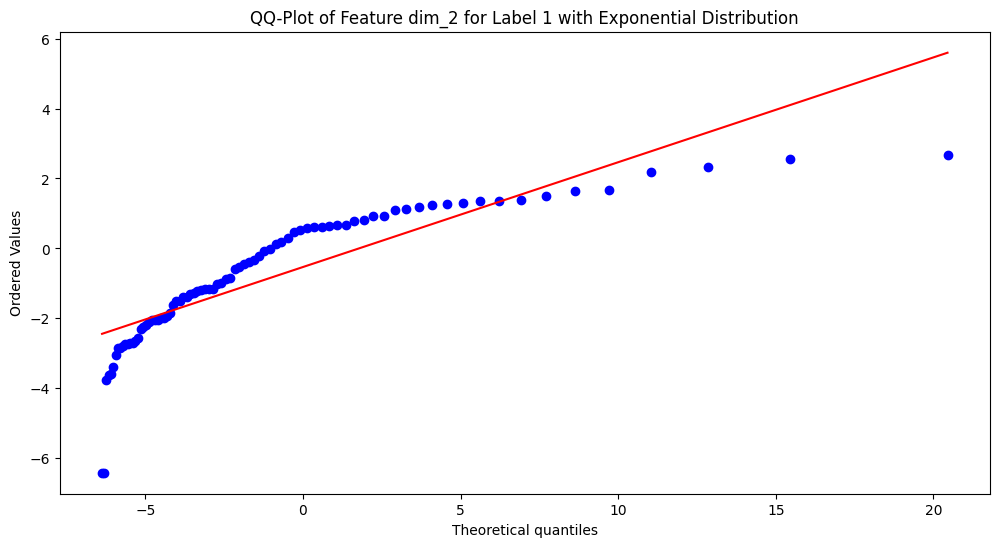

KS-test for Exponential distribution (Feature dim_2, Label 1): Statistic = 0.38436751569438593, p-value = 2.0768713994377683e-11
Data does not follow an Exponential distribution (Feature dim_2, Label 1).


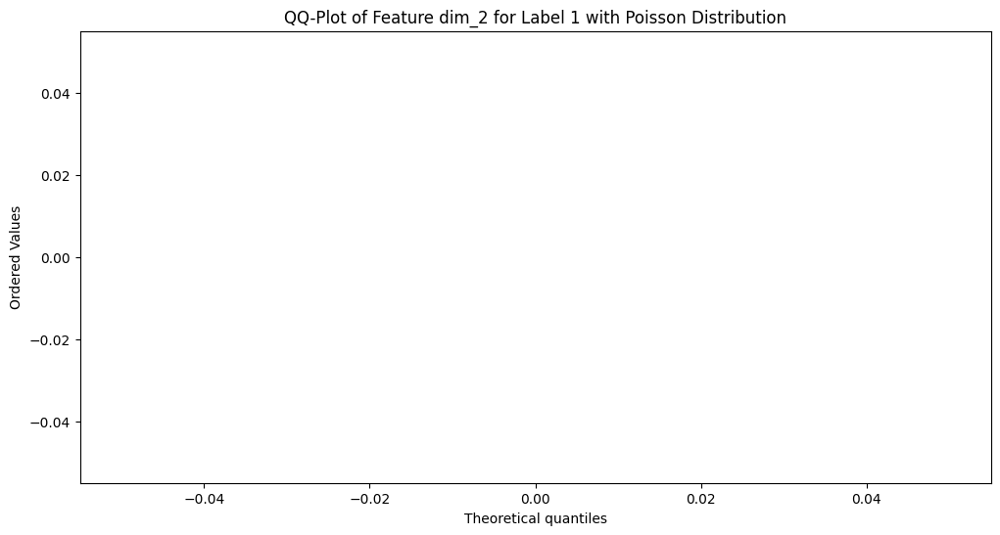

KS-test for Poisson distribution (Feature dim_2, Label 1): Statistic = nan, p-value = nan
Data does not follow a Poisson distribution (Feature dim_2, Label 1).


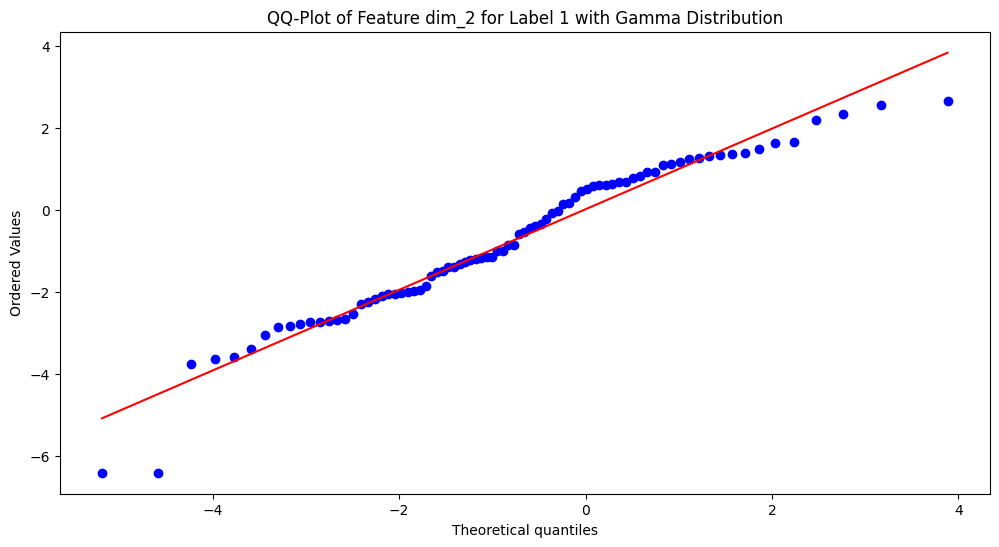

KS-test for Gamma distribution (Feature dim_2, Label 1): Statistic = 0.0955892586600261, p-value = 0.41597162905694995
Data seems to follow a Gamma distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 307.0791300163555, Location = -34.079749432240064, Scale = 0.10830210674539822


/home/haipn/python_env/miniconda3/envs/thyroidcancer/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:785: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


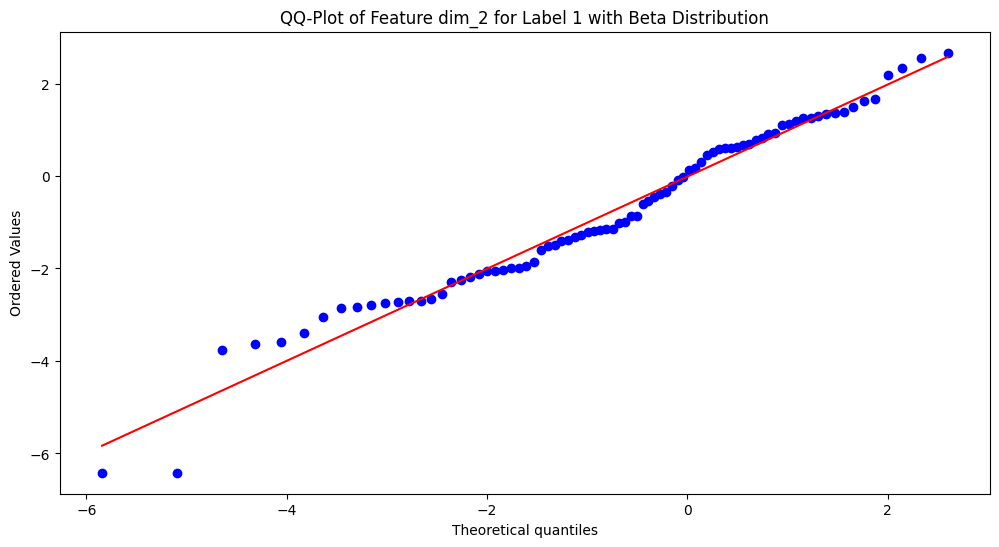

KS-test for Beta distribution (Feature dim_2, Label 1): Statistic = 0.08304957527760293, p-value = 0.5942642905623772
Data seems to follow a Beta distribution (Feature dim_2, Label 1).
Estimated parameters: a = 8.164762731986578, b = 3.180428107400775, Location = -11.366682340828033, Scale = 14.694659309862796


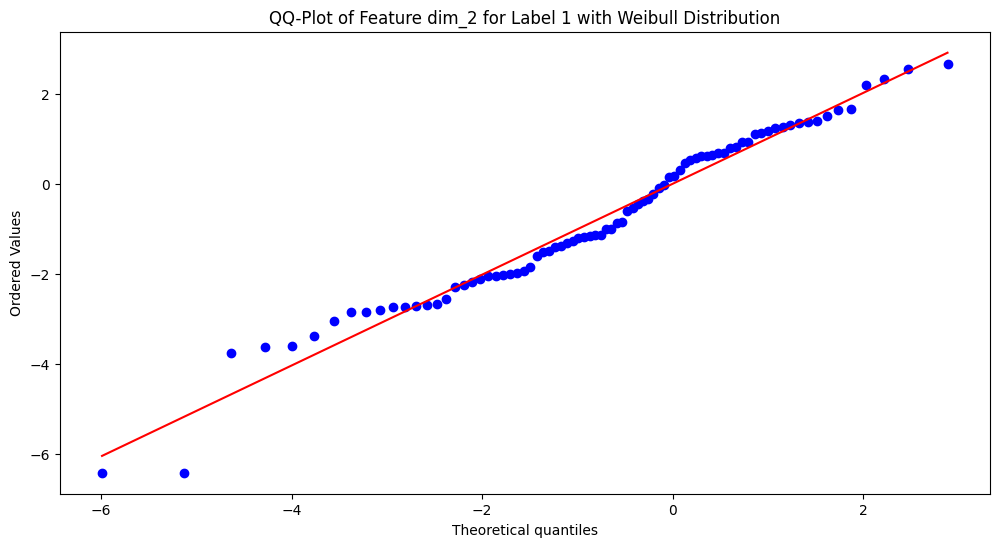

KS-test for Weibull distribution (Feature dim_2, Label 1): Statistic = 0.08640877463637059, p-value = 0.5439591909030359
Data seems to follow a Weibull distribution (Feature dim_2, Label 1).
Estimated parameters: Shape = 7.779008764230634, Location = -13.039478078776682, Scale = 13.023547526629983


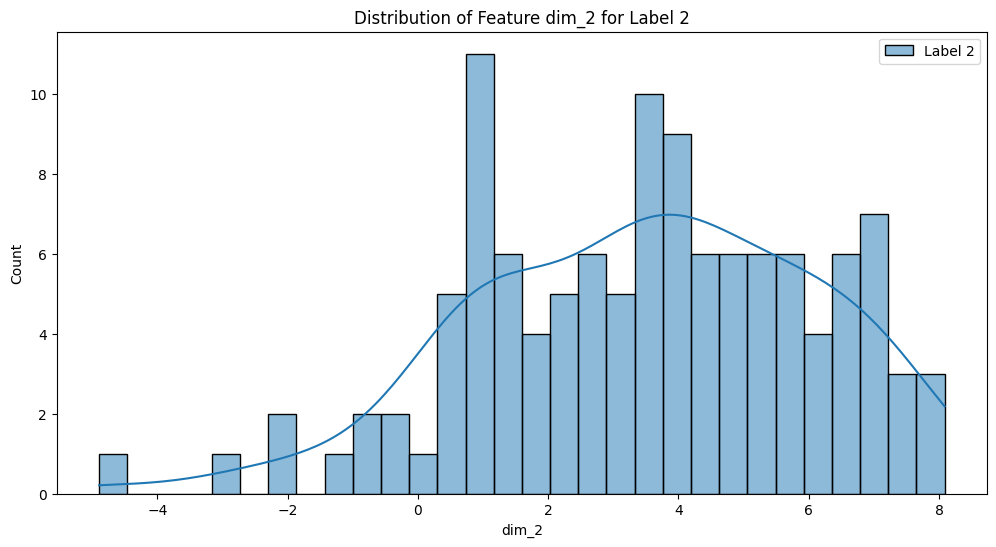

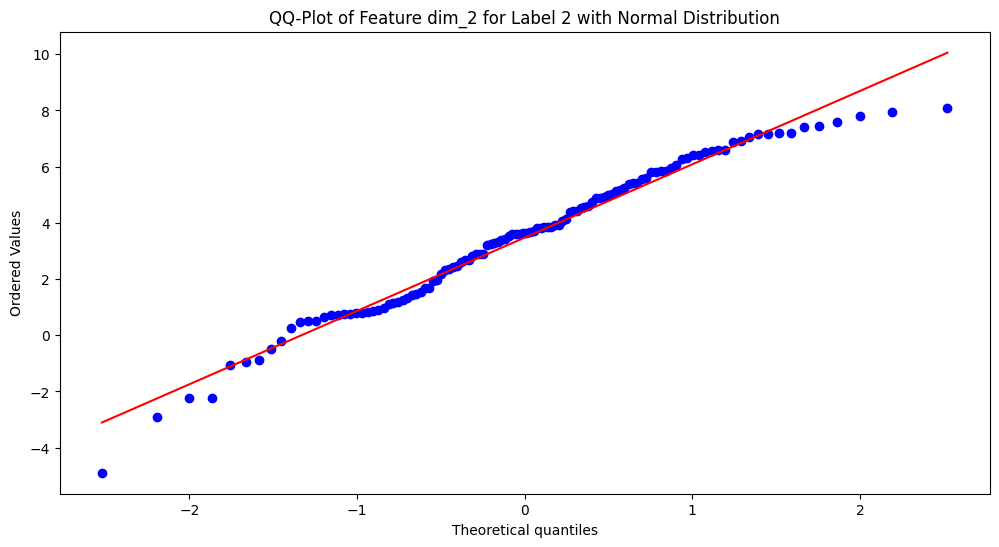

KS-test for Normal distribution (Feature dim_2, Label 2): Statistic = 0.053725408751418346, p-value = 0.8668315648207052
Data seems to follow a Normal distribution (Feature dim_2, Label 2).
Estimated parameters: Mean = 3.4739575476969704, Std = 2.6052759363779607


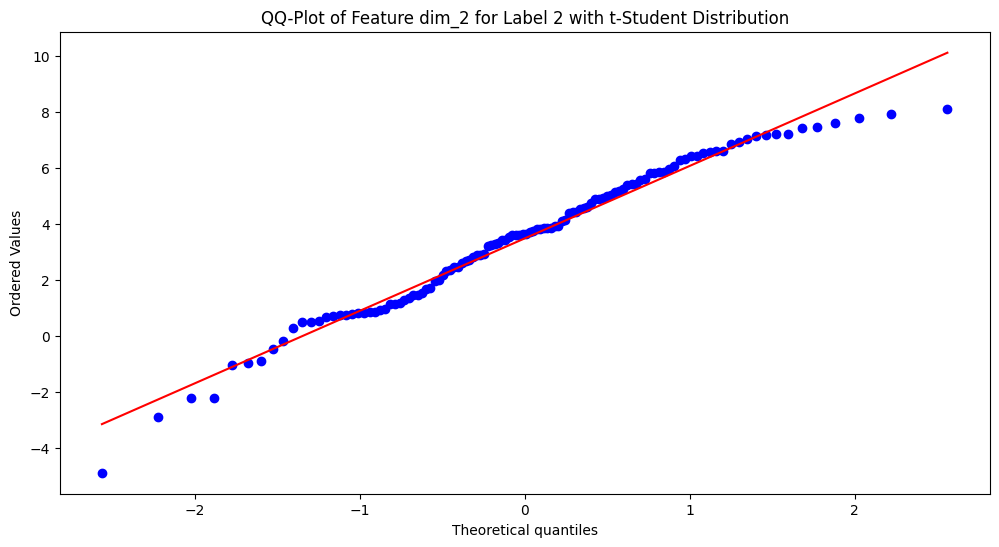

KS-test for t-Student distribution (Feature dim_2, Label 2): Statistic = 0.053558385484337334, p-value = 0.8692096936253415
Data seems to follow a t-Student distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 46728624.97689636, Location = 3.4739496782881805, Scale = 2.594189528035324


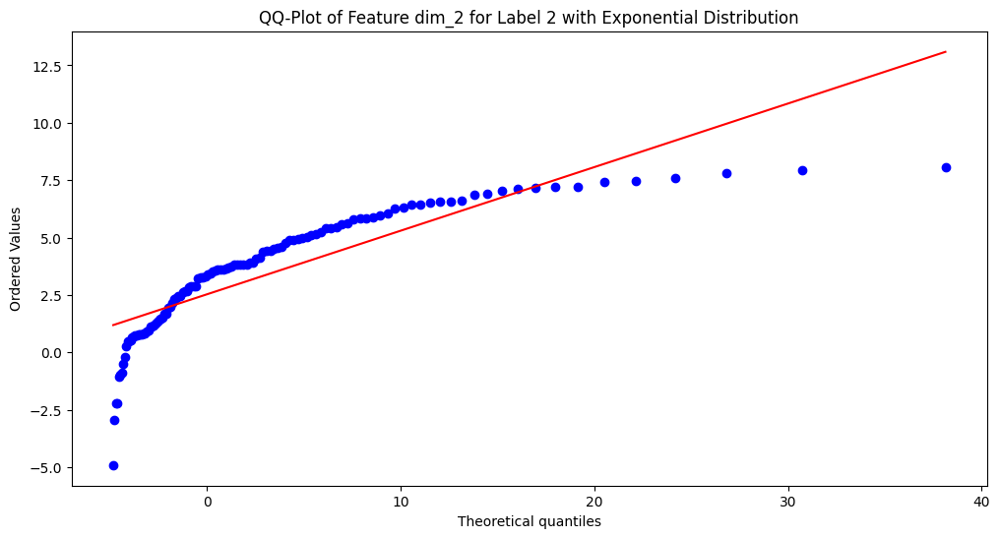

KS-test for Exponential distribution (Feature dim_2, Label 2): Statistic = 0.38892901382761425, p-value = 1.3902329378993614e-16
Data does not follow an Exponential distribution (Feature dim_2, Label 2).


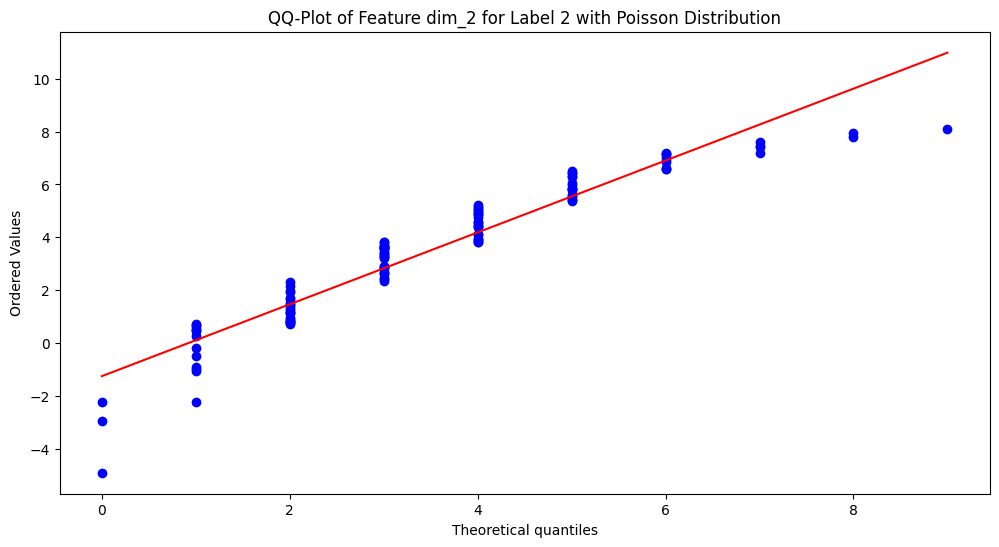

KS-test for Poisson distribution (Feature dim_2, Label 2): Statistic = 0.1745955746493768, p-value = 0.0012886687708358834
Data does not follow a Poisson distribution (Feature dim_2, Label 2).


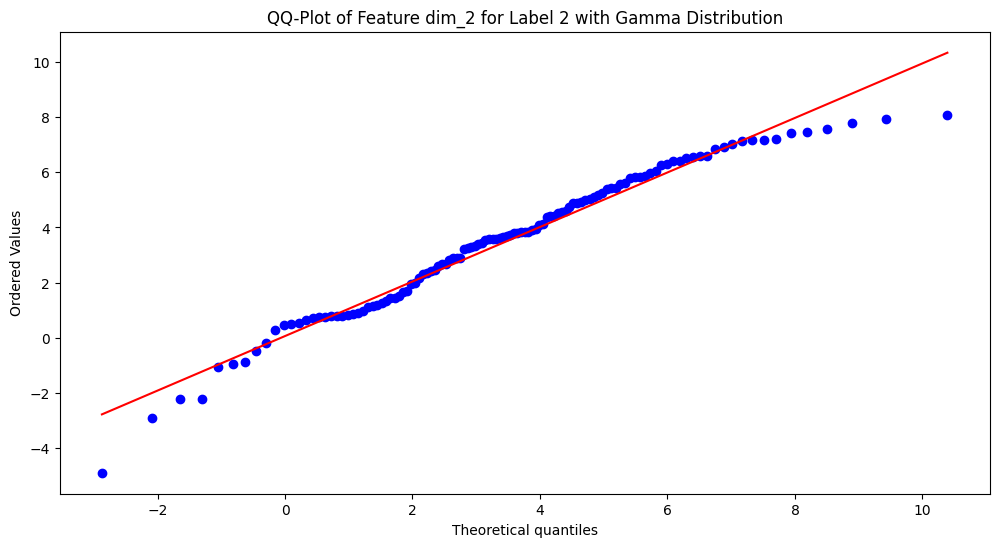

KS-test for Gamma distribution (Feature dim_2, Label 2): Statistic = 0.06597139726666051, p-value = 0.658641757405464
Data seems to follow a Gamma distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 233.56651802382135, Location = -36.75822841284341, Scale = 0.17215930124184808


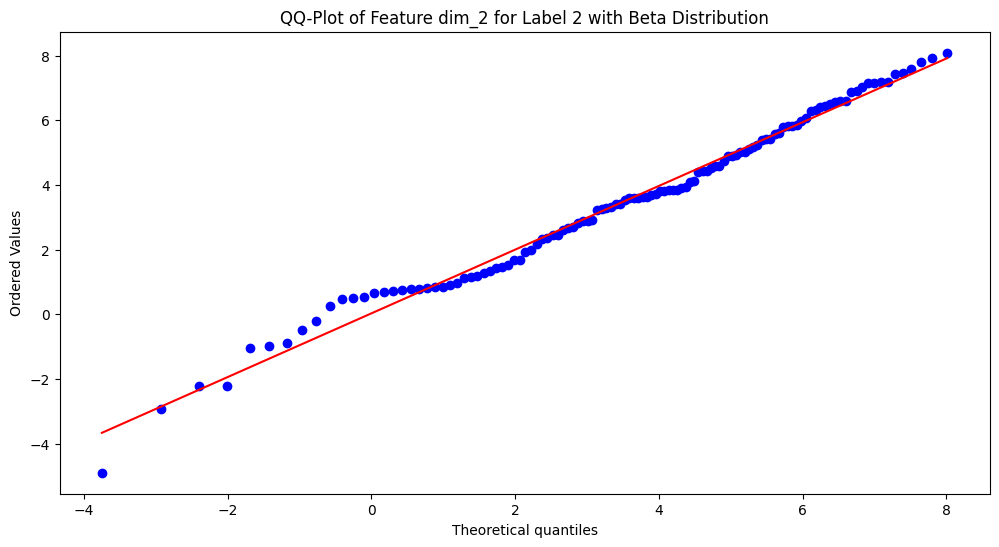

KS-test for Beta distribution (Feature dim_2, Label 2): Statistic = 0.06709414084986187, p-value = 0.6380369443743682
Data seems to follow a Beta distribution (Feature dim_2, Label 2).
Estimated parameters: a = 4.4919451278745335, b = 2.041090443944149, Location = -7.2889225112466525, Scale = 15.676411503923944


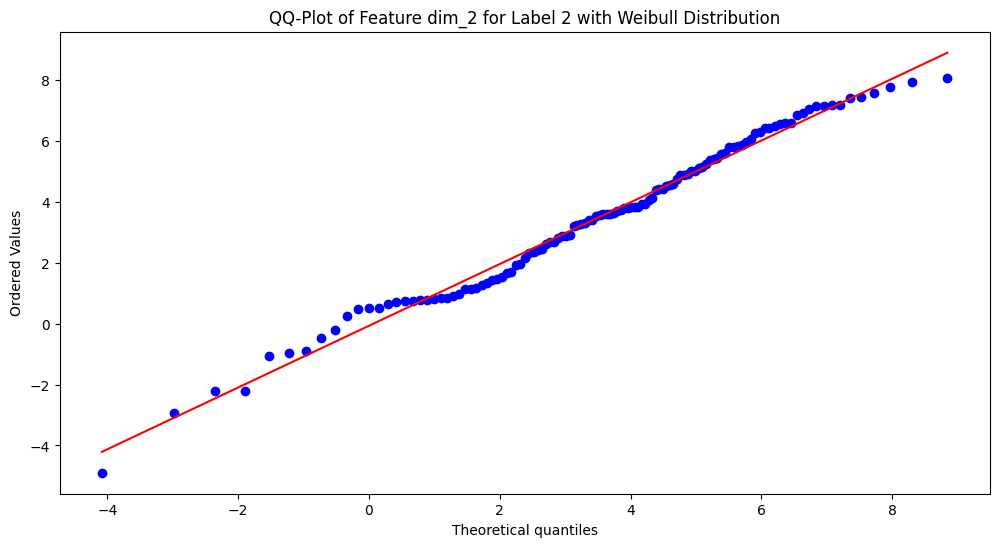

KS-test for Weibull distribution (Feature dim_2, Label 2): Statistic = 0.057665916298667325, p-value = 0.8058805319770019
Data seems to follow a Weibull distribution (Feature dim_2, Label 2).
Estimated parameters: Shape = 7.32258692460832, Location = -12.573996505899778, Scale = 17.12699422904224


In [8]:
# Phân tích cho từng dataset, feature và label
datasets = {'Train': train_df, 'Valid': valid_df, 'Test': test_df}

for dataset_name, dataset in datasets.items():
    print(f'Analyzing dataset: {dataset_name}')
    for feature in features:
        for label in labels:
            data = dataset[dataset['label'] == label]
            analyze_distribution(data, feature, label)